## Convolutional Neural Networks (CNNs)

CNNs are widely used in `computer vision` tasks such as image classification, object detection, and segmentation.

**Traditional neural networks (MLPs) fail with images because:**

    ❌ Too many parameters – A 256x256 image with 3 color channels has 196,608 features!
    ❌ No spatial information – MLPs treat images as flat vectors, losing important relationships.

CNNs solve this using:

    ✅ Local Receptive Fields – Focus on small image regions.
    ✅ Weight Sharing – Use the same filter across different parts of an image.
    ✅ Hierarchical Feature Learning – Extract edges → textures → patterns → objects.

### Core Components of CNN layer

#### Convolutional Layers

A convolution layer is a type of neural network layer that applies a `convolution operation` to the input data.

Convolutional layers are the core building blocks of CNNs.

**How Convolution Works?**

The `convolution operation` involves a `filter` (or `kernel`) that slides over the input data, performing `element-wise multiplications` and `summing the results` to produce a `feature map`.


    1. Slide a small filter (kernel) over the image.
    2. Multiply the filter values with the corresponding pixel values.
    3. Sum the result → This forms a feature map (activation map).
    4. Move the filter (stride) & repeat across the image.

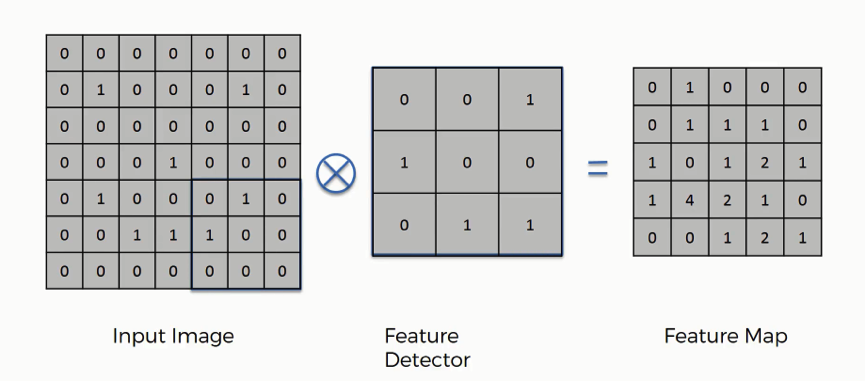

**Key Parameters of a Convolutional Layer:**

#### Kernel (Filter)

Filters are small, learnable matrices that extract specific features from the input data.

* For example, a filter might detect horizontal edges, while another might detect vertical edges.

**Kernel Size (Filter Size):**

* Defines the dimensions of the filter (e.g., 3×3, 5×5).


    Smaller filters (3×3, 5×5) → Capture fine details.
    Larger filters (7×7, 11×11) → Capture high-level features.

During training, the values of these filters are adjusted to optimize the feature extraction process.

#### Stride

It determines how much the filter moves during the convolution operation.

    Stride = 1 → Moves one pixel at a time (preserves details).
    Stride = 2 or more → Moves faster (reduces spatial size), (downsampling).

Larger strides result in smaller output feature maps and faster computations.

####Padding

Adds `extra zero pixels` around the input data to control the spatial dimensions of the output feature map.

**Types of Padding:**

    1. Same Padding (padding='same') → Output size = Input size.
    2. Valid Padding (padding='valid') → No padding, reduces size. - which adds no extra pixels

**Example:**

    No padding → 5×5 image → 3×3 filter → Output = 3×3.
    With padding (1 pixel each side) → Output remains 5×5.

#### What Does out_channels Represent?

- `in_channels` is the number of input channels (e.g., 3 for an RGB image).
- `out_channels` is the number of filters (or kernels) in the convolutional layer. Each filter learns to detect different features (e.g., edges, textures, patterns) from the input.
- The output of the layer will have a depth equal to out_channels.

**How to Decide `out_channels`?**

There’s no strict formula for choosing out_channels, but here are some guidelines:

In a CNN, the number of filters typically increases as you go deeper in the network:

    Early layers: Smaller out_channels (e.g., 16 or 32) to detect basic features.
    Middle layers: Moderate out_channels (e.g., 64 or 128) to combine features.
    Deeper layers: Larger out_channels (e.g., 256 or 512) to capture complex patterns.


    Underfitting: If the model struggles to learn, increase out_channels to give it more capacity.
    Overfitting: If the model memorizes the training data, reduce out_channels or add regularization (e.g., dropout).

Example from popular architectures:

- VGG16: Starts with 64 filters, doubles to 128, 256, and 512 in deeper layers.
- ResNet: Starts with 64 filters and scales up gradually.

**Computational Resources**

More out_channels means more parameters and higher computational cost:
- Each filter has `in_channels * kernel_size * kernel_size` weights.
- Total parameters for the layer = `out_channels * (in_channels * kernel_size * kernel_size + 1)` (the +1 is for the bias term).

If you’re constrained by memory or speed (e.g., on edge devices), keep out_channels lower.

#### output shape

The output shape of a convolutional layer depends on:

    Input size: H × W
    Filter size (Kernel size): K × K
    Stride: S
    Padding: P
    Number of filters: (channels in output)

The height and width of the output feature map can be calculated as:


    H_out = (H − K + 2P)/S +1
    W_out = (W − K + 2P)/S +1

Final Output Shape

    (Batch Size,Output Channels,H_out,W_out)

In [ ]:
import torch
import torch.nn as nn

# Define CNN Layer
conv = nn.Conv2d(in_channels=1, out_channels=16, kernel_size=3, stride=1, padding=1)

# Input Tensor: (Batch=1, Channels=1, Height=28, Width=28)
x = torch.randn(1, 1, 28, 28)

# Get Output
output = conv(x)
print("Output shape:", output.shape)  # Expected: (1, 16, 28, 28)

Output shape: torch.Size([1, 16, 28, 28])


### CNN Architecture

Convolutional Neural Network (CNN) is the `extended version of artificial neural networks (ANN)` which is predominantly used to extract the feature from the grid-like matrix dataset.

Convolutional Neural Network consists of multiple layers like the `input layer`, `Convolutional layer`, `Pooling layer`, and `fully connected layers`.

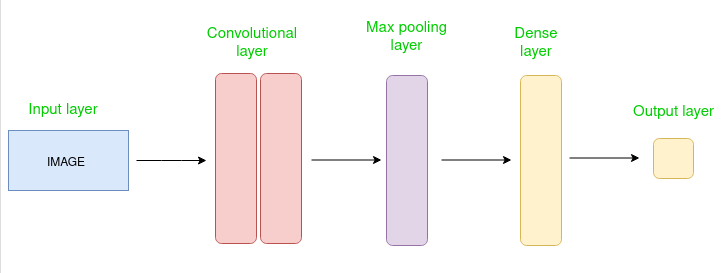

#### Input Layers

* Receives the input data - raw image (height × width × channels).

Although not defined as a layer, our network expects an input data.

#### Convolutional Layers

This is the layer, which is used to extract the feature from the input dataset.

we already discussed before...

#### Activation Layers

An activation function is `a mathematical function` applied to the output of a neuron  decide whether a neuron should be activated for both the hidden layer and the output layer.



---
While building a neural network, one key decision is selecting the Activation Function....

Before diving into the activation function, you should have prior knowledge of the following topics :  Neural Networks, Backpropagation

--- recall NN basics -

- https://colab.research.google.com/drive/1r1olF22yJ98_EcyYN9LLliiPCRXjj0-L?usp=sharing

- https://www.geeksforgeeks.org/activation-functions-neural-networks/

---

**Activation Functions**

* It plays a crucial role in enabling the neural network to model complex, non-linear relationships.

* Without activation functions, the network would only be able to model linear relationships, which would severely limit its capabilities.

| Type                     | Activation Function                 | Formula                                                                                     |
|--------------------------|-------------------------------------|---------------------------------------------------------------------------------------------|
| **Linear**                | Linear Activation                   | `f(x) = x`                                                                                 |
| **Sigmoid**               | Sigmoid                             | `f(x) = 1 / (1 + e^(-x))`                                                                   |
| **Tanh**                  | Hyperbolic Tangent (Tanh)           | `f(x) = (e^x - e^(-x)) / (e^x + e^(-x))`                                                     |
| **ReLU**                  | Rectified Linear Unit (ReLU)        | `f(x) = max(0, x)`                                                                          |
| **Leaky ReLU**            | Leaky ReLU                          | `f(x) = x if x > 0 else α * x`, where `α` is a small constant, e.g., 0.01                    |
| **ELU**                   | Exponential Linear Unit (ELU)       | `f(x) = x if x > 0 else α * (e^x - 1)`, where `α` is a positive constant                     |
| **SELU**                  | Scaled Exponential Linear Unit (SELU)| `f(x) = λ * (x if x > 0 else α * (e^x - 1))`, where `λ` and `α` are constants               |
| **Softmax**               | Softmax                             | `f(x_i) = e^(x_i) / Σ e^(x_j)` for each element `i` of the input vector, outputs a probability distribution |
| **Swish**                 | Swish                               | `f(x) = x / (1 + e^(-x))`                                                                   |
| **GELU**                  | Gaussian Error Linear Unit (GELU)   | `f(x) = 0.5 * x * (1 + tanh(sqrt(2/π) * (x + 0.044715 * x^3)))`                             |
| **Hard Sigmoid**          | Hard Sigmoid                        | `f(x) = max(0, min(1, 0.2 * x + 0.5))`                                                      |
| **Hard Swish**            | Hard Swish                          | `f(x) = x * ReLU6(x + 3) / 6` where `ReLU6(x) = min(max(0, x), 6)`                           |
| **Mish**                  | Mish                                | `f(x) = x * tanh(softplus(x))`, where `softplus(x) = log(1 + e^x)`                            |
| **Step Function** | Step Function (Heaviside)        | `f(x) = 1 if x >= 0 else 0`                                                                  |


#### Choosing the Right Activation Function

| Activation Function   | Range          | Use Case                                        | Default Choice for Layer         | Task                                  |
|-----------------------|----------------|-------------------------------------------------|----------------------------------|---------------------------------------|
| **Step**              | 0 to 1         | Perceptrons, simple tasks                      | Input/Output Layer               | Simple binary classification tasks   |
| **Sigmoid**           | 0 to 1         | Binary classification (output layer)            | Output Layer                     | Binary classification (logistic regression) |
| **Tanh**              | -1 to 1        | Hidden layers (better than sigmoid)             | Hidden Layers                    | Recurrent networks, simple neural networks |
| **ReLU**              | 0 to ∞         | Deep networks (hidden layers)                   | Hidden Layers                    | Deep learning networks, CNNs         |
| **Leaky ReLU**        | -∞ to ∞        | Improves ReLU for negative values               | Hidden Layers                    | Deep networks (to avoid dying ReLU)  |
| **Softmax**           | 0 to 1         | Multi-class classification (output layer)       | Output Layer                     | Multi-class classification (e.g., in CNNs) |
| **ELU**               | -∞ to ∞        | Deep networks, reduces bias shift               | Hidden Layers                    | Deep networks, faster convergence   |
| **SELU**              | -∞ to ∞        | Self-normalizing networks                       | Hidden Layers                    | Deep networks, self-normalizing models |
| **Swish**             | -∞ to ∞        | Networks with large gradients                    | Hidden Layers                    | Improving ReLU-like networks, deep models |
| **GELU**              | -∞ to ∞        | Gaussian error linear units                     | Hidden Layers                    | Transformers, complex deep learning models |
| **Hard Sigmoid**      | 0 to 1         | Efficient approximation of sigmoid               | Output Layer                     | Binary classification in resource-limited environments |
| **Hard Swish**        | 0 to 1         | Efficient ReLU-like activation                   | Hidden Layers                    | Efficient deep learning networks in mobile/edge devices |
| **Mish**              | -∞ to ∞        | Non-monotonic smooth activation function        | Hidden Layers                    | Complex deep learning models, improving ReLU |


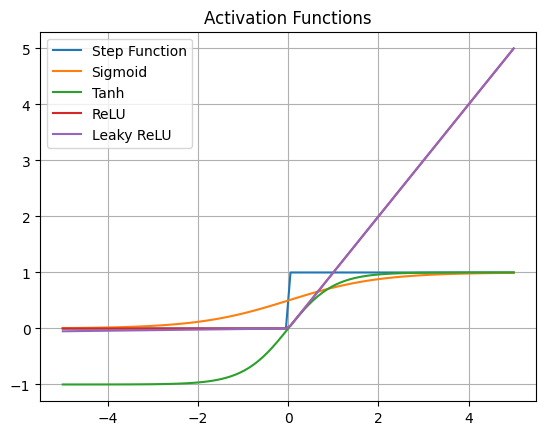

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def step_function(x):
    return np.where(x >= 0, 1, 0)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)

def relu(x):
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.01):
    return np.where(x > 0, x, alpha * x)

x = np.linspace(-5, 5, 100)

plt.plot(x, step_function(x), label="Step Function")
plt.plot(x, sigmoid(x), label="Sigmoid")
plt.plot(x, tanh(x), label="Tanh")
plt.plot(x, relu(x), label="ReLU")
plt.plot(x, leaky_relu(x), label="Leaky ReLU")
plt.legend()
plt.title("Activation Functions")
plt.grid()
plt.show()


#### Pooling Layers

Pooling layer is used in CNNs to `reduce the spatial dimensions` (width and height) of the input feature maps while retaining the most important information.

For a feature map with dimensions h x w × c, the dimensions of the output after a pooling layer are:

    = (h-f+1)/s * (w-f+1)/s * c


where:

    h  → height of the feature map
    w  → width of the feature map
    c  → number of channels in the feature map
    f → size of the pooling filter
    s → stride length

It involves sliding a two-dimensional filter over each channel of a feature map and summarizing the features within the region covered by the filter.

**Why are Pooling Layers Important?**
1. **Dimensionality Reduction:** Pooling layers reduce the spatial size of the feature maps, which decreases the number of parameters and computations in the network. This makes the model faster and more efficient.

2. **Translation Invariance:** Pooling helps the network become invariant to small translations or distortions in the input image. For example, even if an object in an image is slightly shifted, the pooled output will remain relatively unchanged.
3. **Overfitting Prevention:** By reducing the spatial dimensions, pooling layers help prevent overfitting by providing a form of regularization.
4. **Feature Hierarchy:** Pooling layers help build a hierarchical representation of features, where lower layers capture fine details and higher layers capture more abstract and global features.

#### Types of Pooling Layers

**Max Pooling**

- Divides the input into regions (e.g., 2×2 blocks) and outputs the maximum value from each region.
- Thus, the output after max-pooling layer would be a feature map containing the `most prominent features` of the previous feature map.
- Use Case: Best when you want to retain the most prominent features (e.g., edges, textures).

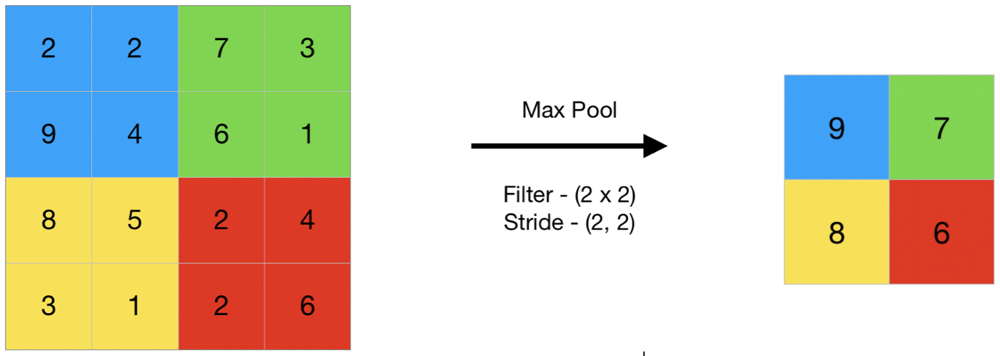

**Average Pooling**
- Divides the input into regions and outputs the average value of each region.
- Average pooling provides a more generalized representation of the input.
- Use Case: Useful when overall background information is important, or for smoothing.

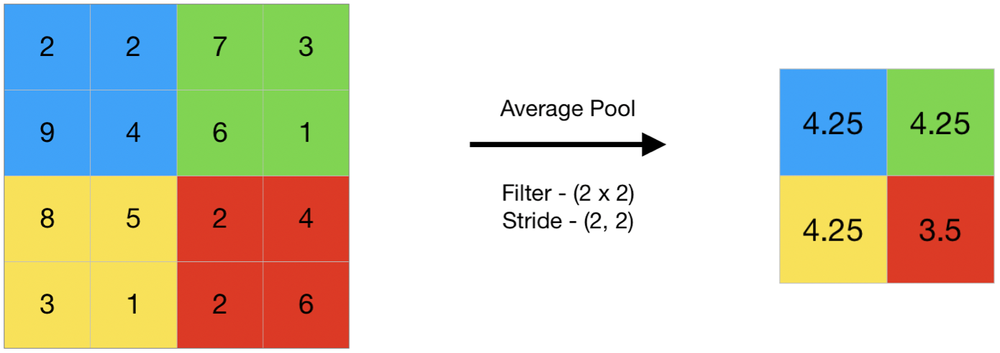

**Global Pooling**
- Instead of using a fixed-size filter, these operations collapse the entire spatial dimensions to a single value per channel.
- Global pooling reduces each channel in the feature map to a single value, producing a 1×1×c output. This is equivalent to applying a filter of size hxw.

**There are two types of global pooling:**

- **Global Max Pooling:** Takes the maximum value across the entire feature map.
- **Global Average Pooling:** Computes the average of all values in the feature map.

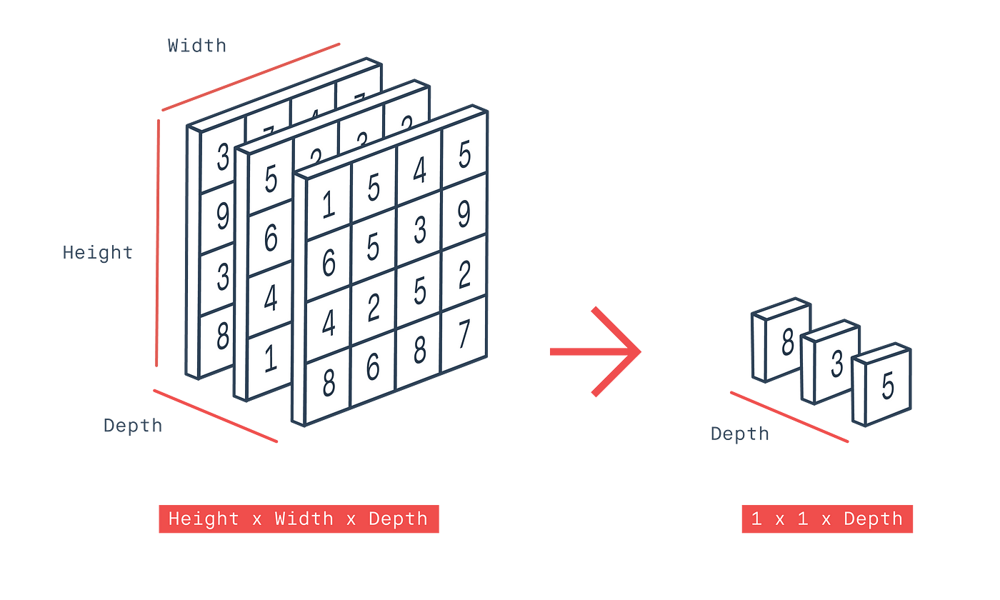

- Use Case: Often used at the end of CNNs to convert feature maps into a vector for fully connected layers.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Create a dummy 4x4 feature map (1 channel, 1 sample)
feature_map = torch.tensor([[[[1, 3, 2, 4],
                              [5, 6, 7, 8],
                              [3, 1, 2, 6],
                              [4, 5, 9, 1]]]], dtype=torch.float32)

# Define pooling layers
max_pool = nn.MaxPool2d(kernel_size=2, stride=2)
avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

# Apply pooling
pooled_max = max_pool(feature_map)
pooled_avg = avg_pool(feature_map)

print("Original Feature Map:\n", feature_map)
print("\nAfter Max Pooling:\n", pooled_max)
print("\nAfter Average Pooling:\n", pooled_avg)


Original Feature Map:
 tensor([[[[1., 3., 2., 4.],
          [5., 6., 7., 8.],
          [3., 1., 2., 6.],
          [4., 5., 9., 1.]]]])

After Max Pooling:
 tensor([[[[6., 8.],
          [5., 9.]]]])

After Average Pooling:
 tensor([[[[3.7500, 5.2500],
          [3.2500, 4.5000]]]])


#### Fully Connected Layers (Dense Layers)

torch.nn.Linear

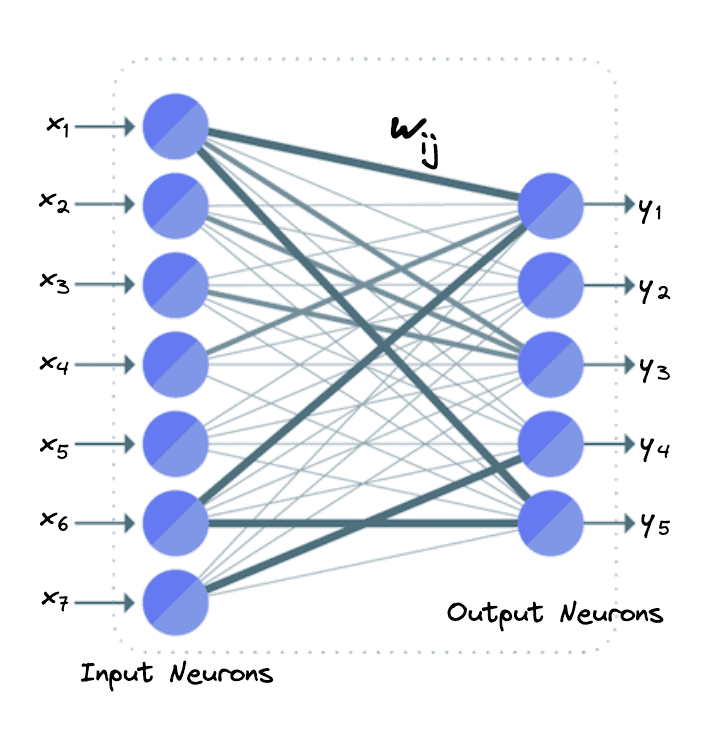

- every input neuron is connected to every output neuron.
- This dense connectivity allows the network to integrate features learned from earlier layers.

    1. Flattening: Before passing data to an FC layer, CNNs typically flatten the multidimensional feature maps into a one-dimensional vector.

    2. Integration: The FC layer learns to map these features to a decision space (e.g., class scores in classification).
    
    3. Final Output: Often, the last FC layer is paired with a Softmax activation to produce class probabilities.

**Mathematical Formulation:**

For an FC layer with input vector x, weights W, bias b, and activation function f:
    
            y = f(W⋅x+b)

    W: Weight matrix (each entry represents a connection strength).
    b: Bias vector.
    f: Non-linear activation function (ReLU, Sigmoid, etc.).

In [ ]:
import torch
import torch.nn as nn

class SimpleNN(nn.Module):
    def __init__(self):
        super(SimpleNN, self).__init__()
        # Define a fully connected layer (input size 784, output size 10)
        self.fc = nn.Linear(in_features=784, out_features=10)  # Example for MNIST (28x28 images)

    def forward(self, x):
        # Pass input through the fully connected layer
        x = self.fc(x)
        return x

# Create a model instance
model = SimpleNN()

# Example input (e.g., a flattened MNIST image with 784 features)
input_data = torch.randn(1, 784)  # Batch size of 1, 784 features

# Get the output of the network
output = model(input_data)
print(output)

tensor([[ 0.5858, -0.7567, -0.2798, -0.2275, -0.4764,  0.4595,  0.1979, -0.7395,
         -1.0311,  0.1546]], grad_fn=<AddmmBackward0>)


**Multilayer Perceptron (MLP):** A neural network built entirely of fully connected layers, often used for simple classification tasks.

FCL vs CNN

- https://medium.com/swlh/fully-connected-vs-convolutional-neural-networks-813ca7bc6ee5

- FC layers often contain a large number of parameters because of their full connectivity, which can lead to overfitting if not properly regularized.

**Applications**

- Classification: FC layers are used in the final stages of CNNs for classifying images (e.g., MNIST, CIFAR-10).

- Regression: For tasks like predicting continuous values, FC layers map features to a single output.

- Feature Embedding: They are also used to produce embeddings for downstream tasks like similarity matching.

#### Basic CNN Architecture

A standard CNN architecture consists of the following layers:

    1️⃣ Input Layer – Takes an image as input (e.g., 28×28 grayscale or 224×224 RGB).
    2️⃣ Convolutional Layers – Extract local patterns and features.
    3️⃣ Activation Function (ReLU) – Introduces non-linearity.
    4️⃣ Pooling Layers (Max/Average Pooling) – Reduces spatial size to make learning efficient.
    5️⃣ Fully Connected (FC) Layers – Flattens the extracted features and connects to output neurons.
    6️⃣ Softmax Layer – Converts outputs into class probabilities.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class BasicCNN(nn.Module):
    def __init__(self):
        super(BasicCNN, self).__init__()

        # 1️⃣ Convolutional Layer 1: Input (3x32x32) → Output (32x32x32)
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)

        # 2️⃣ Convolutional Layer 2: Input (32x32x32) → Output (64x32x32)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)

        # 3️⃣ Pooling Layer: Input (64x32x32) → Output (64x16x16)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # 4️⃣ Fully Connected Layer: Input (64*16*16) → Output (128)
        self.fc1 = nn.Linear(64 * 16 * 16, 128)

        # 5️⃣ Fully Connected Layer: Input (128) → Output (10 classes)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        # Convolution + ReLU + Pooling
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))

        # Flatten the tensor
        x = x.view(x.shape[0], -1)

        # Fully connected layers with ReLU
        x = F.relu(self.fc1(x))
        x = self.fc2(x)  # No activation, as we use CrossEntropyLoss later
        return x

# Instantiate the model
model = BasicCNN()
print(model)

BasicCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=16384, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)


train the CNN model on CIFAR-10 datase

In [ ]:
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

# Load CIFAR-10 dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
for epoch in range(5):  # 5 epochs
    running_loss = 0.0
    for images, labels in trainloader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss/len(trainloader)}")

print("Training complete!")

### Types of Convolutions

- Convolution operations are a fundamental building block in Convolutional Neural Networks (CNNs)
- Different types of convolutions are used for various purposes, depending on the task or the computational efficiency required.

#### Standard Convolution (Regular 2D Convolution)

This is the basic convolution operation where a filter (kernel) slides over an input image and performs dot product operations.

💡 Example: A 3×3 filter applied to a 5×5 image

    Feature Map = (Image) * (Filter)

Key Parameters:

    1. Kernel Size (e.g., 3×3, 5×5)
    2. Stride (How much the filter moves)
    3. Padding (Zero-padding to maintain size)

🔹 Used in: Traditional CNN architectures (VGG, ResNet, AlexNet, etc.)

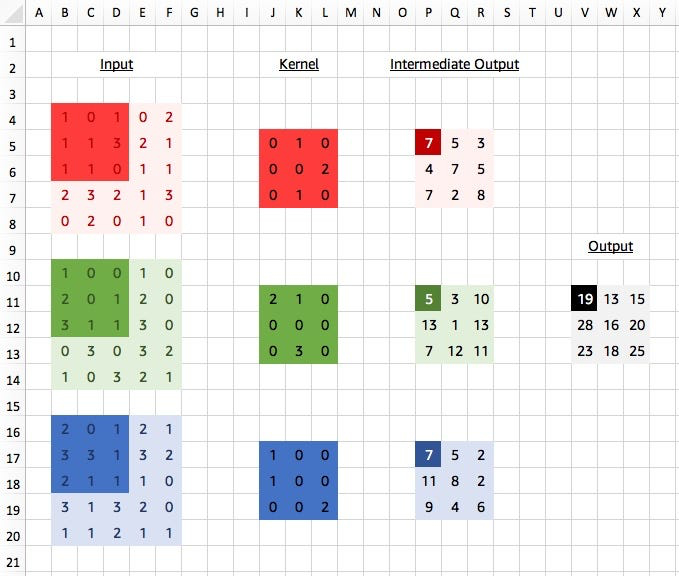

In a standard convolution, a filter (e.g., 3x3) has a depth equal to the number of input channels (e.g., `channels_in`). It slides over the input feature map (e.g., an image or intermediate layer) and computes a weighted sum across all input channels at each spatial position, producing a single output value per position. If you have` channels_out` filters, you get an output feature map with `channels_out` channels.

In [ ]:
import torch
import torch.nn as nn

# Input: 3 channels (RGB), Output: 16 feature maps, 3x3 kernel
conv = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1)
input = torch.randn(1, 3, 32, 32)  # Batch of 1 image
output = conv(input)  # Shape: (1, 16, 32, 32) with padding=1

#### What Does out_channels Represent?

- `in_channels` is the number of input channels (e.g., 3 for an RGB image).
- `out_channels` is the number of filters (or kernels) in the convolutional layer. Each filter learns to detect different features (e.g., edges, textures, patterns) from the input.
- The output of the layer will have a depth equal to out_channels.

**How to Decide `out_channels`?**

There’s no strict formula for choosing out_channels, but here are some guidelines:

In a CNN, the number of filters typically increases as you go deeper in the network:

    Early layers: Smaller out_channels (e.g., 16 or 32) to detect basic features.
    Middle layers: Moderate out_channels (e.g., 64 or 128) to combine features.
    Deeper layers: Larger out_channels (e.g., 256 or 512) to capture complex patterns.


    Underfitting: If the model struggles to learn, increase out_channels to give it more capacity.
    Overfitting: If the model memorizes the training data, reduce out_channels or add regularization (e.g., dropout).

Example from popular architectures:

- VGG16: Starts with 64 filters, doubles to 128, 256, and 512 in deeper layers.
- ResNet: Starts with 64 filters and scales up gradually.

**Computational Resources**

More out_channels means more parameters and higher computational cost:
- Each filter has `in_channels * kernel_size * kernel_size` weights.
- Total parameters for the layer = `out_channels * (in_channels * kernel_size * kernel_size + 1)` (the +1 is for the bias term).

If you’re constrained by memory or speed (e.g., on edge devices), keep out_channels lower.

#### 1D Convolution


- A 1D filter slides along a single dimension of the input (e.g., a time series or sequence).
- Use case: Signal processing  (WaveNet), audio analysis, or natural language processing (e.g., text as a sequence).

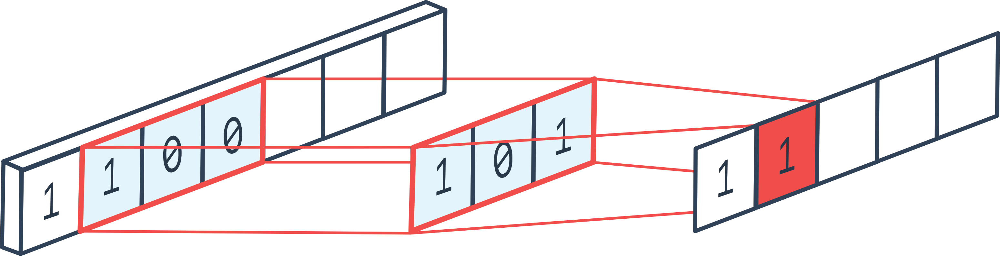

In [ ]:
# Input: 1 channel, Output: 8 feature maps, kernel size 5
conv1d = nn.Conv1d(in_channels=1, out_channels=8, kernel_size=5)
input = torch.randn(1, 1, 100)  # e.g., a time series of length 100
output = conv1d(input)  # Shape: (1, 8, 96)

#### 3D Convolution


- A 3D filter moves across a 3D input (width, height, depth—like video frames or volumetric data).
- Captures spatio-temporal or volumetric patterns.
- Use case: Video analysis (capturing motion across frames) or medical imaging (e.g., MRI scans).

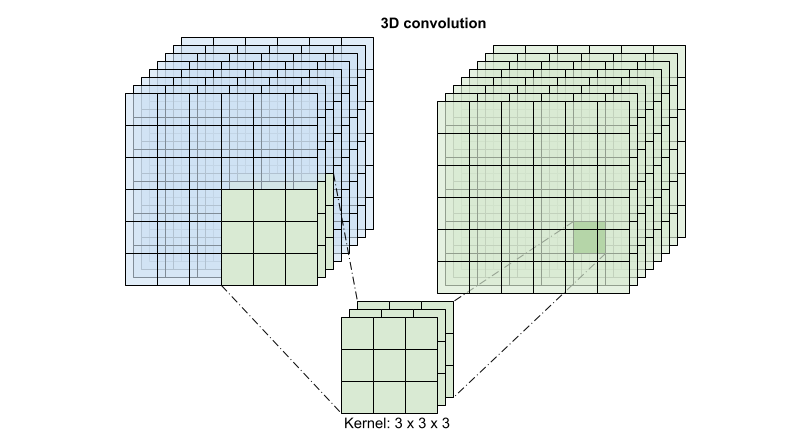

In [ ]:
# Input: 3 channels, Output: 16 feature maps, 3x3x3 kernel
conv3d = nn.Conv3d(in_channels=3, out_channels=16, kernel_size=3, padding=1)
input = torch.randn(1, 3, 10, 32, 32)  # e.g., 10 frames of 32x32 video
output = conv3d(input)  # Shape: (1, 16, 10, 32, 32)

#### Pointwise Convolution (1×1 convolution)

Pointwise convolution uses a 1x1 filter to operate across the depth (channels) of the input, without sliding spatially.

- Does not perform spatial filtering. Instead, it reduces/increases channel depth (Dimensionality Reduction)
- Used in ResNet, GoogleNet, Squeeze-and-Excitation Networks (SENet)

**How It Works: Dimensions**

Consider an input feature map with shape (height, width, channels_in):


- A pointwise convolution uses a filter of size (1, 1, channels_in, channels_out).
- Since the spatial extent is 1x1, it preserves the spatial dimensions (assuming stride=1 and no padding)
- yielding an output shape of (height, width, channels_out).

**Why Use Pointwise Convolution?**

- **Channel Adjustment:** It can increase or decrease the number of channels (controlled by channels_out), allowing dimensionality reduction or expansion.
- **Efficiency:** In separable convolutions, it reduces computation compared to applying a full standard convolution.
- **Non-linearity:** When followed by an activation function (e.g., ReLU), it introduces additional non-linearity to the model.

continuity - Role of Pointwise convolution in `Depthwise Separable` Convolution

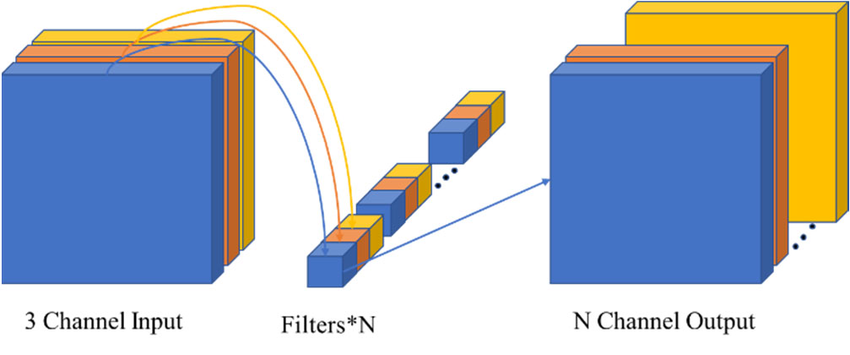

In [ ]:
# 1x1 conv to mix channels: 3 input channels to 16 output channels
pointwise = nn.Conv2d(3, 16, kernel_size=1)
input = torch.randn(1, 3, 32, 32)
output = pointwise(input)  # Shape: (1, 16, 32, 32)

#### Depthwise Convolution

**Recap: Standard Convolution**

In a standard convolution, a filter (e.g., 3x3) has a depth equal to the number of input channels (e.g., `channels_in`). It slides over the input feature map (e.g., an image or intermediate layer) and computes a weighted sum across all input channels at each spatial position, producing a single output value per position. If you have` channels_out` filters, you get an output feature map with `channels_out` channels.

 - This process mixes spatial and channel information in one go but can be `computationally expensive`.
 - `Depthwise convolution` splits this process by focusing only on spatial filtering without mixing channels.

Instead of using a single filter that spans all input channels, depthwise convolution applies `one filter per input channel`.

- The output has the same number of channels as the input (channels_in)

Unlike standard convolution, there’s no summation across channels—each output channel corresponds directly to one input channel.

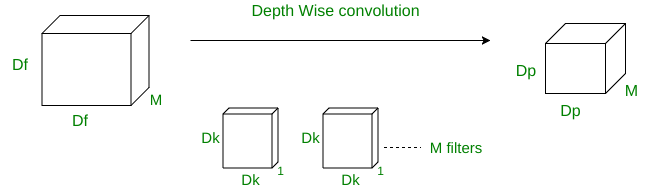

https://www.geeksforgeeks.org/depth-wise-separable-convolutional-neural-networks/

PyTorch doesn’t have a direct "depthwise" layer, but you can mimic it with groups:

- groups=3 ensures each input channel gets its own filter.

In [ ]:
# Depthwise: 3 input channels, 3 output channels (1 filter per input channel)
depthwise = nn.Conv2d(3, 3, kernel_size=3, groups=3, padding=1)
input = torch.randn(1, 3, 32, 32)
output = depthwise(input)  # Shape: (1, 3, 32, 32)

#### Depthwise Separable Convolution (MobileNet Style)

Combine depthwise and pointwise:

Why use it?

- Reduces computational cost (almost 8-9x fewer parameters)
- Used in mobile-friendly architectures (MobileNet, EfficientNet)

In [ ]:
class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1, groups=in_channels)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        return x

# Model
model = DepthwiseSeparableConv(3, 16)
output = model(x)
print("Depthwise Separable Conv Output Shape:", output.shape)

#### Dilated Convolution (Atrous Convolution)

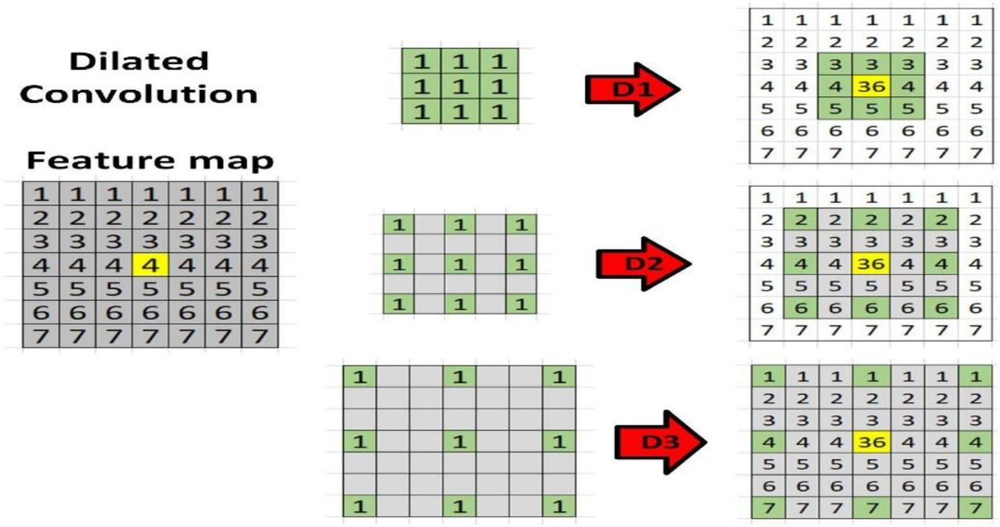

The filter is "dilated" by inserting gaps between its elements. The dilation rate (denoted l) controls the spacing:

- l=1: No gaps, equivalent to standard convolution (e.g., 3x3 kernel samples a 3x3 region).
- l=2: One gap between elements (e.g., a 3x3 kernel samples a 5x5 region, skipping every other pixel).
- l=3: Two gaps (e.g., a 3x3 kernel samples a 7x7 region).

Mechanics

Sampling: Instead of applying the filter to adjacent input positions, it samples points spaced l apart. For a 1D example with a 3-element kernel
[w0, w1, w2]:

    l=1: Samples x[i−1],x[i],x[i+1].
    l=2: Samples x[i−2],x[i],x[i+2].
    
Parameters: The number of weights remains the same (e.g., 9 for a 3x3 kernel), but the filter "sees" a larger area without downsampling the input or adding computation.

Use case: Semantic segmentation or tasks needing a broader context without downsampling.

Used in DeepLabV3+ for Segmentation

In [ ]:
# 2D conv with dilation=2 (gaps between filter elements)
dilated_conv = nn.Conv2d(3, 16, kernel_size=3, padding=2, dilation=2)
input = torch.randn(1, 3, 32, 32)
output = dilated_conv(input)  # Shape: (1, 16, 30, 30)

#### Grouped Convolutions

Instead of convolving all input channels together, it `divides channels into separate groups`

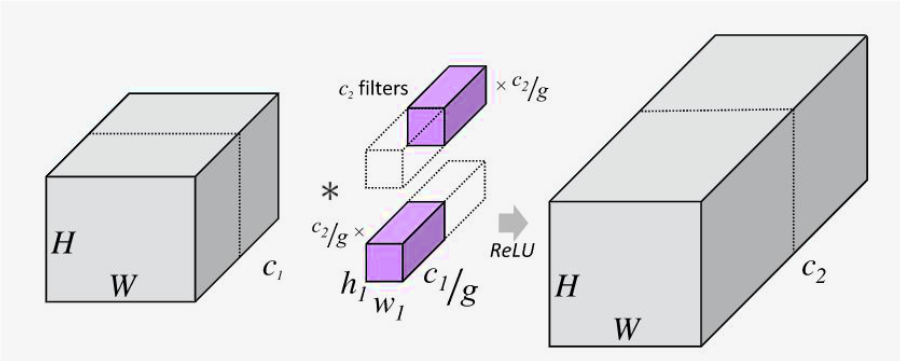

This reduces the number of parameters and computations compared to a standard convolution, as the filters in one group don’t interact with the channels in another group.

Formally:

Let’s say the input has C_in channels, and we want C_out output channels.
* In a standard convolution, the filter size is `C_in × K × K × C_out` (where K is the kernel size), and the computation scales with `C_in × C_out`.

* In a grouped convolution with G groups, the input channels are split into G groups of `C_in/G` channels each, and each group is processed by `C_out/G` filters. The total filter size becomes `G × (C_in/G) × K × K × (C_out/G)`, reducing the computation by a factor of G.

Example: Grouped (e.g., G=4): Split the 8 channels into 4 groups (2 channels each). Each group gets 4 filters that only look at its 2 channels. Concatenate the results → still 16 output channels, but fewer computations.

Examples in Practice

* AlexNet (2012): One of the earliest uses of grouped convolutions, where the network was split across `two GPUs`, effectively using G=2.

* MobileNet: Uses `depthwise separable convolutions`, a special case of grouped convolutions where G = C_in (each input channel gets its own filter), followed by a 1x1 convolution.

* ResNeXt: Introduces "cardinality" (number of groups) `as a hyperparameter`, showing that increasing the number of groups can improve accuracy while keeping computation manageable.

In [ ]:
class GroupedConv(nn.Module):
    def __init__(self, in_channels, out_channels, groups=2):
        super(GroupedConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, groups=groups)

    def forward(self, x):
        return F.relu(self.conv(x))

# Test
model = GroupedConv(4, 16, groups=2)  # in_channels must be a multiple of groups
x = torch.rand(1, 4, 32, 32)  # Change input to match in_channels
output = model(x)
print("Grouped Conv Output Shape:", output.shape)

#### Transposed (Deconvolution) Convolution

* Works opposite to standard convolution, increasing spatial dimensions.
* Used for upsampling feature maps in tasks like image segmentation (UNet, DeepLab) or GANs (DCGAN, SRGAN).

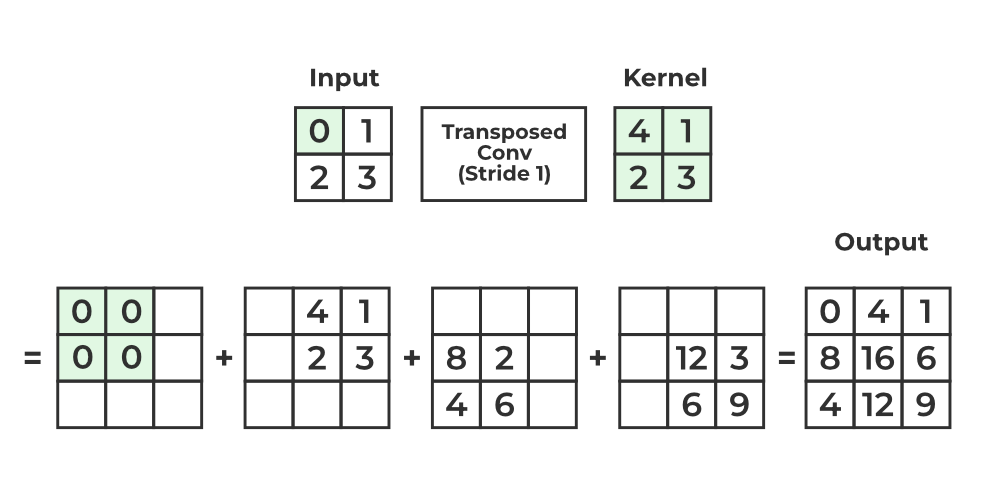

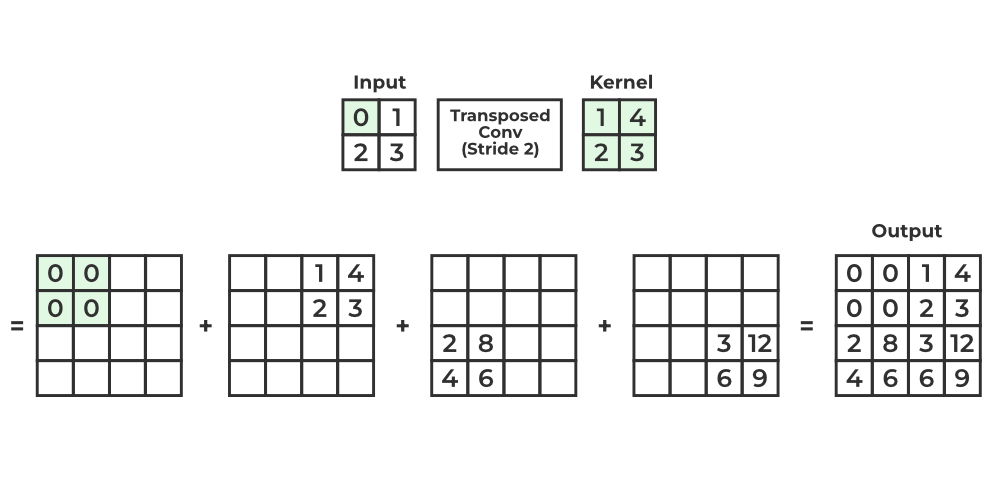

Libraries like TensorFlow or PyTorch handle this with functions like `Conv2DTranspose` or `conv_transpose2d`.

Key Parameters

1. **Kernel Size:** Size of the filter (e.g., 3x3).
2. **Stride:** Controls how much the output grows. A stride of 2 in transposed convolution doubles the spatial dimensions (minus edge effects).
3. **Padding:** Adjusts the exact output size. "Same" padding ensures the output size matches a specific formula; "valid" padding (none) lets it grow naturally.
4. **Output Padding:** Fine-tunes the output size to fix small mismatches.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class TransposedConv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3):
        super(TransposedConv, self).__init__()
        self.conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride=2, padding=1, output_padding=1)

    def forward(self, x):
        return F.relu(self.conv(x))

# Test
x = torch.rand(1, 3, 2, 2)
model = TransposedConv(3, 3)
output = model(x)
print(x,'\n')
print("Transposed Conv Output Shape:", output.shape)
output

tensor([[[[0.0059, 0.8329],
          [0.2687, 0.2079]],

         [[0.2151, 0.3820],
          [0.9242, 0.6742]],

         [[0.7421, 0.0895],
          [0.0996, 0.9067]]]]) 

Transposed Conv Output Shape: torch.Size([1, 3, 4, 4])


tensor([[[[0.2015, 0.0761, 0.2462, 0.2236],
          [0.1289, 0.2291, 0.1252, 0.0692],
          [0.0893, 0.2359, 0.1936, 0.1122],
          [0.1177, 0.0349, 0.1447, 0.1523]],

         [[0.0000, 0.1204, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0649, 0.0000],
          [0.0000, 0.1272, 0.0000, 0.0000],
          [0.0000, 0.0412, 0.0086, 0.0000]],

         [[0.1711, 0.2266, 0.1548, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000],
          [0.2252, 0.0000, 0.2841, 0.1452],
          [0.0000, 0.0828, 0.0000, 0.0316]]]], grad_fn=<ReluBackward0>)

#### Deformable Convolution

* Standard convolutions use fixed grid patterns
* Deformable convolutions allow flexible sampling (learnable offsets)
* Helps in tasks like face recognition, pose estimation

In deformable convolutions, we introduce a grid R that is augmented by offsets Δpₙ.

For a standard convolution at position p0 in the output feature map:

    y(p0) = ∑pₙ∈R	w(pₙ⋅x(p0+pₙ)

In deformable convolution:

    y(p0) = ∑pₙ∈R    w(pₙ)⋅x(p0+pₙ+Δpₙ)

How It Works

Here’s the step-by-step:

* Standard Convolution Recap: Normally, a 3x3 kernel samples 9 fixed points in the input feature map, computes a weighted sum, and produces an output.

* Offset Learning: Deformable convolution adds a parallel branch that predicts offsets (Δx, Δy) for each of those 9 points. These offsets are learned during training and can be fractional (e.g., 0.5, -1.2).
* Deformed Sampling: The original grid positions are adjusted by these offsets, so the kernel samples from shifted locations in the input. Bilinear interpolation is used to handle non-integer coordinates.
* Output: The convolution is applied to these deformed sampling points, producing the final feature map.

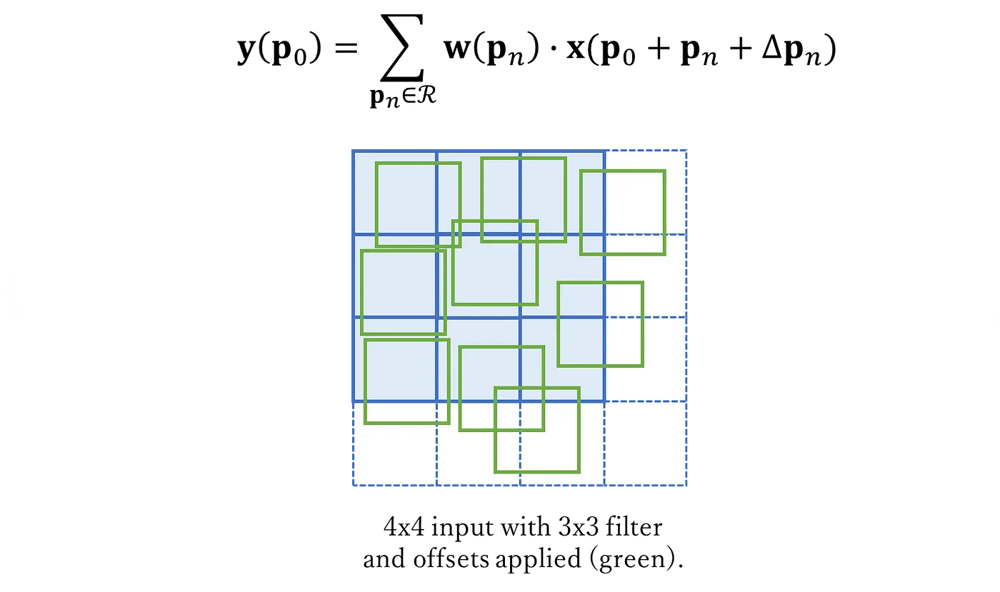

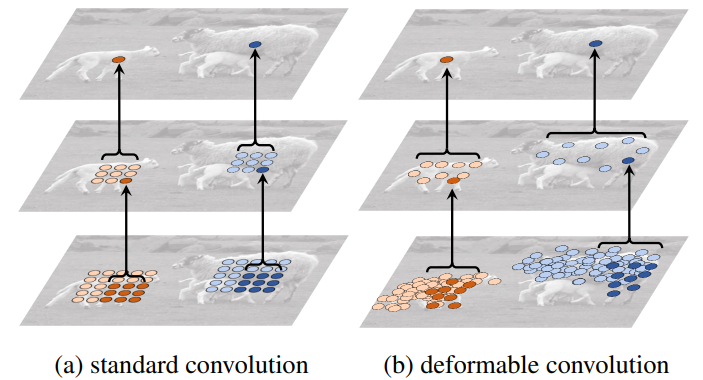

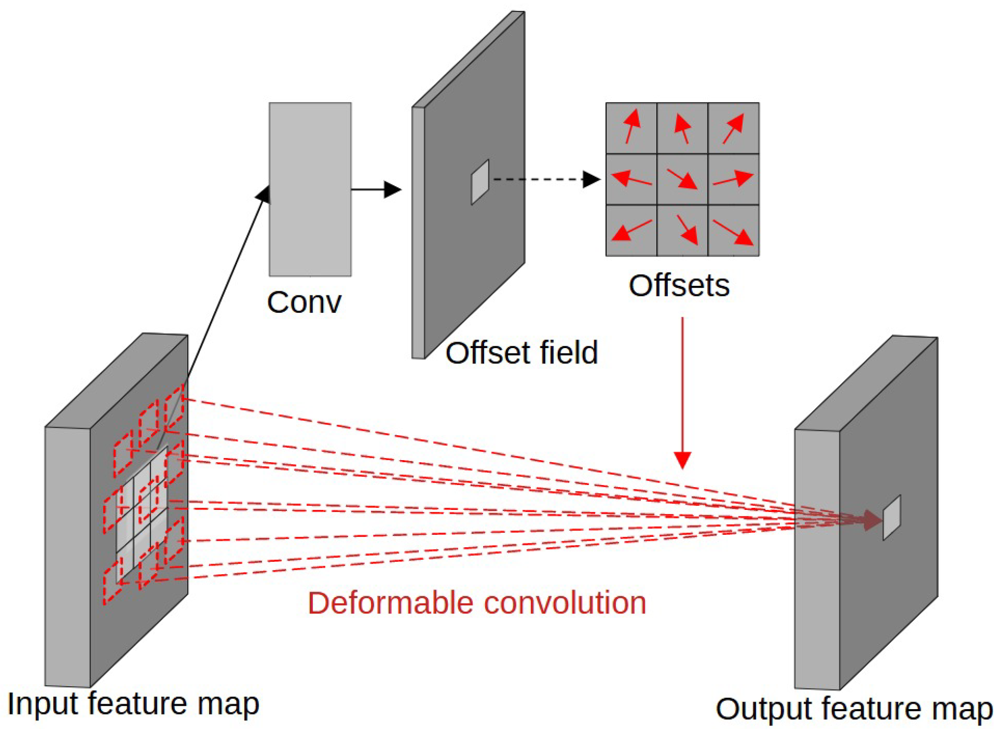

https://rammyram.medium.com/standard-convolution-to-deformable-convolution-part-1-1f11ac308dde

- Deformable Convolution - math example - chatgpt, grok.ai

In [ ]:
# PyTorch doesn’t have built-in deformable convolutions, but we can install torchvision.ops to implement it.

from torchvision.ops import DeformConv2d

class DeformableConv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3):
        super(DeformableConv, self).__init__()
        self.offsets = nn.Conv2d(in_channels, 2 * kernel_size * kernel_size, kernel_size=kernel_size, padding=1)
        self.conv = DeformConv2d(in_channels, out_channels, kernel_size=kernel_size, padding=1)

    def forward(self, x):
        offsets = self.offsets(x)
        return F.relu(self.conv(x, offsets))

# Test
model = DeformableConv(3, 16)
output = model(x)
print("Deformable Conv Output Shape:", output.shape)


#### Strided Convolution

* A convolution operation where the filter moves more than one pixel at a time (stride > 1).
* Typically used to reduce spatial dimensions (acts like pooling).


    Reduces spatial size → Fewer parameters, but May lose fine-grained details

In [ ]:
conv = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=2)

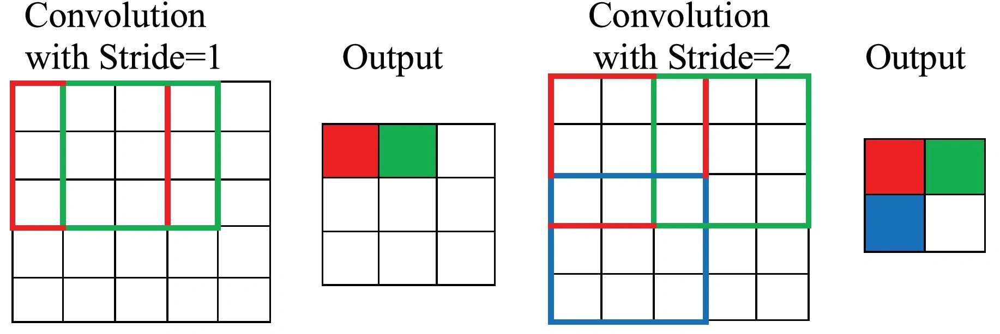

#### Asymmetric Convolution

* Instead of using square kernels (e.g., 3×3), we use rectangular ones (e.g., 1×3 + 3×1).
* Used in InceptionV3, Xception, and GoogleNet to reduce computation.


    More efficient than standard convolution, Helps in feature selection, but Requires fine-tuning

In [ ]:
conv1 = nn.Conv2d(64, 128, kernel_size=(1,3), padding=(0,1))
conv2 = nn.Conv2d(128, 128, kernel_size=(3,1), padding=(1,0))

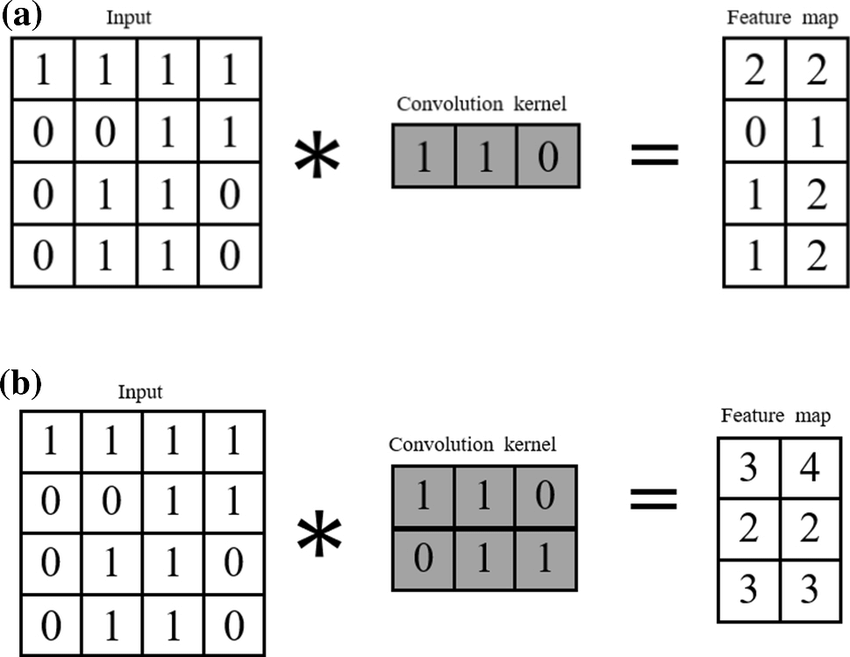

#### How to Choose the Right Convolution Type?

Choosing the right convolution type depends on factors like `task complexity`, `computational efficiency`, `accuracy`, and `dataset size`.

<table border="1">
    <tr>
        <th>Task</th>
        <th>Best Convolution Type</th>
        <th>Example Models</th>
    </tr>
    <tr>
        <td>General Image Classification</td>
        <td>Standard Convolution</td>
        <td>ResNet, VGG</td>
    </tr>
    <tr>
        <td>Mobile & Edge Devices</td>
        <td>Depthwise Separable</td>
        <td>MobileNet, EfficientNet</td>
    </tr>
    <tr>
        <td>Semantic Segmentation</td>
        <td>Dilated (Atrous)</td>
        <td>DeepLabV3+</td>
    </tr>
    <tr>
        <td>Image Super-Resolution</td>
        <td>Transposed Convolution</td>
        <td>SRGAN, UNet</td>
    </tr>
    <tr>
        <td>Dimensionality Reduction</td>
        <td>1×1 Convolution</td>
        <td>GoogleNet, SENet</td>
    </tr>
    <tr>
        <td>Efficient Large Networks</td>
        <td>Grouped Convolution</td>
        <td>ResNeXt, ShuffleNet</td>
    </tr>
    <tr>
        <td>Object Detection & Tracking</td>
        <td>Deformable Convolution</td>
        <td>Faster R-CNN, Mask R-CNN</td>
    </tr>
    <tr>
        <td>Time-Series / Cyclic Data</td>
        <td>Circular Convolution</td>
        <td>WaveNet, Weather Prediction</td>
    </tr>
</table>


### CNN Activation Functions

Activation functions play a crucial role in CNNs by `introducing non-linearity`, enabling the network to learn complex patterns.

#### Why is Non-Linearity Crucial?

Introducing non-linearity is essential in neural networks because `without non-linearity`, no matter how many layers you stack, `the network would only be able to represent linear functions`.

**Linear vs. Non-Linear Transformations**

**Linear relationships:**
* A linear layer computes a weighted sum of its inputs: `z = W⋅x+b`
* If you `stack multiple linear layers` without any non-linear functions in between, the entire network is equivalent to just a single linear transformation. This limits the network to `learning only linear relationships`.

**Non-Linear Transformation:**
* By applying a non-linear activation function f after each linear transformation: `a = f(z)`
* the network can capture and approximate complex, non-linear patterns in the data.


#### How Activation Functions Introduce Non-Linearity?

* Activation functions like ReLU, Sigmoid, Tanh, Swish transform the `linear input into a non-linear space`, enabling deep networks to learn complex patterns.
* After performing a linear transformation (like convolution or a fully connected layer), we apply an activation function. This ensures that the features extracted by the convolution (which are linear operations) are transformed non-linearly before being passed to the next layer.

Consider a single-layer CNN without an activation function:

    y = W∗x

This is just a linear filter (like edge detection).

But with ReLU:

    y = max(0,W∗x)

Now, the network selectively activates important features while suppressing others.

#### Activation Functions

| Type                     | Activation Function                 | Formula                                                                                     |
|--------------------------|-------------------------------------|---------------------------------------------------------------------------------------------|
| **Linear**                | Linear Activation                   | `f(x) = x`                                                                                 |
| **Sigmoid**               | Sigmoid                             | `f(x) = 1 / (1 + e^(-x))`                                                                   |
| **Tanh**                  | Hyperbolic Tangent (Tanh)           | `f(x) = (e^x - e^(-x)) / (e^x + e^(-x))`                                                     |
| **ReLU**                  | Rectified Linear Unit (ReLU)        | `f(x) = max(0, x)`                                                                          |
| **Leaky ReLU**            | Leaky ReLU                          | `f(x) = x if x > 0 else α * x`, where `α` is a small constant, e.g., 0.01                    |
| **ELU**                   | Exponential Linear Unit (ELU)       | `f(x) = x if x > 0 else α * (e^x - 1)`, where `α` is a positive constant                     |
| **SELU**                  | Scaled Exponential Linear Unit (SELU)| `f(x) = λ * (x if x > 0 else α * (e^x - 1))`, where `λ` and `α` are constants               |
| **Softmax**               | Softmax                             | `f(x_i) = e^(x_i) / Σ e^(x_j)` for each element `i` of the input vector, outputs a probability distribution |
| **Swish**                 | Swish                               | `f(x) = x / (1 + e^(-x))`                                                                   |
| **GELU**                  | Gaussian Error Linear Unit (GELU)   | `f(x) = 0.5 * x * (1 + tanh(sqrt(2/π) * (x + 0.044715 * x^3)))`                             |
| **Hard Sigmoid**          | Hard Sigmoid                        | `f(x) = max(0, min(1, 0.2 * x + 0.5))`                                                      |
| **Hard Swish**            | Hard Swish                          | `f(x) = x * ReLU6(x + 3) / 6` where `ReLU6(x) = min(max(0, x), 6)`                           |
| **Mish**                  | Mish                                | `f(x) = x * tanh(softplus(x))`, where `softplus(x) = log(1 + e^x)`                            |
| **Step Function** | Step Function (Heaviside)        | `f(x) = 1 if x >= 0 else 0`                                                                  |


#### Choosing the Right Activation Function

| Activation Function   | Range          | Use Case                                        | Default Choice for Layer         | Task                                  |
|-----------------------|----------------|-------------------------------------------------|----------------------------------|---------------------------------------|
| **Step**              | 0 to 1         | Perceptrons, simple tasks                      | Input/Output Layer               | Simple binary classification tasks   |
| **Sigmoid**           | 0 to 1         | Binary classification (output layer)            | Output Layer                     | Binary classification (logistic regression) |
| **Tanh**              | -1 to 1        | Hidden layers (better than sigmoid)             | Hidden Layers                    | Recurrent networks, simple neural networks |
| **ReLU**              | 0 to ∞         | Deep networks (hidden layers)                   | Hidden Layers                    | Deep learning networks, CNNs         |
| **Leaky ReLU**        | -∞ to ∞        | Improves ReLU for negative values               | Hidden Layers                    | Deep networks (to avoid dying ReLU)  |
| **Softmax**           | 0 to 1         | Multi-class classification (output layer)       | Output Layer                     | Multi-class classification (e.g., in CNNs) |
| **ELU**               | -∞ to ∞        | Deep networks, reduces bias shift               | Hidden Layers                    | Deep networks, faster convergence   |
| **SELU**              | -∞ to ∞        | Self-normalizing networks                       | Hidden Layers                    | Deep networks, self-normalizing models |
| **Swish**             | -∞ to ∞        | Networks with large gradients                    | Hidden Layers                    | Improving ReLU-like networks, deep models |
| **GELU**              | -∞ to ∞        | Gaussian error linear units                     | Hidden Layers                    | Transformers, complex deep learning models |
| **Hard Sigmoid**      | 0 to 1         | Efficient approximation of sigmoid               | Output Layer                     | Binary classification in resource-limited environments |
| **Hard Swish**        | 0 to 1         | Efficient ReLU-like activation                   | Hidden Layers                    | Efficient deep learning networks in mobile/edge devices |
| **Mish**              | -∞ to ∞        | Non-monotonic smooth activation function        | Hidden Layers                    | Complex deep learning models, improving ReLU |


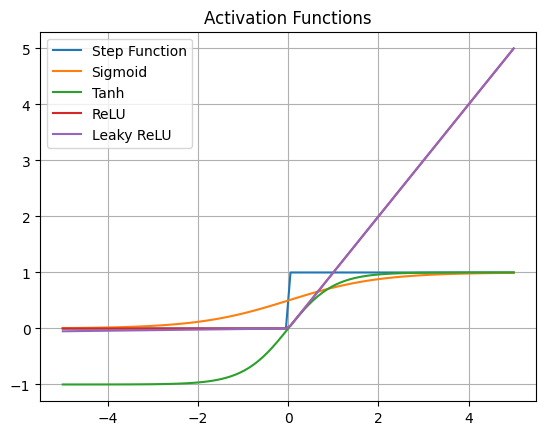

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def step_function(x):
    return np.where(x >= 0, 1, 0)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)

def relu(x):
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.01):
    return np.where(x > 0, x, alpha * x)

x = np.linspace(-5, 5, 100)

plt.plot(x, step_function(x), label="Step Function")
plt.plot(x, sigmoid(x), label="Sigmoid")
plt.plot(x, tanh(x), label="Tanh")
plt.plot(x, relu(x), label="ReLU")
plt.plot(x, leaky_relu(x), label="Leaky ReLU")
plt.legend()
plt.title("Activation Functions")
plt.grid()
plt.show()


### Modern CNN Optimizations

#### Normalization Techniques

Normalization is a critical `optimization strategy` to normalize activations in deep learning to stabilize training, accelerate convergence, and improve model performance.

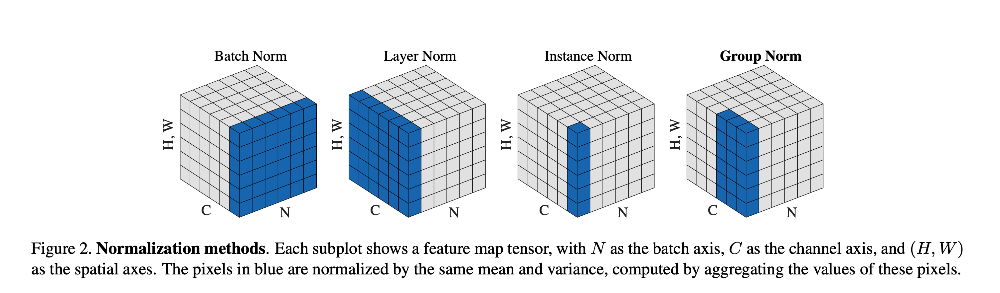

##### Batch Normalization (BatchNorm)

It was introduced in the paper `"Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift"` (Ioffe & Szegedy, 2015).

**How Does BatchNorm Work?**

Batch Normalization `normalizes` inputs across the `mini-batch` dimension.

The process involves:

1. Compute the mean μB and variance σB^2 for each feature across a mini-batch.


    μB = 1/m.∑xi
    σB^2 = 1/m.∑(xi-μB)^2

2. Normalize the input:


    x^i = (xi − μB) / (σB^2 +ϵ)

3. Scale and shift using learnable parameters γ (scale) and β (shift):

    
    yi = γ.x^i + β

This allows the network to "learn" whether normalization is beneficial.

PyTorch provides torch.nn.`BatchNorm1d`, `BatchNorm2d`, and `BatchNorm3d` for different types of inputs.

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)  # BatchNorm for Conv2D
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)  # Apply BatchNorm after Conv layer
        x = torch.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = torch.relu(x)
        return x

# Example Usage
cnn = CNN()
x = torch.randn(8, 3, 32, 32)  # 8 images, 3 channels (RGB), 32x32 resolution
output = cnn(x)
print(output.shape)

**BatchNorm Hyperparameters:**

    nn.BatchNorm2d(num_features, eps=1e-5, momentum=0.1, affine=True, track_running_stats=True)

* Set `num_features` equal to the number of channels in the layer before BatchNorm.
* ***`eps:`*** Small value to avoid division by zero.
* ***`momentum:`*** Factor for updating running statistics.
* ***`affine=True:`*** Enables learnable parameters γ (scale) and β (shift).
* ***`track_running_stats=True:`*** Maintains running mean/variance.

* During training, BatchNorm normalizes using the batch statistics (mini-batch mean & variance).

* During inference, it uses a moving average of mean and variance.

PyTorch handles this automatically, but you can manually switch:

In [ ]:
model.train()  # Uses batch statistics
model.eval()   # Uses running mean and variance

**When to Use BatchNorm?**

    ✔ Deep networks (ResNet, VGG, Transformer-based models)
    ✔ Faster convergence in training
    ✔ Reduces dependency on weight initialization
    ✔ Works well for both CNNs and MLPs

🚫 **Avoid BatchNorm if:**

    You're using small batch sizes (use LayerNorm or GroupNorm instead).
    You’re working with non-stationary data distributions.

---

##### Layer Normalization (LayerNorm)

Layer Normalization (LN) is a powerful technique for stabilizing neural network training, especially in scenarios where batch sizes are small or where sequential dependencies exist (e.g., RNNs, Transformers).

* Unlike Batch Normalization (BN), which normalizes across the batch dimension, Layer Normalization normalizes across the feature dimensions (i.e., across channels in CNNs or across neurons in fully connected layers) of each sample individually.

Originally designed for RNNs but has applications in CNNs, Transformers, and MLPs.

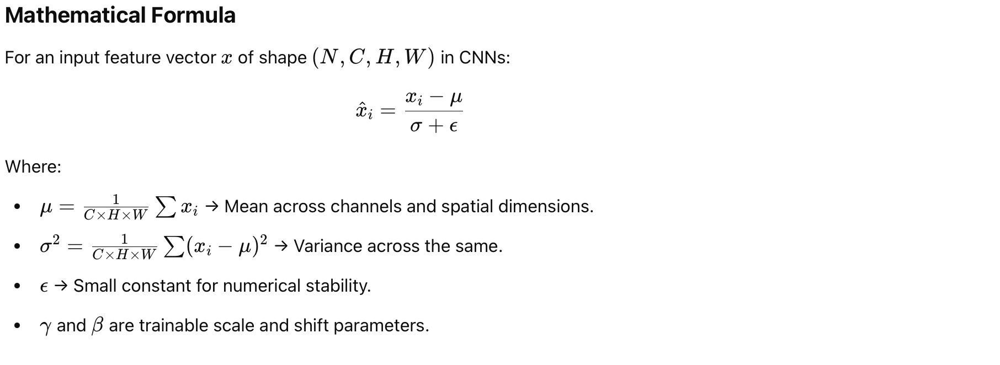

In [ ]:
import torch
import torch.nn as nn

# Define input tensor (batch_size=4, features=10)
x = torch.randn(4, 10)

# Layer Normalization applied over feature dimension
ln = nn.LayerNorm(normalized_shape=10)
output = ln(x)

print(output.shape)  # Output: torch.Size([4, 10])

**custom CNN-friendly LayerNorm:**


In [ ]:
    class LayerNormCNN(nn.Module):
        def __init__(self, num_channels, eps=1e-5):
            super(LayerNormCNN, self).__init__()
            self.gamma = nn.Parameter(torch.ones(1, num_channels, 1, 1))
            self.beta = nn.Parameter(torch.zeros(1, num_channels, 1, 1))
            self.eps = eps

        def forward(self, x):
            # Compute mean & variance across channels, height, and width (per sample)
            mean = x.mean(dim=(1, 2, 3), keepdim=True)
            std = x.std(dim=(1, 2, 3), keepdim=True)
            return self.gamma * (x - mean) / (std + self.eps) + self.beta

    # Example usage:
    layer_norm_cnn = LayerNormCNN(num_channels=16)
    output = layer_norm_cnn(x)
    print(output.shape)  # Output: torch.Size([4, 16, 32, 32])

**When to Use Layer Normalization?**

* NLP models & Transformers (where batch statistics vary a lot).
* Recurrent Neural Networks (RNNs, LSTMs, GRUs) (BN doesn’t work well here).
* Small batch CNNs (where BatchNorm is unstable).

❌ Avoid using if:

* You are training with large batch sizes → Use BatchNorm instead.
* Your model doesn’t require per-sample normalization → GroupNorm or InstanceNorm may work better.

Notes: Unlike batch norm, it does not depend on batch statistics.

---

**Layer Normalization in Transformers**

* LayerNorm plays a crucial role in Transformer architectures:
* Used before & after self-attention and feedforward layers.
Helps stabilize training in deep architectures.



In [ ]:
import torch
import torch.nn as nn

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, num_heads):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim, num_heads)
        self.ln1 = nn.LayerNorm(embed_dim)
        self.ln2 = nn.LayerNorm(embed_dim)
        self.ffn = nn.Sequential(
            nn.Linear(embed_dim, 4 * embed_dim),
            nn.ReLU(),
            nn.Linear(4 * embed_dim, embed_dim)
        )

    def forward(self, x):
        attn_out, _ = self.attn(x, x, x)
        x = self.ln1(x + attn_out)  # Apply LayerNorm after attention
        ffn_out = self.ffn(x)
        return self.ln2(x + ffn_out)  # Apply LayerNorm after feedforward

# Example usage:
x = torch.randn(10, 32, 512)  # (seq_len, batch_size, embed_dim)
transformer_block = TransformerBlock(embed_dim=512, num_heads=8)
output = transformer_block(x)
print(output.shape)  # Output: torch.Size([10, 32, 512])


##### Group Normalization (GroupNorm)

 Divide channels into groups and normalize each group separately.

**Batch Normalization Limitation:**

* BN computes statistics (mean & variance) across the entire mini-batch.
* This causes issues when batch sizes are small (e.g., medical imaging, object detection).
* It also introduces dependency across mini-batch samples, making it unsuitable for online learning.

**How GN Solves It:**

* GN normalizes across channels instead of batch samples.
* Unlike Layer Normalization (LN), it groups channels into small subsets, reducing computation overhead.
* `GN splits C into G groups` and normalizes each group independently
* Works well even with batch size = 1.

In [ ]:
import torch
import torch.nn as nn

# Define GroupNorm with 32 groups
group_norm = nn.GroupNorm(num_groups=32, num_channels=128)

# Input tensor: (batch_size=8, channels=128, height=32, width=32)
x = torch.randn(8, 128, 32, 32)

# Apply GroupNorm
output = group_norm(x)
print(output.shape)  # Should remain (8, 128, 32, 32)

Note:


    💡 num_groups=32 is a common setting (used in ResNet variants).
    💡 If num_groups=C, GN becomes Layer Normalization (LN).
    💡 If num_groups=1, GN behaves similarly to Instance Normalization (IN).

**When to Use Group Normalization?**

* When batch sizes are small (Medical Imaging, Object Detection, GANs).
* When training on multiple devices (distributed training).
* When batch normalization performs poorly due to mini-batch variance issues.
* When using very deep CNNs (e.g., ResNet, EfficientNet) where BN may fail.

##### Instance Normalization (InstanceNorm)

Instance Normalization normalizes the `feature maps per instance` (i.e., per image) rather than across the entire batch like Batch Normalization.

**Why Use Instance Normalization?**

* Better Style Consistency – Unlike BatchNorm, which normalizes across the batch, IN normalizes each sample independently, making it effective for style transfer & GANs.
* More Stable Training for Small Batches – Unlike BatchNorm, it does not depend on batch statistics, making it great for small-batch training & single-image inference.
* Reduces Batch Dependence – Helps in situations where batch size varies (e.g., real-time inference).
---

Instance Normalization is widely used in Neural Style Transfer, as introduced in the paper `"Instance Normalization: The Missing Ingredient for Fast Stylization"` (Ulyanov et al., 2016).

Effect on Style Transfer:
* Removes contrast variations within an image.
* Keeps the structure of content while applying new styles effectively.

In [ ]:
import torch
import torch.nn as nn

# Sample feature map (Batch Size=1, Channels=3, H=4, W=4)
x = torch.randn(1, 3, 4, 4)

# Apply Instance Normalization
in_layer = nn.InstanceNorm2d(3)
x_normalized = in_layer(x)

print(x_normalized.shape)  # Output: (1, 3, 4, 4)


**Instance Normalization in GANs**

Generative Adversarial Networks (GANs) often use Instance Normalization instead of BatchNorm.

* Used in architectures like CycleGAN and Pix2Pix.

In [ ]:
class GeneratorBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GeneratorBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.in_norm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.ReLU()

    def forward(self, x):
        return self.relu(self.in_norm(self.conv(x)))

##### Weight Normalization (utils.weight_norm)

Weight Normalization: `"A Simple Reparameterization to Accelerate Training of Deep Neural Networks, Weight Norm"`, by OpenAI, 2016 NIPS, Over 1400 Citations

---
Weight Normalization (WN) is an optimization technique that re-parameterizes the weights of a neural network layer to improve training stability and speed up convergence.

Weight Normalization `decouples` the `magnitude (norm)` and `direction (unit vector)` of the weight matrix:

    w = (g / ∥v∥). v

Instead of directly optimizing weights w, we optimize g and v separately.

where:

    g is a learnable scalar parameter (scale).
    v is a learnable direction vector.
    ∥v∥ is the Euclidean norm (L2 norm) of v.


---
**Reparameterization:**

* For a layer’s weight matrix or vector (e.g., in a convolution or fully connected layer), replacew with the expression w = (g / ∥v∥). v


* v and g are initialized and updated via gradient descent.
---

PyTorch provides built-in support for weight normalization using `torch.nn.utils.weight_norm`.

**Behind the scenes**, PyTorch reparameterizes `conv.weight` into `conv.weight_v` (direction) and `conv.weight_g` (magnitude), computing the normalized weight during the forward pass.

In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils import weight_norm

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = weight_norm(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1), name='weight')
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.conv(x)
        return self.relu(x)

# Example usage
model = ConvBlock(3, 64)  # 3 input channels (RGB), 64 output channels
input = torch.randn(16, 3, 32, 32)  # Batch of 16, 3 channels, 32x32 images
output = model(input)

Note:

BatchNorm tends to outperform WeightNorm in CNNs because it directly stabilizes the distribution of activations, which is critical for deep networks. WeightNorm shines in scenarios where batch statistics are unreliable (e.g., small batches) or in non-convolutional settings like RNNs.

---
**Weight Normalization vs	Batch Normalization**

<table border="1">
    <tr>
        <th>Feature</th>
        <th>Weight Normalization</th>
        <th>Batch Normalization</th>
    </tr>
    <tr>
        <td>Uses batch statistics?</td>
        <td>❌ No</td>
        <td>✅ Yes</td>
    </tr>
    <tr>
        <td>Suitable for small batch sizes?</td>
        <td>✅ Yes</td>
        <td>❌ No</td>
    </tr>
    <tr>
        <td>Computational overhead</td>
        <td>🚀 Low</td>
        <td>🔥 High</td>
    </tr>
    <tr>
        <td>Improves gradient flow?</td>
        <td>✅ Yes</td>
        <td>✅ Yes</td>
    </tr>
    <tr>
        <td>Works well with RNNs?</td>
        <td>✅ Yes</td>
        <td>❌ No</td>
    </tr>
</table>

---


Summary

    ✔ Weight Normalization separates weight magnitude and direction for better training stability.
    ✔ It is independent of batch statistics, making it useful for small-batch training and RNNs.
    ✔ PyTorch supports it natively via torch.nn.utils.weight_norm().
    ✔ It can be applied to fully connected, CNN, and RNN layers for improved convergence.
    ✔ It is an alternative to BatchNorm but works differently and is more suitable for specific scenarios.

##### Choosing the Right Normalization Technique

<table border="1">
    <tr>
        <th>Scenario</th>
        <th>Recommended Normalization</th>
    </tr>
    <tr>
        <td>CNNs (Image Classification, Large Batch Size)</td>
        <td>Batch Normalization (BN)</td>
    </tr>
    <tr>
        <td>Transformers, NLP, BERT, GPT, RNNs</td>
        <td>Layer Normalization (LN)</td>
    </tr>
    <tr>
        <td>Small Batch CNNs (Medical Imaging, Object Detection)</td>
        <td>Group Normalization (GN)</td>
    </tr>
    <tr>
        <td>Style Transfer, GANs, Artistic Filters</td>
        <td>Instance Normalization (IN)</td>
    </tr>
    <tr>
        <td>Very Small Models (Few Parameters)</td>
        <td>Weight Normalization (WN)</td>
    </tr>
</table>


#### Regularization Techniques

Regularization is a set of methods used to `prevent overfitting`, ensuring that models `generalize well` to unseen data rather than memorizing the training set.

##### Weight Regularization (L1 & L2)


✔ Penalizes large weight values to prevent overfitting.

✔ Best for: Controlling model complexity.

    Loss total = Loss data + λ⋅R(w)

R(w): The regularization term (L1 or L2).

λ: A hyperparameter controlling the strength of the penalty.

---

**L2 Regularization (Weight Decay):**

* `Adds a penalty to the loss function` on large weights by minimizing the `squared values` of weights.

    
        Loss = Original Loss + λ. 1/2∑wi^2
* Commonly used in optimizers like Adam and SGD.
* Drawbacks: May underfit if λ is too large; doesn’t address feature redundancy directly.
* Practical Tip: Common λ values range from 10^−4 to 10^−2.

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)  # L2 Regularization

---

**L1 Regularization**

* Penalty: Adds the sum of absolute weights to the loss.


    Loss total = Loss data + λ⋅∑|wi|
* Encourages sparsity in weights (some weights become exactly zero).

In [ ]:
# Can be implemented manually:

l1_lambda = 0.0001
l1_penalty = sum(torch.norm(param, 1) for param in model.parameters())
loss = loss_function(preds, labels) + l1_lambda * l1_penalty

---

In PyTorch, L2 is built into optimizers via weight_decay, while L1 requires a custom loss term.

In [ ]:
import torch
import torch.nn as nn

class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(64 * 32 * 32, 10)  # Assuming 32x32 input

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = x.view(x.size(0), -1)
        return self.fc(x)

# L2 Regularization (Weight Decay)
model = CNN()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, weight_decay=1e-4)  # L2

# L1 Regularization (Manual)
criterion = nn.CrossEntropyLoss()
lambda_l1 = 1e-4
for epoch in range(epochs):
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = criterion(outputs, targets)
    l1_reg = lambda_l1 * sum(torch.abs(p).sum() for p in model.parameters())  # L1 penalty
    total_loss = loss + l1_reg
    total_loss.backward()
    optimizer.step()

##### Dropout

* Randomly drops neurons during training to prevent reliance on specific features.
* Best for: Fully Connected Layers, but can also be used in CNNs (SpatialDropout).

In [ ]:
class CNNWithDropout(nn.Module):
    def __init__(self):
        super(CNNWithDropout, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.5)   # 50% probability of dropping neurons
        self.fc1 = nn.Linear(64 * 32 * 32, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x = x.view(x.size(0), -1)
        x = self.dropout(x)  # Dropout applied before fully connected layer
        x = self.fc1(x)
        return x

##### Spatial Dropout (Dropout2D)

* Instead of dropping individual neurons, it drops entire feature maps, making CNNs more robust.

* Best for: Feature maps in convolutional layers.

In [ ]:
spatial_dropout = nn.Dropout2d(p=0.3)  # Drops whole feature maps with 30% probability

In [ ]:
class CNNWithSpatialDropout(nn.Module):
    def __init__(self):
        super(CNNWithSpatialDropout, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.spatial_dropout = nn.Dropout2d(p=0.3)  # Applied after conv layer
        self.fc1 = nn.Linear(64 * 32 * 32, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.spatial_dropout(x)  # Drop feature maps randomly
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

##### DropBlock (Structured Dropout)

* Instead of dropping random neurons, DropBlock drops contiguous regions (blocks) in feature maps.
* Best for: CNNs where features are spatially correlated (e.g., object detection, medical imaging).
* Why? Helps avoid overfitting by forcing the model to learn global context instead of just local features.

PyTorch does not include DropBlock by default, so we implement it manually:

In [ ]:
import torch
import torch.nn.functional as F
import torch.nn as nn

class DropBlock2D(nn.Module):
    def __init__(self, block_size=3, p=0.1):
        super(DropBlock2D, self).__init__()
        self.block_size = block_size
        self.p = p

    def forward(self, x):
        if not self.training or self.p == 0:
            return x
        gamma = self.p / (self.block_size ** 2)
        mask = (torch.rand_like(x) < gamma).float()
        mask = F.max_pool2d(mask, kernel_size=self.block_size, stride=1, padding=self.block_size // 2)
        return x * (1 - mask)

# Usage in a CNN
class CNNWithDropBlock(nn.Module):
    def __init__(self):
        super(CNNWithDropBlock, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.dropblock = DropBlock2D(block_size=3, p=0.1)  # DropBlock applied here
        self.fc1 = nn.Linear(64 * 32 * 32, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.dropblock(x)  # Apply DropBlock
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

##### Stochastic Depth

* Randomly drops entire layers (or residual branches) during training.
* Improves training of very deep networks (ResNets, DenseNets).

PyTorch does not have built-in Stochastic Depth, but we can implement it easily.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class StochasticDepth(nn.Module):
    def __init__(self, survival_prob=0.8):
        """
        survival_prob: Probability of keeping the residual branch active.
        """
        super(StochasticDepth, self).__init__()
        self.survival_prob = survival_prob

    def forward(self, x, residual):
        if not self.training:  # Always keep residual at test time
            return x + residual

        # Apply Stochastic Depth (randomly drop layers)
        if torch.rand(1).item() < self.survival_prob:
            return x + residual
        else:
            return x  # Skip the residual connection

# Integrating Stochastic Depth in a ResNet Block
class ResNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, survival_prob=0.8):
        super(ResNetBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.stochastic_depth = StochasticDepth(survival_prob=survival_prob)

    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.stochastic_depth(identity, out)  # Apply Stochastic Depth
        out = self.relu(out)
        return out

# Using Stochastic Depth in a ResNet Model
class ResNetWithStochasticDepth(nn.Module):
    def __init__(self, num_blocks=3, survival_prob=0.8):
        super(ResNetWithStochasticDepth, self).__init__()
        self.stem = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.blocks = nn.Sequential(*[
            ResNetBlock(64, 64, survival_prob=survival_prob - (i * 0.1))  # Gradually reduce survival probability
            for i in range(num_blocks)
        ])
        self.fc = nn.Linear(64, 10)

    def forward(self, x):
        x = self.stem(x)
        x = self.blocks(x)
        x = F.adaptive_avg_pool2d(x, 1)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

# Instantiate model
model = ResNetWithStochasticDepth(num_blocks=5, survival_prob=0.9)


##### Data Augmentation (Implicit Regularization)

* Artificially expands the training set by applying transformations to inputs (e.g., flips, rotations, crops, color jitter).
* In CNNs: Widely used for image data—e.g., random horizontal flips, rotations (±10°), or brightness shifts.
* Using `torchvision.transforms`

In [ ]:
from torchvision import transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import DataLoader

train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor()
])

train_dataset = CIFAR10(root="./data", train=True, transform=train_transforms, download=True)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

##### Early Stopping

* Stop training when the validation loss stops improving to avoid overfitting.
* Best for: Training deep CNNs when there's a risk of overfitting.

In [ ]:
class EarlyStopping:
    def __init__(self, patience=5):
        self.patience = patience
        self.counter = 0
        self.best_loss = float('inf')

    def check(self, val_loss):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.counter = 0  # Reset counter
        else:
            self.counter += 1
        return self.counter >= self.patience

# Usage in Training Loop:
early_stopper = EarlyStopping(patience=5)

for epoch in range(100):
    # Train and evaluate...
    if early_stopper.check(val_loss):
        print("Early stopping triggered!")
        break

### Popular CNN Architectures

#### LeNet-5 (1998) 🏆

    Yann LeCun, Léon Bottou, Yoshua Bengio, and Patrick Haffner.
    "Gradient-Based Learning Applied to Document Recognition."
    Proceedings of the IEEE, 1998.

https://ieeexplore.ieee.org/document/726791

- First CNN architecture, used for handwritten digit recognition (MNIST).
- Limitations: Cannot handle complex images.

**Architecture Overview:**

LeNet-5 consists of seven layers:

<table border="1">
    <tr>
        <th>Layer</th>
        <th>Type</th>
        <th>Filters / Neurons</th>
        <th>Kernel Size</th>
        <th>Stride</th>
        <th>Output Size</th>
        <th>Activation</th>
    </tr>
    <tr>
        <td>Input</td>
        <td>Input Layer</td>
        <td>-</td>
        <td>-</td>
        <th>-</th>
        <td>32 × 32 × 1</td>
        <td>-</td>
    </tr>
    <tr>
        <td>C1</td>
        <td>Convolutional Layer</td>
        <td>6 filters</td>
        <td>5 × 5</td>
        <th>1</th>
        <td>28 × 28 × 6</td>
        <td>Tanh/ReLu</td>
    </tr>
    <tr>
        <td>S2</td>
        <td>Average Pooling</td>
        <td>-</td>
        <td>2 × 2</td>
        <th>2</th>
        <td>14 × 14 × 6</td>
        <td>Tanh/ReLu</td>
    </tr>
    <tr>
        <td>C3</td>
        <td>Convolutional Layer</td>
        <td>16 filters</td>
        <td>5 × 5</td>
        <th>1</th>
        <td>10 × 10 × 16</td>
        <td>Tanh/ReLu</td>
    </tr>
    <tr>
        <td>S4</td>
        <td>Average Pooling</td>
        <td>-</td>
        <td>2 × 2</td>
        <th>2</th>
        <td>5 × 5 × 16</td>
        <td>Tanh/ReLu</td>
    </tr>
    <tr>
        <td>C5</td>
        <td>Fully Connected Conv</td>
        <td>120 neurons</td>
        <td>5 × 5</td>
        <th>1</th>
        <td>1 × 1 × 120</td>
        <td>Tanh/ReLu</td>
    </tr>
    <tr>
        <td>F6</td>
        <td>Fully Connected</td>
        <td>84 neurons</td>
        <td>-</td>
        <th>-</th>
        <td>1 × 1 × 84</td>
        <td>Tanh/ReLu</td>
    </tr>
    <tr>
        <td>Output</td>
        <td>Fully Connected</td>
        <td>10 neurons</td>
        <td>-</td>
        <th>-</th>
        <td>1 × 1 × 10</td>
        <td>Softmax / RBF</td>
    </tr>
</table>


    Input (32x32x1) → C1 (28x28x6) → S2 (14x14x6) → C3 (10x10x16) → S4 (5x5x16) → C5 (1x1x120) → F6 (84) → Output (10).

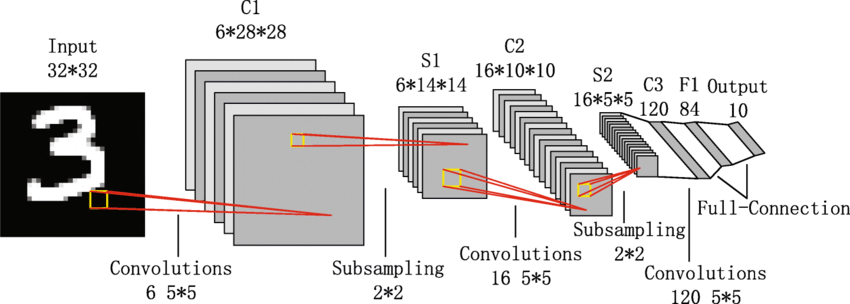

**LeNet-5 in PyTorch**

* Loads MNIST (28x28 grayscale images) with normalization.
* Uses Adam optimizer and CrossEntropyLoss, training for 5 epochs.
* Computes loss and accuracy on the test set.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchsummary import summary  # Optional: pip install torchsummary

# Define LeNet-5 Model
class LeNet5(nn.Module):
    def __init__(self):
        super(LeNet5, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, kernel_size=5, stride=1, padding=2)  # C1: 1x28x28 -> 6x28x28
        self.pool1 = nn.AvgPool2d(kernel_size=2, stride=2)               # S2: 6x28x28 -> 6x14x14
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5, stride=1)           # C3: 6x14x14 -> 16x10x10
        self.pool2 = nn.AvgPool2d(kernel_size=2, stride=2)               # S4: 16x10x10 -> 16x5x5
        self.conv3 = nn.Conv2d(16, 120, kernel_size=5, stride=1)         # C5: 16x5x5 -> 120x1x1
        self.fc1 = nn.Linear(120, 84)                                    # F6: 120 -> 84
        self.fc2 = nn.Linear(84, 10)                                     # Output: 84 -> 10

    def forward(self, x):
        x = F.relu(self.conv1(x))  # 6x28x28
        x = self.pool1(x)          # 6x14x14
        x = F.relu(self.conv2(x))  # 16x10x10
        x = self.pool2(x)          # 16x5x5
        x = F.relu(self.conv3(x))  # 120x1x1
        x = x.view(x.size(0), -1)  # Flatten to (batch_size, 120)
        x = F.relu(self.fc1(x))    # 84
        x = self.fc2(x)            # 10 (logits)
        return x

# Training Function
def train(model, device, train_loader, optimizer, criterion, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print(f'Epoch {epoch} [{batch_idx}/{len(train_loader)}] - Loss: {loss.item():.4f}')

# Testing Function
def test(model, device, test_loader, criterion):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += criterion(output, target).item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
    test_loss /= len(test_loader.dataset)
    accuracy = 100. * correct / len(test_loader.dataset)
    print(f'Test Set: Avg Loss: {test_loss:.4f}, Accuracy: {correct}/{len(test_loader.dataset)} ({accuracy:.2f}%)')

# Main Execution
def main():
    # Device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Data Loading
    transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
    train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
    test_dataset = datasets.MNIST(root='./data', train=False, transform=transform, download=True)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=1000, shuffle=False)

    # Model Setup
    model = LeNet5().to(device)
    summary(model, (1, 28, 28))  # Optional: Print model summary
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()

    # Training Loop
    for epoch in range(1, 6):
        train(model, device, train_loader, optimizer, criterion, epoch)
        test(model, device, test_loader, criterion)

if __name__ == "__main__":
    main()

In [ ]:
print(model)

In [ ]:
from torchsummary import summary

model = AlexNet(num_classes=10).to(device)
summary(model, input_size=(3, 224, 224))

In [ ]:
def count_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params

model = AlexNet(num_classes=10)
total, trainable = count_parameters(model)
print(f"Total parameters: {total}")
print(f"Trainable parameters: {trainable}")

---
---

#### AlexNet (2012) 🏆

    Krizhevsky, A., Sutskever, I., & Hinton, G. E. (2012).
    ImageNet Classification with Deep Convolutional Neural Networks. Advances in Neural Information Processing Systems (NeurIPS), 25.
    DOI: 10.1145/3065386
    Paper Link: https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf

- Won the ImageNet Challenge with deep CNNs.
- Introduced `ReLU activation`, `Dropout`, and `multiple GPUs`.
- Limitations: Computationally expensive.

**Key Innovations of AlexNet**

* ***Deep Architecture →*** Unlike earlier CNNs (e.g., LeNet-5), AlexNet had 8 layers, making it deeper and more powerful.
* ***ReLU Activation →*** Used Rectified Linear Units (ReLU) instead of sigmoid/tanh, solving the vanishing gradient problem and speeding up training.
* ***GPU Training →*** First major CNN trained using GPUs (NVIDIA GTX 580), making large-scale deep learning feasible.
* ***Dropout Regularization →*** Prevented overfitting by randomly dropping neurons during training.
* ***Overlapping Max Pooling →*** Unlike traditional non-overlapping pooling, this helped in reducing computational cost while preserving more information.
* ***Data Augmentation →*** Applied image translations, horizontal flipping, and RGB intensity variations to artificially increase the dataset size and reduce overfitting.

AlexNet Architecture Overview

AlexNet consists of 5 convolutional layers followed by 3 fully connected layers:

<table border="1">
    <tr>
        <th>Layer</th>
        <th>Type</th>
        <th>Number of Filters</th>
        <th>Filter Size</th>
        <th>Stride</th>
        <th>Activation</th>
        <th>Output Size</th>
    </tr>
    <tr>
        <td>1</td>
        <td>Conv</td>
        <td>96</td>
        <td>11×11</td>
        <td>4</td>
        <td>ReLU</td>
        <td>55 × 55 × 96</td>
    </tr>
    <tr>
        <td>2</td>
        <td>Conv</td>
        <td>256</td>
        <td>5×5</td>
        <td>1</td>
        <td>ReLU</td>
        <td>27 × 27 × 256</td>
    </tr>
    <tr>
        <td>3</td>
        <td>Conv</td>
        <td>384</td>
        <td>3×3</td>
        <td>1</td>
        <td>ReLU</td>
        <td>13 × 13 × 384</td>
    </tr>
    <tr>
        <td>4</td>
        <td>Conv</td>
        <td>384</td>
        <td>3×3</td>
        <td>1</td>
        <td>ReLU</td>
        <td>13 × 13 × 384</td>
    </tr>
    <tr>
        <td>5</td>
        <td>Conv</td>
        <td>256</td>
        <td>3×3</td>
        <td>1</td>
        <td>ReLU</td>
        <td>13 × 13 × 256</td>
    </tr>
    <tr>
        <td>6</td>
        <td>FC</td>
        <td>4096</td>
        <td>-</td>
        <td>-</td>
        <td>ReLU + Dropout</td>
        <td>1 × 1 × 4096</td>
    </tr>
    <tr>
        <td>7</td>
        <td>FC</td>
        <td>4096</td>
        <td>-</td>
        <td>-</td>
        <td>ReLU + Dropout</td>
        <td>1 × 1 × 4096</td>
    </tr>
    <tr>
        <td>8</td>
        <td>FC</td>
        <td>1000</td>
        <td>-</td>
        <td>-</td>
        <td>Softmax</td>
        <td>1 × 1 × 1000</td>
    </tr>
</table>


**AlexNet on CIFAR-10 using PyTorch**

10 classes instead of ImageNet’s 1000

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import time
from tqdm import tqdm

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Data Preparation
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.491, 0.482, 0.447), (0.247, 0.243, 0.261))
])
transform_test = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize((0.491, 0.482, 0.447), (0.247, 0.243, 0.261))
])

batch_size = 128
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# AlexNet Model
class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 96, kernel_size=11, stride=4, padding=2),  # Input: Bx3x224x224 -> Output: Bx96x55x55
            nn.ReLU(inplace=True),                                  # Output: Bx96x55x55
            nn.MaxPool2d(kernel_size=3, stride=2),                  # Output: Bx96x27x27
            nn.Conv2d(96, 256, kernel_size=5, padding=2),           # Output: Bx256x27x27
            nn.ReLU(inplace=True),                                  # Output: Bx256x27x27
            nn.MaxPool2d(kernel_size=3, stride=2),                  # Output: Bx256x13x13
            nn.Conv2d(256, 384, kernel_size=3, padding=1),          # Output: Bx384x13x13
            nn.ReLU(inplace=True),                                  # Output: Bx384x13x13
            nn.Conv2d(384, 384, kernel_size=3, padding=1),          # Output: Bx384x13x13
            nn.ReLU(inplace=True),                                  # Output: Bx384x13x13
            nn.Conv2d(384, 256, kernel_size=3, padding=1),          # Output: Bx256x13x13
            nn.ReLU(inplace=True),                                  # Output: Bx256x13x13
            nn.MaxPool2d(kernel_size=3, stride=2),                  # Output: Bx256x6x6
        )
        self.classifier = nn.Sequential(
            nn.Dropout(p=0.5),                                      # Output: Bx256x6x6 (before flattening)
            nn.Linear(256 * 6 * 6, 4096),                          # Flatten: Bx9216 -> Output: Bx4096
            nn.ReLU(inplace=True),                                  # Output: Bx4096
            nn.Dropout(p=0.5),                                      # Output: Bx4096
            nn.Linear(4096, 4096),                                 # Output: Bx4096
            nn.ReLU(inplace=True),                                  # Output: Bx4096
            nn.Linear(4096, num_classes),                          # Output: Bx10
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)  # Flattens Bx256x6x6 -> Bx9216
        x = self.classifier(x)
        return x

# Model, Loss, Optimizer
model = AlexNet(num_classes=10).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=5e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# Training Loop
num_epochs = 10
print("\n🚀 Training Started...\n")
for epoch in range(num_epochs):
    model.train()
    start_time = time.time()
    running_loss = 0.0
    correct = 0
    total = 0
    with tqdm(trainloader, desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (inputs, labels) in enumerate(pbar):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            pbar.set_postfix(loss=loss.item())

    scheduler.step()
    epoch_loss = running_loss / len(trainloader)
    epoch_acc = 100 * correct / total
    print(f"✅ Epoch {epoch+1} | Loss: {epoch_loss:.4f} | Accuracy: {epoch_acc:.2f}% | Time: {time.time() - start_time:.2f}s")

print("\n🎉 Training Completed!\n")

# Save Model
torch.save(model.state_dict(), "alexnet_cifar10.pth")
print("✅ Model saved as alexnet_cifar10.pth")

# Evaluation
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in testloader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f"\n🔥 AlexNet Test Accuracy on CIFAR-10: {accuracy:.2f}%")

#### VGG-16/VGG-19 (2014) 🏆

    Simonyan, K., & Zisserman, A. (2014).
    Very deep convolutional networks for large-scale image recognition.

    📄 Paper Link: arXiv:1409.1556

- VGG stands for Visual Geometry Group.
- VGG-16 has 16 convolutional layers, while VGG-19 has 19.
- Limitations: Slow & memory-heavy.

**How does VGGNet work?**
- VGGNet uses tiny 3 x 3 filters.
- VGGNet uses pooling layers and a fully linked layer.

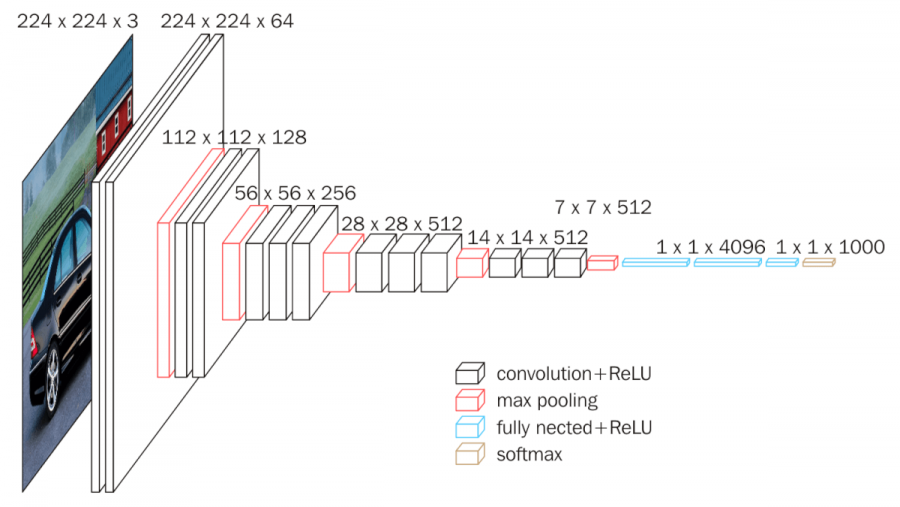

**VGG-16 Architecture Overview**

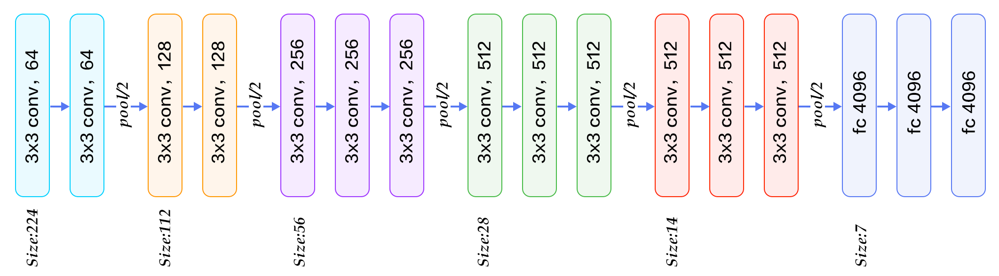

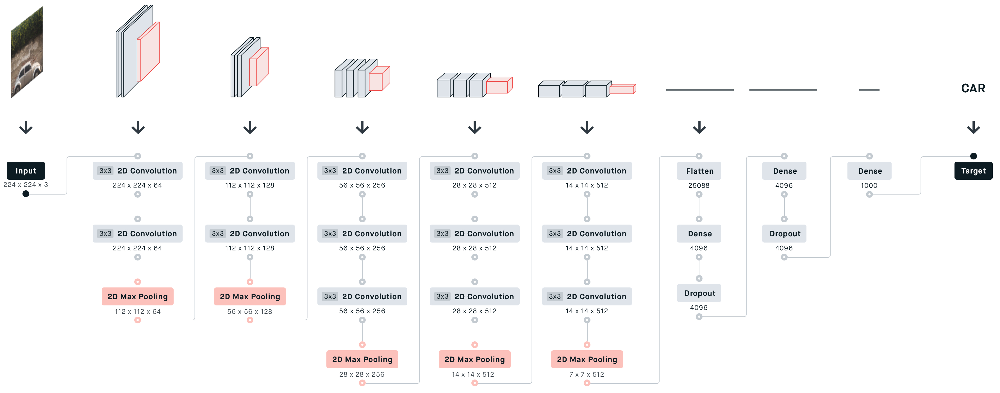

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# VGG-16 Model
class VGG16(nn.Module):
    def __init__(self, num_classes=10):
        super(VGG16, self).__init__()
        self.features = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 64, kernel_size=3, padding=1),    # Bx3x224x224 -> Bx64x224x224
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),   # Bx64x224x224 -> Bx64x224x224
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),         # Bx64x224x224 -> Bx64x112x112

            # Block 2
            nn.Conv2d(64, 128, kernel_size=3, padding=1),  # Bx64x112x112 -> Bx128x112x112
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1), # Bx128x112x112 -> Bx128x112x112
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),         # Bx128x112x112 -> Bx128x56x56

            # Block 3
            nn.Conv2d(128, 256, kernel_size=3, padding=1), # Bx128x56x56 -> Bx256x56x56
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1), # Bx256x56x56 -> Bx256x56x56
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1), # Bx256x56x56 -> Bx256x56x56
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),         # Bx256x56x56 -> Bx256x28x28

            # Block 4
            nn.Conv2d(256, 512, kernel_size=3, padding=1), # Bx256x28x28 -> Bx512x28x28
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), # Bx512x28x28 -> Bx512x28x28
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), # Bx512x28x28 -> Bx512x28x28
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),         # Bx512x28x28 -> Bx512x14x14

            # Block 5
            nn.Conv2d(512, 512, kernel_size=3, padding=1), # Bx512x14x14 -> Bx512x14x14
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), # Bx512x14x14 -> Bx512x14x14
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), # Bx512x14x14 -> Bx512x14x14
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),         # Bx512x14x14 -> Bx512x7x7
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),                                   # Bx512x7x7 -> Bx25088 (512*7*7)
            nn.Linear(512 * 7 * 7, 4096),                  # Bx25088 -> Bx4096
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, 4096),                         # Bx4096 -> Bx4096
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, num_classes),                  # Bx4096 -> Bx10
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Model Setup
model = VGG16(num_classes=10).to(device)

# Inspect Architecture
print("Model Architecture:")
print(model)

# Count Parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"\nTotal number of parameters: {total_params}")

# Optional: Use torchsummary for detailed summary
try:
    from torchsummary import summary
    summary(model, input_size=(3, 224, 224))
except ImportError:
    print("Install torchsummary for a detailed summary: pip install torchsummary")

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# VGG Block Function
def make_vgg_block(in_channels, out_channels, num_convs):
    layers = []
    for _ in range(num_convs):
        layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1))
        layers.append(nn.ReLU(inplace=True))
        in_channels = out_channels
    layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
    return nn.Sequential(*layers)

# VGG-16 Model using Blocks
class VGG16(nn.Module):
    def __init__(self, num_classes=10):
        super(VGG16, self).__init__()
        self.features = nn.Sequential(
            # Block 1: 2 conv layers, 64 filters
            make_vgg_block(3, 64, 2),      # Bx3x224x224 -> Bx64x112x112
            # Block 2: 2 conv layers, 128 filters
            make_vgg_block(64, 128, 2),    # Bx64x112x112 -> Bx128x56x56
            # Block 3: 3 conv layers, 256 filters
            make_vgg_block(128, 256, 3),   # Bx128x56x56 -> Bx256x28x28
            # Block 4: 3 conv layers, 512 filters
            make_vgg_block(256, 512, 3),   # Bx256x28x28 -> Bx512x14x14
            # Block 5: 3 conv layers, 512 filters
            make_vgg_block(512, 512, 3),   # Bx512x14x14 -> Bx512x7x7
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),                   # Bx512x7x7 -> Bx25088 (512*7*7)
            nn.Linear(512 * 7 * 7, 4096),  # Bx25088 -> Bx4096
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, 4096),         # Bx4096 -> Bx4096
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, num_classes),  # Bx4096 -> Bx10
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


# Model Setup
model = VGG16(num_classes=10).to(device)

# Inspect Architecture
print("Model Architecture:")
print(model)

# Count Parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"\nTotal number of parameters: {total_params}")

# Optional: Detailed Summary
try:
    from torchsummary import summary
    summary(model, input_size=(3, 224, 224))
except ImportError:
    print("Install torchsummary for a detailed summary: pip install torchsummary")


Here are the configurations for the common VGG variants:

    VGG-11: [1, 1, 2, 2, 2] (11 layers: 8 conv + 3 FC)
    VGG-13: [2, 2, 2, 2, 2] (13 layers: 10 conv + 3 FC)
    VGG-16: [2, 2, 3, 3, 3] (16 layers: 13 conv + 3 FC)
    VGG-19: [2, 2, 4, 4, 4] (19 layers: 16 conv + 3 FC)

filter_sizes = [64, 128, 256, 512, 512]  # Fixed filter progression - features

In [ ]:
# Configurable VGG Model
class VGG(nn.Module):
    def __init__(self, block_config, num_classes=10):
        """
        Args:
            block_config (list): Number of conv layers in each block [b1, b2, b3, b4, b5].
            num_classes (int): Number of output classes.
        """
        super(VGG, self).__init__()
        self.block_config = block_config
        filter_sizes = [64, 128, 256, 512, 512]  # Fixed filter progression

        # Build feature extractor
        layers = []
        in_channels = 3
        for num_convs, out_channels in zip(block_config, filter_sizes):
            layers.append(make_vgg_block(in_channels, out_channels, num_convs))
            in_channels = out_channels

        self.features = nn.Sequential(*layers)  # Bx3x224x224 -> Bx512x7x7

        # Classifier
        self.classifier = nn.Sequential(
            nn.Flatten(),                   # Bx512x7x7 -> Bx25088 (512*7*7)
            nn.Linear(512 * 7 * 7, 4096),  # Bx25088 -> Bx4096
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, 4096),         # Bx4096 -> Bx4096
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, num_classes),  # Bx4096 -> Bx10
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# VGG Configurations
vgg_configs = {
    'VGG11': [1, 1, 2, 2, 2],
    'VGG13': [2, 2, 2, 2, 2],
    'VGG16': [2, 2, 3, 3, 3],
    'VGG19': [2, 2, 4, 4, 4]
}

# Function to create and inspect a VGG variant
def setup_vgg(variant_name):
    config = vgg_configs[variant_name]
    model = VGG(block_config=config, num_classes=10).to(device)

    # Inspect Architecture
    print(f"\n{variant_name} Architecture:")
    print(model)

    # Count Parameters
    total_params = sum(p.numel() for p in model.parameters())
    print(f"Total number of parameters: {total_params}")

    # Optional: Detailed Summary
    try:
        from torchsummary import summary
        summary(model, input_size=(3, 224, 224))
    except ImportError:
        print("Install torchsummary for a detailed summary: pip install torchsummary")

    return model

# Example: Create and Train VGG-16
if __name__ == "__main__":
    # Test all variants
    for variant in ['VGG11', 'VGG13', 'VGG16', 'VGG19']:
        print(f"\n=== Setting up {variant} ===")
        model = setup_vgg(variant)

When to Use VGGNet?

    ✅ Good for Transfer Learning: Pretrained VGG models work well for feature extraction.
    ✅ Great for Benchmarking: Serves as a strong baseline before testing newer architectures.
    ❌ Not ideal for real-time applications due to high computational cost.

In [ ]:
# Data Preparation (CIFAR-10)
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize((0.491, 0.482, 0.447), (0.247, 0.243, 0.261))
])

batch_size = 128
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
# Training Function
def train_and_evaluate(model, num_epochs=10):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=5e-4)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

    print("\n🚀 Training Started...\n")
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        with tqdm(trainloader, desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
            for inputs, labels in pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                pbar.set_postfix(loss=loss.item())

        scheduler.step()
        epoch_loss = running_loss / len(trainloader)
        epoch_acc = 100 * correct / total
        print(f"✅ Epoch {epoch+1} | Loss: {epoch_loss:.4f} | Accuracy: {epoch_acc:.2f}%")

    # Evaluation
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in testloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f"\n🔥 {model.__class__.__name__} Test Accuracy on CIFAR-10: {accuracy:.2f}%")


# Example: Create and Train VGG-16
if __name__ == "__main__":
    # Test all variants
    for variant in ['VGG11', 'VGG13', 'VGG16', 'VGG19']:
        print(f"\n=== Setting up {variant} ===")
        model = setup_vgg(variant)
        # train (takes time; reduce epochs for quick testing)
        train_and_evaluate(model, num_epochs=2)

#### GoogLeNet (Inception, 2014) 🏆

- Introduced Inception Modules (Parallel Convolutions).
- Used 1×1 convolutions for dimensionality reduction.
- Efficient compared to VGG.
- Limitations: Complex architecture.

#### ResNet (2015) 🏆

    He, K., Zhang, X., Ren, S., & Sun, J. (2016).
    Deep residual learning for image recognition. Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 770–778.
    https://doi.org/10.1109/CVPR.2016.90

As deep networks grow, gradients become very small (vanish), making training ineffective.

- Introduced Residual Connections (skip connections).
- Solves vanishing gradient problem in deep networks.
- Advantages: Enables extremely deep networks (e.g., ResNet-152).

**Residual Block (Core Idea of ResNet):**

A residual block skips one or more layers using shortcut connections, which help bypass vanishing gradients.

Mathematical Formula:


    y = F(x)+x
Where:
* x = Input
* F(x) = Output of convolutional layers
* y = Final output (sum of original input and transformed input)


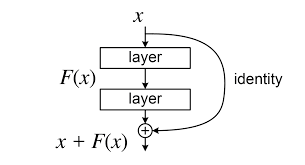

**Basic Residual Block**

    Input → Conv → BatchNorm → ReLU
          → Conv → BatchNorm → Add(Input) → ReLU → Output

**Bottleneck Residual Block** (for deeper networks like ResNet-50, 101, 152)

    Input → 1x1 Conv → BatchNorm → ReLU
          → 3x3 Conv → BatchNorm → ReLU
          → 1x1 Conv → BatchNorm → Add(Input) → ReLU → Output


The 1×1 convolutions reduce dimensions, making deeper networks computationally efficient.

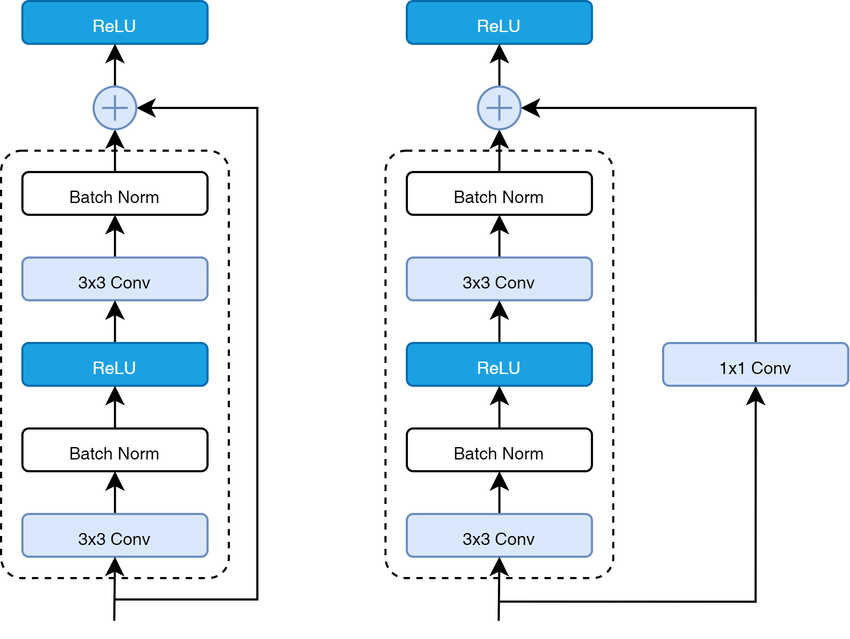

In [ ]:
import torch
import torch.nn as nn

# Basic Residual Block
class ResidualBasicBlock(nn.Module):
    expansion = 1  # No channel expansion in BasicBlock
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        # Shortcut (skip connection) adjustment
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels * self.expansion:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels * self.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels * self.expansion)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))      # Bxout_channelsxHxW
        out = self.bn2(self.conv2(out))                # Bxout_channelsxHxW
        out += self.shortcut(x)                        # Add skip connection
        out = torch.relu(out)                          # Bxout_channelsxHxW
        return out

In [ ]:
# Bottleneck Block (for ResNet-50, 101, 152, 200)
class ResidualBottleneck(nn.Module):
    expansion = 4  # Expands channels by 4x in the last conv
    def __init__(self, in_channels, out_channels, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)  # Reduce channels
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.conv3 = nn.Conv2d(out_channels, out_channels * self.expansion, kernel_size=1, bias=False)  # Expand channels
        self.bn3 = nn.BatchNorm2d(out_channels * self.expansion)
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels * self.expansion:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels * self.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels * self.expansion)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = torch.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = torch.relu(out)
        return out

**ResNet Architecture Overview**

filter_sizes = [64, 128, 256, 512] --> features

**ResNet-18 and ResNet-34:**
- Use BasicBlock: Two 3x3 conv layers with a skip connection.

**ResNet-50, ResNet-101, ResNet-152, and ResNet-200:**
- Use Bottleneck Block: Three conv layers (1x1 to reduce channels, 3x3, 1x1 to expand channels) with a skip connection.

**Layer Counts:**
1. ResNet-18: 1 initial conv + 8 basic blocks (16 conv layers) + 1 FC = 18 layers.
2. ResNet-34: 1 initial conv + 16 basic blocks (32 conv layers) + 1 FC = 34 layers.
3. ResNet-50: 1 initial conv + 16 bottleneck blocks (48 conv layers) + 1 FC = 50 layers.
4. ResNet-101: 1 initial conv + 33 bottleneck blocks (99 conv layers) + 1 FC = 101 layers.
5. ResNet-152: 1 initial conv + 50 bottleneck blocks (150 conv layers) + 1 FC = 152 layers.
6. ResNet-200: 1 initial conv + 66 bottleneck blocks (198 conv layers) + 1 FC = 200 layers.

<table border="1">
    <tr>
        <th>Variant</th>
        <th>Block Type</th>
        <th>Layer 1 (64)</th>
        <th>Layer 2 (128)</th>
        <th>Layer 3 (256)</th>
        <th>Layer 4 (512)</th>
        <th>Total Params (CIFAR-10)</th>
    </tr>
    <tr>
        <td>ResNet-18</td>
        <td>Basic</td>
        <td>2</td>
        <td>2</td>
        <td>2</td>
        <td>2</td>
        <td>~11.17M</td>
    </tr>
    <tr>
        <td>ResNet-34</td>
        <td>Basic</td>
        <td>3</td>
        <td>4</td>
        <td>6</td>
        <td>3</td>
        <td>~21.28M</td>
    </tr>
    <tr>
        <td>ResNet-50</td>
        <td>Bottleneck</td>
        <td>3</td>
        <td>4</td>
        <td>6</td>
        <td>3</td>
        <td>~23.52M</td>
    </tr>
    <tr>
        <td>ResNet-101</td>
        <td>Bottleneck</td>
        <td>3</td>
        <td>4</td>
        <td>23</td>
        <td>3</td>
        <td>~42.51M</td>
    </tr>
    <tr>
        <td>ResNet-152</td>
        <td>Bottleneck</td>
        <td>3</td>
        <td>8</td>
        <td>36</td>
        <td>3</td>
        <td>~58.16M</td>
    </tr>
    <tr>
        <td>ResNet-200</td>
        <td>Bottleneck</td>
        <td>3</td>
        <td>24</td>
        <td>36</td>
        <td>3</td>
        <td>~62.67M</td>
    </tr>
</table>


In [ ]:
class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_channels = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(512, num_blocks[3], stride=2)
        self.fc = nn.Linear(512, num_classes)

    def _make_layer(self, out_channels, num_blocks, stride):
        layers = []
        layers.append(block(self.in_channels, out_channels, stride))
        self.in_channels = out_channels
        for _ in range(1, num_blocks):
            layers.append(ResidualBlock(out_channels, out_channels))
        return nn.Sequential(*layers)

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = torch.nn.functional.adaptive_avg_pool2d(out, (1,1))
        out = torch.flatten(out, 1)
        return self.fc(out)

# Define All ResNet Variants
def ResNet18():
    return ResNet(ResidualBasicBlock, [2, 2, 2, 2])

def ResNet34():
    return ResNet(ResidualBasicBlock, [3, 4, 6, 3])

def ResNet50():
    return ResNet(ResidualBottleneck, [3, 4, 6, 3])

def ResNet101():
    return ResNet(ResidualBottleneck, [3, 4, 23, 3])

def ResNet152():
    return ResNet(ResidualBottleneck, [3, 8, 36, 3])

def ResNet200():
    return ResNet(ResidualBottleneck, [3, 24, 36, 3])

# Example usage:
model = ResNet18()
print(model)

In [ ]:
ResNet18().layer_summary((1, 1, 96, 96))

In [ ]:
from torchsummary import summary
summary(model, input_size=(3, 32, 32))

**Where is ResNet Used?**

- Image Classification (ResNet-50 is widely used in ImageNet benchmarks)
- Object Detection (Used in Faster R-CNN, YOLO, RetinaNet)
- Medical Imaging (Diagnosing diseases from X-rays, MRIs)
- Video Processing (Action Recognition using 3D ResNets)
- Generative Models (Used as discriminators in GANs)

In [ ]:
# Test All Variants
resnet_variants = {
    "ResNet-18": ResNet18,
    "ResNet-34": ResNet34,
    "ResNet-50": ResNet50,
    "ResNet-101": ResNet101,
    "ResNet-152": ResNet152,
    "ResNet-200": ResNet200
}

for name, resnet_fn in resnet_variants.items():
    model = resnet_fn().to(device)
    print(f"\n=== {name} ===")

    total_params = sum(p.numel() for p in model.parameters())
    print(f"Total number of parameters: {total_params}")

**Key Improvements in ResNet Variants**

<table border="1">
    <tr>
        <th>Variant</th>
        <th>Key Feature</th>
    </tr>
    <tr>
        <td>ResNet-18/34</td>
        <td>Basic ResNet with fewer layers.</td>
    </tr>
    <tr>
        <td>ResNet-50/101/152</td>
        <td>Uses bottleneck layers for deeper architectures.</td>
    </tr>
    <tr>
        <td>ResNeXt</td>
        <td>Uses grouped convolutions for better efficiency.</td>
    </tr>
    <tr>
        <td>Wide ResNet (WRN)</td>
        <td>Uses wider layers instead of deeper ones.</td>
    </tr>
    <tr>
        <td>ResNet-D</td>
        <td>Improves downsampling methods for better feature extraction.</td>
    </tr>
</table>


#### SqueezeNet (2016)

- SqueezeNet is a `lightweight` convolutional neural network (CNN) designed for low-latency and resource-efficient inference, making it ideal for mobile and embedded devices.

    S. Iandola, M. Moskewicz, K. Ashraf, et al. (2016).
    "SqueezeNet: AlexNet-level accuracy with 50x fewer parameters".
    https://arxiv.org/abs/1602.07360

Why SqueezeNet?
- Less memory → Suitable for mobile and IoT applications
- Faster inference → Enables real-time deep learning
- Easier model compression → Can be compressed to <0.5MB

💡 Key Fact:
SqueezeNet achieves AlexNet-level accuracy (57.5% Top-1 on ImageNet) but with 50× fewer parameters!

**Fire Module: The Core of SqueezeNet**

Each Fire module consists of:
1. Squeeze layer → Uses 1×1 convolutions to reduce input channels.
2. Expand layer → Uses a mix of 1×1 and 3×3 convolutions to maintain expressiveness.

This reduces parameters drastically while keeping a strong feature extraction ability.

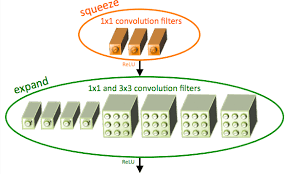

---
** note:

don't be confuse b/w SqueezeNet & SENet

SENet (Squeeze-and-Excitation Networks) introduces Squeeze-and-Excitation (SE) blocks that enhance feature maps through channel-wise attention mechanism.

---

In [ ]:
class FireModule(nn.Module):
    def __init__(self, in_channels, squeeze_channels, expand_channels):
        super(FireModule, self).__init__()
        # Squeeze layer
        self.squeeze = nn.Conv2d(in_channels, squeeze_channels, kernel_size=1)
        self.squeeze_activation = nn.ReLU(inplace=True)

        # Expand layer
        self.expand_1x1 = nn.Conv2d(squeeze_channels, expand_channels, kernel_size=1)
        self.expand_3x3 = nn.Conv2d(squeeze_channels, expand_channels, kernel_size=3, padding=1)

        self.expand_activation = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.squeeze_activation(self.squeeze(x))
        return self.expand_activation(torch.cat([
            self.expand_1x1(x), self.expand_3x3(x)
        ], dim=1))

**SqueezeNet Architecture Overview**

    Input (224×224×3)
          │
          ▼
    Conv1 (7×7, 96 filters, stride 2)
          │
          ▼
    MaxPool1 (3×3, stride 2)
          │
          ▼
    Fire Modules (8×)
          │
          ▼
    Conv10 (1×1, 1000 filters)
          │
          ▼
    Global Average Pooling (GAP)
          │
          ▼
    Softmax (1000 classes)


In [ ]:
class SqueezeNet(nn.Module):
    def __init__(self, num_classes=1000):
        super(SqueezeNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 96, kernel_size=7, stride=2, padding=3),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),

            FireModule(96, 16, 64),
            FireModule(128, 16, 64),
            FireModule(128, 32, 128),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),

            FireModule(256, 32, 128),
            FireModule(256, 48, 192),
            FireModule(384, 48, 192),
            FireModule(384, 64, 256),
            nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True),

            FireModule(512, 64, 256)
        )

        self.final_conv = nn.Conv2d(512, num_classes, kernel_size=1)
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.features(x)
        x = self.final_conv(x)
        x = self.global_avg_pool(x)
        return torch.flatten(x, 1)

#### DenseNet (2017)

    Huang, G., Liu, Z., Van Der Maaten, L., & Weinberger, K. Q. (2017).
    Densely Connected Convolutional Networks.
    Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2017, pp. 4700-4708.
    DOI: 10.1109/CVPR.2017.243

- Densely Connected Convolutional Networks introduced dense connections, where each layer is connected to every other layer in a feed-forward fashion.
- The number of parameters is reduced because of feature reuse.
- Includes dense blocks with convolutional layers followed by transition layers.
- particularly effective in tasks like segmentation.

**Dense Block Structure:**

Each layer in a Dense Block performs:
1. Batch Normalization (BN)
2. ReLU Activation
3. 3×3 Convolution (Conv2D)
4. Concatenation with Previous Outputs

**Transition Layers** are used between dense blocks to reduce dimensions via:
* 1×1 Convolution
* Average Pooling

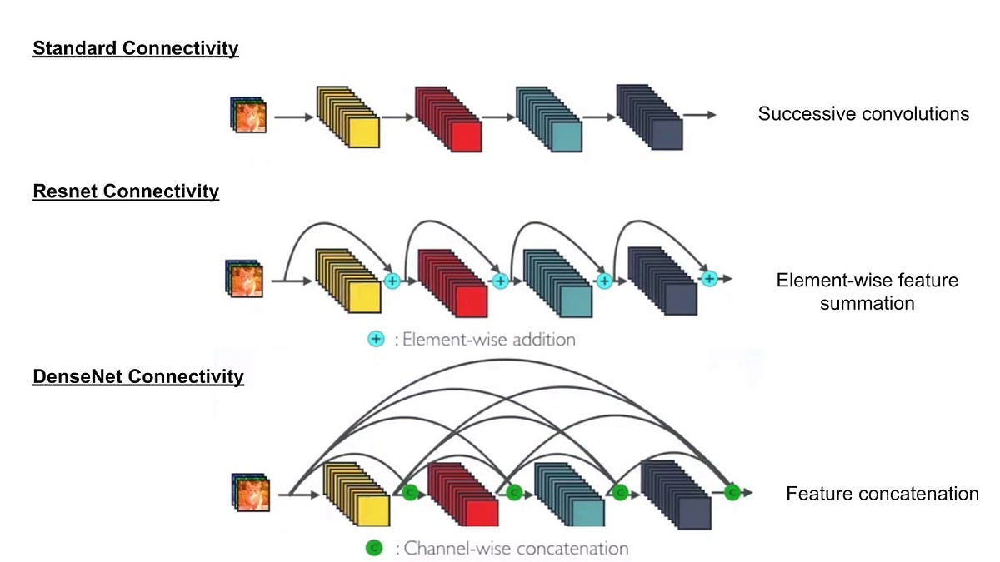

**Growth Rate (k):**
* Each layer produces k feature maps (a hyperparameter, e.g., 12 or 32), and the number of input channels to layer L is k0 + k⋅(L−1), where k0 is the initial number of channels.
* initial_channels = 2 * k
* Keeps the model lightweight by controlling the growth of channels.

In [ ]:
class DenseBlock(nn.Module):
    def __init__(self, in_channels, growth_rate, num_layers):
        super(DenseBlock, self).__init__()
        self.layers = nn.ModuleList()

        for i in range(num_layers):
            self.layers.append(nn.Conv2d(in_channels + i * growth_rate, growth_rate, kernel_size=3, padding=1, bias=False))

    def forward(self, x):
        outputs = [x]
        for layer in self.layers:
            out = F.relu(layer(torch.cat(outputs, dim=1)))  # Concatenation
            outputs.append(out)
        return torch.cat(outputs, dim=1)

In [ ]:
class TransitionLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(TransitionLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.pool = nn.AvgPool2d(2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.pool(x)
        return x

**DenseNet-121 Architecture**

<table border="1">
    <tr>
        <th>Layer Type</th>
        <th>Filters / Output Size</th>
    </tr>
    <tr>
        <td>Conv Layer (7×7, stride 2)</td>
        <td>64 × 112 × 112</td>
    </tr>
    <tr>
        <td>Max Pooling (3×3, stride 2)</td>
        <td>64 × 56 × 56</td>
    </tr>
    <tr>
        <td>Dense Block 1</td>
        <td>6 Layers</td>
    </tr>
    <tr>
        <td>Transition Layer 1</td>
        <td>1×1 Conv + AvgPool</td>
    </tr>
    <tr>
        <td>Dense Block 2</td>
        <td>12 Layers</td>
    </tr>
    <tr>
        <td>Transition Layer 2</td>
        <td>1×1 Conv + AvgPool</td>
    </tr>
    <tr>
        <td>Dense Block 3</td>
        <td>24 Layers</td>
    </tr>
    <tr>
        <td>Transition Layer 3</td>
        <td>1×1 Conv + AvgPool</td>
    </tr>
    <tr>
        <td>Dense Block 4</td>
        <td>16 Layers</td>
    </tr>
    <tr>
        <td>Final FC Layer</td>
        <td>Softmax</td>
    </tr>
</table>


**DenseNet Architecture Example with 3 Dense blocks**

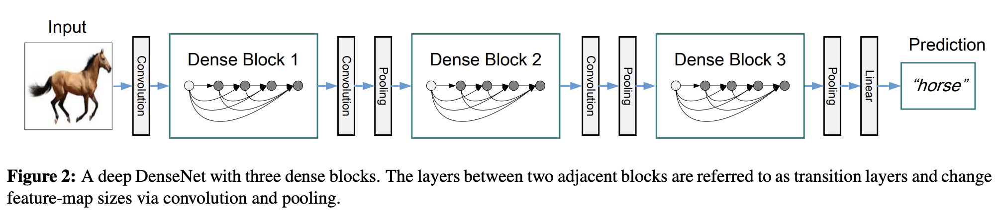

In [ ]:
class DenseNet(nn.Module):
    def __init__(self, growth_rate=32, num_blocks=[6, 12, 24, 16], num_classes=10):
        super(DenseNet, self).__init__()

        in_channels = 64
        self.init_conv = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)

        self.dense_blocks = nn.ModuleList()
        self.transition_layers = nn.ModuleList()

        for num_layers in num_blocks:
            block = DenseBlock(in_channels, growth_rate, num_layers)
            self.dense_blocks.append(block)
            in_channels += num_layers * growth_rate  # Update channel count

            if len(self.transition_layers) < len(num_blocks) - 1:
                transition = TransitionLayer(in_channels, in_channels // 2)
                self.transition_layers.append(transition)
                in_channels = in_channels // 2  # Reduce dimensions

        self.global_pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(in_channels, num_classes)

    def forward(self, x):
        x = F.relu(self.init_conv(x))
        for i, block in enumerate(self.dense_blocks):
            x = block(x)
            if i < len(self.transition_layers):
                x = self.transition_layers[i](x)
        x = self.global_pool(x)
        x = torch.flatten(x, 1)
        return self.fc(x)

# Initialize and test model
model = DenseNet(num_classes=10)
print(model)

<table border="1">
    <tr>
        <th>Variant</th>
        <th>Layers</th>
        <th>Blocks</th>
        <th>Growth Rate (k)</th>
        <th>Params (CIFAR-10)</th>
    </tr>
    <tr>
        <td>DenseNet-121</td>
        <td>121</td>
        <td>[6, 12, 24, 16]</td>
        <td>32</td>
        <td>~6.95M</td>
    </tr>
    <tr>
        <td>DenseNet-169</td>
        <td>169</td>
        <td>[6, 12, 32, 32]</td>
        <td>32</td>
        <td>~12.49M</td>
    </tr>
    <tr>
        <td>DenseNet-201</td>
        <td>201</td>
        <td>[6, 12, 48, 32]</td>
        <td>32</td>
        <td>~17.98M</td>
    </tr>
    <tr>
        <td>DenseNet-161</td>
        <td>161</td>
        <td>[6, 12, 36, 24]</td>
        <td>48</td>
        <td>~25.59M</td>
    </tr>
</table>


DenseNet-161: 161 layers, larger growth rate (k=48).

In [ ]:
# Define DenseNet Variants
def DenseNet121():
    return DenseNet( [6, 12, 24, 16], growth_rate=32, num_classes=10)

def DenseNet169():
    return DenseNet( [6, 12, 32, 32], growth_rate=32, num_classes=10)

def DenseNet201():
    return DenseNet( [6, 12, 48, 32], growth_rate=32, num_classes=10)

def DenseNet161():
    return DenseNet( [6, 12, 36, 24], growth_rate=48, num_classes=10)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Test All Variants
densenet_variants = {
    "DenseNet-121": DenseNet121,
    "DenseNet-169": DenseNet169,
    "DenseNet-201": DenseNet201,
    "DenseNet-161": DenseNet161
}

for name, densenet_fn in densenet_variants.items():
    model = densenet_fn().to(device)
    print(f"\n=== {name} ===")
    print("Architecture:")
    # print(model)
    total_params = sum(p.numel() for p in model.parameters())
    print(f"Total number of parameters: {total_params}")
    print("-" * 50)

#### Xception (2017)

    François Chollet, "Xception: Deep Learning with Depthwise Separable Convolutions", 2017.
    Available at: https://arxiv.org/abs/1610.02357

- Xception (Extreme Inception) is an advanced convolutional neural network introduced by François Chollet (creator of Keras) in 2017.

- It builds upon Inception networks by replacing standard convolutions with depthwise separable convolutions, significantly improving efficiency and performance.

**Key Ideas Behind Xception**

1. Depthwise Separable Convolutions – Factorizes a standard convolution into depthwise and pointwise convolutions, reducing computation while maintaining accuracy.
2. Fully Convolutional Architecture – Unlike Inception, Xception uses only depthwise separable convolutions without any fully connected layers at the end.

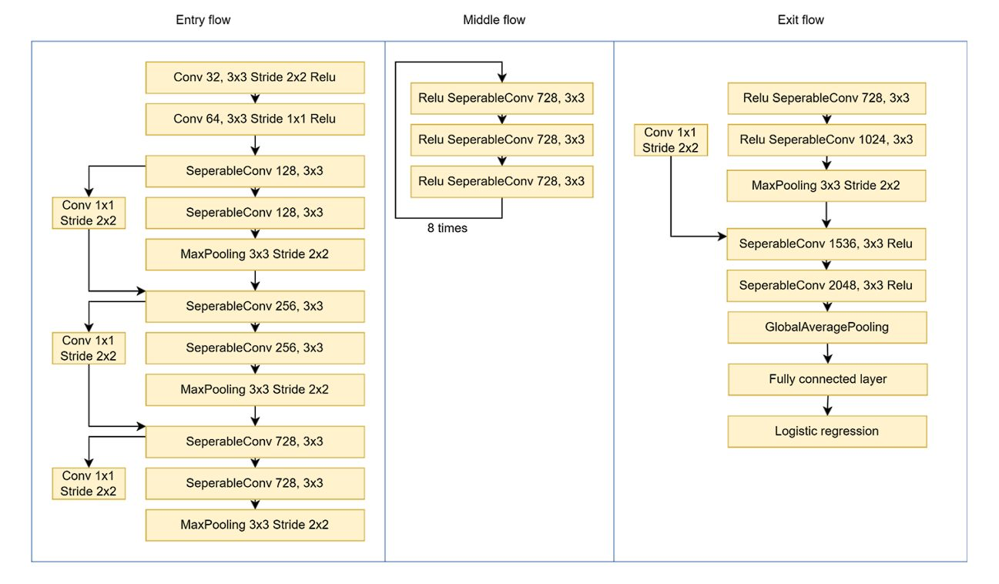

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SeparableConv2d(nn.Module):
    """Depthwise Separable Convolution"""
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(SeparableConv2d, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size, stride, padding, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, 1, bias=False)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        return x

class XceptionBlock(nn.Module):
    """Xception Block with Residual Connection"""
    def __init__(self, in_channels, out_channels):
        super(XceptionBlock, self).__init__()
        self.conv1 = SeparableConv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv2 = SeparableConv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.conv3 = SeparableConv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.residual = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, bias=False)

    def forward(self, x):
        residual = self.residual(x)
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.conv3(x)
        x += residual  # Skip connection
        return F.relu(x)

class Xception(nn.Module):
    """Full Xception Model"""
    def __init__(self, num_classes=1000):
        super(Xception, self).__init__()
        self.entry_flow = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            XceptionBlock(64, 128),
        )
        self.middle_flow = nn.Sequential(*[XceptionBlock(128, 128) for _ in range(8)])
        self.exit_flow = nn.Sequential(
            XceptionBlock(128, 256),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.fc = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.entry_flow(x)
        x = self.middle_flow(x)
        x = self.exit_flow(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

# Initialize the model
model = Xception(num_classes=10)  # Example for 10 classes
print(model)

Xception(
  (entry_flow): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): XceptionBlock(
      (conv1): SeparableConv2d(
        (depthwise): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
        (pointwise): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (conv2): SeparableConv2d(
        (depthwise): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=128, bias=False)
        (pointwise): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (conv3): SeparableConv2d(
        (depthwise): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=128, bias=False)
        (pointwise): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (residual): Conv2d(64, 128, kernel_size=(

comparing Xception and MobileNet:

<table border="1">
    <tr>
        <th>Feature</th>
        <th>Xception</th>
        <th>MobileNet</th>
    </tr>
    <tr>
        <td>Key Idea</td>
        <td>Uses depthwise separable convolutions throughout the network, replacing traditional convolutions.</td>
        <td>Uses depthwise separable convolutions but with depth multipliers and width multipliers to control model size.</td>
    </tr>
    <tr>
        <td>Complexity</td>
        <td>More complex due to multiple separable conv layers per block with residual connections.</td>
        <td>Simpler, designed for mobile and embedded applications.</td>
    </tr>
    <tr>
        <td>Skip Connections?</td>
        <td>✅ Yes, residual connections are present.</td>
        <td>❌ No residual connections.</td>
    </tr>
    <tr>
        <td>Fully Convolutional?</td>
        <td>✅ Yes, no fully connected layers.</td>
        <td>✅ Yes, except for the final classification layer.</td>
    </tr>
</table>


#### MobileNet (2017) 📱

    Howard, A. G., Zhu, M., Chen, B., Kalenichenko, D., Wang, W., Weyand, T., ... & Adam, H. (2017).
    "MobileNets: Efficient Convolutional Neural Networks for Mobile Vision Applications."
    arXiv preprint arXiv:1704.04861.

- Lightweight CNN for mobile devices.
- Designed for low-power, low-latency applications.
- Uses Depthwise & Pointwise Separable Convolutions.
- Advantages: Fast, small, efficient.
- Used in applications like `real-time` object detection, facial recognition, and edge AI deployment.

**Key Concepts in MobileNet:**

**Depthwise Separable Convolutions**

Instead of standard convolution (which applies multiple filters to the input), MobileNet splits the process into two steps:
1. **Depthwise Convolution:** Each filter applies to only one input channel.
2. **Pointwise Convolution (1×1 Conv):** Combines outputs from different channels.

🔹 Reduces computation by 8-9x while keeping similar accuracy!

In [ ]:
# Depthwise Separable Convolution Block
class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(DepthwiseSeparableConv, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=stride, padding=1, groups=in_channels, bias=False)
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.relu(self.bn1(self.depthwise(x)))
        x = self.relu(self.bn2(self.pointwise(x)))
        return x

**Width & Resolution Multipliers**

MobileNet introduces two hyperparameters to further control efficiency:
1. **Width Multiplier (α):** `Scales down the number of channels` (reduces model size), reducing computation and parameters further.
2. **Resolution Multiplier (ρ):** `Decreases input image resolution` (reduces computation). Reduces input resolution (e.g., from 224x224 to 192x192), trading accuracy for speed.

Example:

    α = 1.0, ρ = 1.0 → Standard MobileNet
    α = 0.75, ρ = 0.75 → Smaller & faster MobileNet

In [ ]:
def conv_channels(ch): return int(ch * alpha)  # Apply width multiplier

**MobileNet v1 Architecture (ImageNet)**

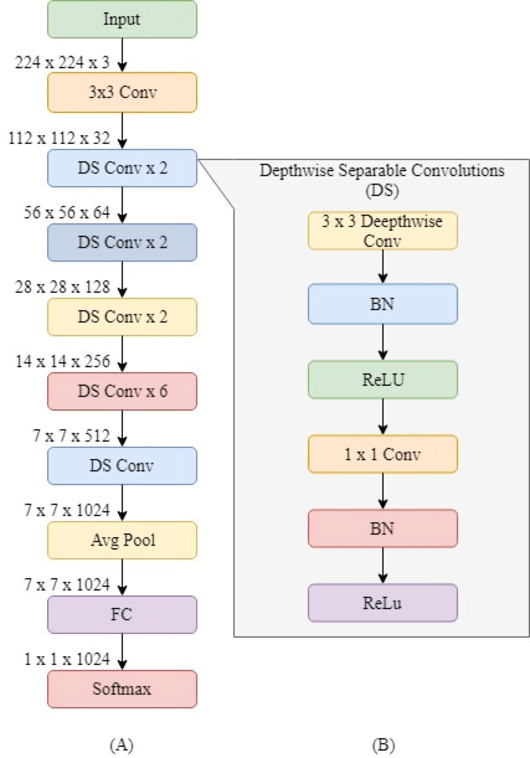

In [ ]:
# MobileNet v1 - (cifar-10 Adaptation)
class MobileNetV1(nn.Module):
    def __init__(self, num_classes=10, alpha=1.0):
        super(MobileNetV1, self).__init__()
        def conv_channels(ch): return int(ch * alpha)  # Apply width multiplier

        # Initial convolution
        self.conv1 = nn.Conv2d(3, conv_channels(32), kernel_size=3, stride=1, padding=1, bias=False)  # Bx3x32x32 -> Bx32x32x32
        self.bn1 = nn.BatchNorm2d(conv_channels(32))
        self.relu = nn.ReLU(inplace=True)

        # Depthwise separable layers
        self.layers = nn.Sequential(
            DepthwiseSeparableConv(conv_channels(32), conv_channels(64), stride=1),   # Bx32x32x32 -> Bx64x32x32
            DepthwiseSeparableConv(conv_channels(64), conv_channels(128), stride=2),  # Bx64x32x32 -> Bx128x16x16
            DepthwiseSeparableConv(conv_channels(128), conv_channels(128), stride=1), # Bx128x16x16 -> Bx128x16x16
            DepthwiseSeparableConv(conv_channels(128), conv_channels(256), stride=2), # Bx128x16x16 -> Bx256x8x8
            DepthwiseSeparableConv(conv_channels(256), conv_channels(256), stride=1), # Bx256x8x8 -> Bx256x8x8
            DepthwiseSeparableConv(conv_channels(256), conv_channels(512), stride=2), # Bx256x8x8 -> Bx512x4x4
            # 5x 512 blocks (simplified from original 6 for CIFAR-10)
            DepthwiseSeparableConv(conv_channels(512), conv_channels(512), stride=1), # Bx512x4x4 -> Bx512x4x4
            DepthwiseSeparableConv(conv_channels(512), conv_channels(512), stride=1),
            DepthwiseSeparableConv(conv_channels(512), conv_channels(512), stride=1),
            DepthwiseSeparableConv(conv_channels(512), conv_channels(512), stride=1),
            DepthwiseSeparableConv(conv_channels(512), conv_channels(512), stride=1),
            DepthwiseSeparableConv(conv_channels(512), conv_channels(1024), stride=2),# Bx512x4x4 -> Bx1024x2x2
            DepthwiseSeparableConv(conv_channels(1024), conv_channels(1024), stride=1)# Bx1024x2x2 -> Bx1024x2x2
        )

        # Final layers
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))  # Bx1024x2x2 -> Bx1024x1x1
        self.fc = nn.Linear(conv_channels(1024), num_classes)  # Bx1024 -> Bx10

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.layers(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

MobileNet v1: ~3.21M params for CIFAR-10 with α=1.0.
* Slightly less than the ImageNet version (~4.2M) due to fewer layers and smaller input size.
* Compare: DenseNet-121 (~ 6.95M), GoogLeNet (~ 6M), ResNet-18 (~ 11M), VGG-16 (~138M).

#### MobileNetV2 (2018)

    Sandler, M., Howard, A., Zhu, M., Zhmoginov, A., & Chen, L. C. (2018).
    "MobileNetV2: Inverted Residuals and Linear Bottlenecks."
    Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR).

MobileNetV2, introduced by Google in 2018, improves upon MobileNetV1 by adding `inverted residuals` and `linear bottlenecks`, making it faster, more efficient, and accurate for mobile & edge applications.

**Key Features of MobileNetV2:**

**Inverted Residuals**

* Unlike ResNet’s residuals (which reduce channels, process, then expand), MobileNetV2 expands channels first (using a 1x1 conv), applies a depthwise conv, then reduces channels back (using another 1x1 conv).

**How it works?**

* A `1×1 convolution` expands the feature space (increasing channels).
* A `3×3 depthwise convolution` processes the features.
- A final `1×1 pointwise convolution` compresses the output back.
- `Skip connections` are added for non-bottleneck layers.

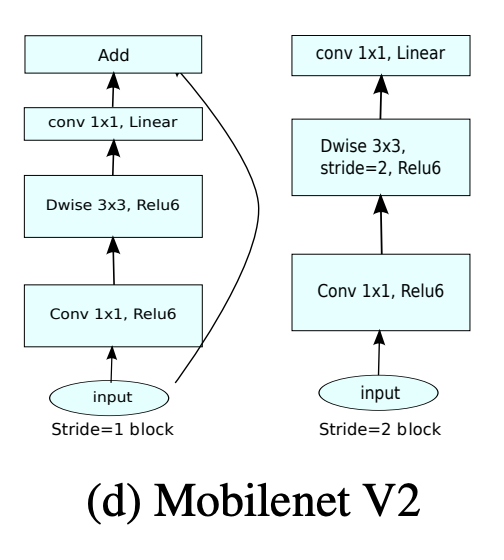

Keypoints:
* Expansion factor (t, typically 6) increases channels before the depthwise operation, allowing richer feature extraction with fewer parameters.
* Skip connections are added only when input and output dimensions match (stride 1).

In [ ]:
# Inverted Residual Block (MobileNetV2)
class InvertedResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, expansion=6):
        super(InvertedResidualBlock, self).__init__()
        self.stride = stride
        self.in_channels = in_channels
        self.out_channels = out_channels

        # Expansion layer (1x1 conv)
        expand_channels = in_channels * expansion
        self.conv1 = nn.Conv2d(in_channels, expand_channels, kernel_size=1, bias=False)  # Expansion
        self.bn1 = nn.BatchNorm2d(expand_channels)

        # Depthwise conv (3x3)
        self.conv2 = nn.Conv2d(expand_channels, expand_channels, kernel_size=3, stride=stride, padding=1, groups=expand_channels, bias=False)  # Depthwise
        self.bn2 = nn.BatchNorm2d(expand_channels)

        # Pointwise conv (1x1, linear)
        self.conv3 = nn.Conv2d(expand_channels, out_channels, kernel_size=1, bias=False)  # Projection (linear)
        self.bn3 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU6(inplace=True)      # ReLU6 instead of ReLU

    def forward(self, x):
        identity = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))  # Linear bottleneck (no ReLU)

        if self.stride == 1 and self.in_channels == self.out_channels:
            out += identity  # Skip connection
        return out

---
**Linear Bottlenecks**

* In deep networks, ReLU activation can destroy useful low-dimensional information.
* Instead, MobileNetV2 removes ReLU in the final layer to preserve details before compression.

note:

    out = self.bn3(self.conv3(out))  # Linear bottleneck (no ReLU)


Why?

- Helps retain more feature details, especially for low-power devices.
---

**ReLU6**

The authors use ReLU6 instead of ReLU, which limits the value of activations to a maximum of…well…6.

    def relu(x):
      return max(0, x)

    def relu6(x):
      return min(max(0, x), 6)

note:

    self.relu = nn.ReLU6(inplace=True)      # ReLU6 instead of ReLU
---

**MobileNetV2 Architecture Overview**



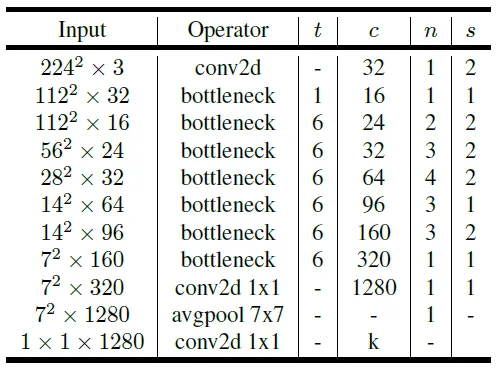

* t stands for expansion rate of the channels.
* c represents the number of input channels
* n how often the block is repeated.
* s tells us whether the first repetition of a block used a stride of 2 for the downsampling process.

In [ ]:
# MobileNetV2
class MobileNetV2(nn.Module):
    def __init__(self, num_classes=10, alpha=1.0):
        super(MobileNetV2, self).__init__()
        def conv_channels(ch): return int(ch * alpha)  # Width multiplier

        # Initial convolution
        self.conv1 = nn.Conv2d(3, conv_channels(32), kernel_size=3, stride=1, padding=1, bias=False)  # Bx3x32x32 -> Bx32x32x32
        self.bn1 = nn.BatchNorm2d(conv_channels(32))
        self.relu = nn.ReLU(inplace=True)

        # Bottleneck layers (simplified for CIFAR-10)
        self.layers = nn.Sequential(
            Bottleneck(conv_channels(32), conv_channels(16), stride=1, expansion=1),   # Bx32x32x32 -> Bx16x32x32
            Bottleneck(conv_channels(16), conv_channels(24), stride=2, expansion=6),   # Bx16x32x32 -> Bx24x16x16
            Bottleneck(conv_channels(24), conv_channels(24), stride=1, expansion=6),   # Bx24x16x16 -> Bx24x16x16
            Bottleneck(conv_channels(24), conv_channels(32), stride=2, expansion=6),   # Bx24x16x16 -> Bx32x8x8
            Bottleneck(conv_channels(32), conv_channels(32), stride=1, expansion=6),   # Bx32x8x8 -> Bx32x8x8
            Bottleneck(conv_channels(32), conv_channels(64), stride=2, expansion=6),   # Bx32x8x8 -> Bx64x4x4
            Bottleneck(conv_channels(64), conv_channels(64), stride=1, expansion=6),   # Bx64x4x4 -> Bx64x4x4
            Bottleneck(conv_channels(64), conv_channels(96), stride=1, expansion=6),   # Bx64x4x4 -> Bx96x4x4
            Bottleneck(conv_channels(96), conv_channels(96), stride=1, expansion=6),   # Bx96x4x4 -> Bx96x4x4
            Bottleneck(conv_channels(96), conv_channels(160), stride=2, expansion=6),  # Bx96x4x4 -> Bx160x2x2
            Bottleneck(conv_channels(160), conv_channels(160), stride=1, expansion=6), # Bx160x2x2 -> Bx160x2x2
            Bottleneck(conv_channels(160), conv_channels(320), stride=1, expansion=6), # Bx160x2x2 -> Bx320x2x2
        )

        # Final convolution - classifer[0]
        self.conv2 = nn.Conv2d(conv_channels(320), conv_channels(1280), kernel_size=1, bias=False)  # Bx320x2x2 -> Bx1280x2x2
        self.bn2 = nn.BatchNorm2d(conv_channels(1280))

        # Final layers - classifer[1]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))  # Bx1280x2x2 -> Bx1280x1x1
        self.fc = nn.Linear(conv_channels(1280), num_classes)  # Bx1280 -> Bx10

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.layers(x)
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

# Model Setup
model = MobileNetV2(num_classes=10, alpha=1.0).to(device)

# Inspect Architecture
print("Model Architecture:")
print(model)

Applications of MobileNetV2

- Real-Time Object Detection (Used in SSD & YOLO on mobile devices)
- Face Recognition (Google Photos, Android Face Unlock)
- Pose Estimation (Used in Google’s MoveNet)
- Medical Imaging (Deployable AI for X-ray, ultrasound analysis)

---
---

#### SENet (2018)

    Hu, J., Shen, L., & Sun, G. (2018).
    Squeeze-and-Excitation Networks.
    Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2018, pp. 7132-7141.
    https://arxiv.org/abs/1709.01507

The concept of Squeeze-and-Excitation (SE) blocks comes from the following paper:

Hu, J., Shen, L., & Sun, G. (2018). "`Squeeze-and-Excitation Networks`".

**Squeeze-and-Excitation (SE) blocks:**

Why use SE blocks?
- They `increase accuracy` with minimal extra computation.
- They allow the network to focus on important features.
- They are `lightweight and efficient`, making them ideal for MobileNets and other efficient architectures.

**How SE Blocks Work:**

**Key Idea:** Channels with high importance get boosted, while less relevant ones get suppressed.

The SE mechanism consists of three main steps:

1. **Squeeze** (Global Average Pooling)
  - Compresses each feature map into a single value by applying Global Average Pooling (GAP).
  - This creates a global context vector that summarizes the entire feature map.
    - s_c = 1/H×W i=1∑H j=1∑W X_c(i,j)
    - where X_c(i,j) is the activation at spatial position (i, j) in channel c.

2. **Excitation** (Fully Connected + ReLU + Sigmoid)
  - Two fully connected (FC) layers learn how important each channel is.
  - First FC layer reduces dimensionality (compression).
  - Second FC layer restores dimensionality (expansion).
  - ReLU activation is applied after the first FC layer.
  - Sigmoid activation is applied at the end to generate channel-wise attention weights.
    - z=σ(W2⋅ReLU(W1⋅s))
    - where W1 and W2 are FC layers, and σ is the sigmoid function.

3. **Scaling** (Feature Recalibration)
- The computed weights scale the original feature maps using channel-wise multiplication.
  - X_c′ = X_c​	 ×z_c
  - where z_c is the learned weight for each channel.

    Input Feature Map (C × H × W)
          │
          ▼
    Global Average Pooling (H × W → 1)  →  (C × 1 × 1)
          │
          ▼
    Fully Connected (Reduce: C → C/r)
          │
          ▼
    ReLU Activation
          │
          ▼
    Fully Connected (Expand: C/r → C)
          │
          ▼
    Sigmoid Activation (0 to 1)
          │
          ▼
    Channel-wise Scaling (Multiply original features)
          │
          ▼
    Output Feature Map (Enhanced)


In [ ]:
import torch
import torch.nn as nn

class SEBlock(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super(SEBlock, self).__init__()
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)  # (C, H, W) -> (C, 1, 1)
        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),  # Reduce
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction, in_channels, bias=False),  # Expand
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.global_avg_pool(x).view(b, c)  # Squeeze
        y = self.fc(y).view(b, c, 1, 1)  # Excite
        return x * y.expand_as(x)  # Scale feature maps

# Example Usage
input_tensor = torch.randn(1, 64, 32, 32)  # Batch size=1, 64 channels, 32x32 spatial
se_block = SEBlock(in_channels=64)
output = se_block(input_tensor)

print("Input Shape:", input_tensor.shape)   # (1, 64, 32, 32)
print("Output Shape:", output.shape)       # (1, 64, 32, 32) (same shape, but weighted)


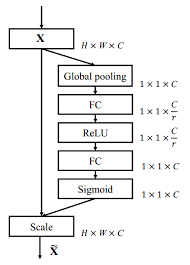

SE Blocks have been integrated into many popular CNN architectures:

<table border="1">
    <tr>
        <th>Model</th>
        <th>Year</th>
        <th>SE Integration</th>
        <th>Top-1 Accuracy (ImageNet)</th>
    </tr>
    <tr>
        <td>ResNet-50</td>
        <td>2015</td>
        <td>❌ No SE</td>
        <td>76.2%</td>
    </tr>
    <tr>
        <td>ResNet-50-SE (SENet)</td>
        <td>2018</td>
        <td>✅ SE</td>
        <td>78.5%</td>
    </tr>
    <tr>
        <td>MobileNetV3</td>
        <td>2019</td>
        <td>✅ SE in key layers</td>
        <td>75.2%</td>
    </tr>
    <tr>
        <td>EfficientNet</td>
        <td>2019</td>
        <td>✅ SE in every block</td>
        <td>84.4%</td>
    </tr>
    <tr>
        <td>RegNet</td>
        <td>2020</td>
        <td>✅ SE optional</td>
        <td>81.5%</td>
    </tr>
</table>


**Squeeze-and-Excitation Network (SENet)**

ResNet-50-SE(SENet)
- Modify the Bottleneck blocks to integrate SE layers
- Keep the standard ResNet-50 architecture

In [ ]:
# Modified Bottleneck block with SE
class SEBottleneck(nn.Module):
    expansion = 4  # Standard ResNet-50 expansion

    def __init__(self, in_channels, out_channels, stride=1, downsample=None, reduction=16):
        super(SEBottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.conv3 = nn.Conv2d(out_channels, out_channels * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels * 4)

        self.se = SEBlock(out_channels * 4, reduction)  # Add SE Block here
        self.relu = nn.ReLU(inplace=True)

        self.downsample = downsample  # Identity or projection shortcut

    def forward(self, x):
        identity = x
        if self.downsample is not None:
            identity = self.downsample(x)

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        out = self.se(out)  # Apply SE block here

        out += identity  # Residual connection
        out = self.relu(out)

        return out


In [ ]:
class ResNet50SE(nn.Module):
    def __init__(self, num_classes=1000):
        super(ResNet50SE, self).__init__()
        resnet = models.resnet50(pretrained=False)  # Load ResNet-50
        self.in_channels = 64

        # Modify first convolution layer
        self.conv1 = resnet.conv1
        self.bn1 = resnet.bn1
        self.relu = resnet.relu
        self.maxpool = resnet.maxpool

        # Replace ResNet Bottleneck blocks with SEBottleneck
        self.layer1 = self._make_layer(SEBottleneck, 64, 3)
        self.layer2 = self._make_layer(SEBottleneck, 128, 4, stride=2)
        self.layer3 = self._make_layer(SEBottleneck, 256, 6, stride=2)
        self.layer4 = self._make_layer(SEBottleneck, 512, 3, stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * SEBottleneck.expansion, num_classes)

    def _make_layer(self, block, out_channels, blocks, stride=1):
        downsample = None
        if stride != 1 or self.in_channels != out_channels * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.in_channels, out_channels * block.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels * block.expansion)
            )

        layers = [block(self.in_channels, out_channels, stride, downsample)]
        self.in_channels = out_channels * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.in_channels, out_channels))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x



___
---

#### MobileNetV3 (2019)

MobileNetV3, introduced by Google in 2019, improves speed, efficiency, and accuracy compared to previous versions.

    Howard, A., Sandler, M., Chu, G., Chen, L.-C., Tan, M., Wang, B., Zhu, W., Pang, R., Vasudevan, V., Le, Q. V., & Adam, H. (2019).
    "Searching for MobileNetV3".
    Proceedings of the IEEE/CVF International Conference on Computer Vision (ICCV).

    You can also find the paper on arXiv: https://arxiv.org/abs/1905.02244

**Key Innovations in MobileNetV3**

**Neural Architecture Search (NAS)**
* Instead of manually designing the architecture, Google used AutoML to find the best structure.
* Uses NAS to optimize layer configurations (e.g., number of filters, expansion factors), balancing accuracy and latency.
* The result? Better performance with fewer computations.


we skip detailed explaination on working of NAS, in Popular CNN Architecture. You can refer - Advanced CNN Architectures - for NAS

**Inverted Residuals and Linear Bottlenecks:**
* Inherited from MobileNetV2: Expands channels (1x1), applies depthwise conv (3x3 or 5x5), then reduces channels (1x1, linear).
* Expansion factor (t) varies per layer (e.g., 1, 4, 6).

**Hard-Swish (h-swish) Activation:**
* MobileNetV3 replaces ReLU6 with Hard-Swish, which is smoother and more efficient.
* Hard-Swish function:

        h_swish(x) = x⋅ ReLU6(x+3)/6

* More expressive than ReLU6, computationally efficient (approximated in hardware), and quantization-friendly.


**Squeeze-and-Excitation (SE) Blocks:**

* SE blocks `dynamically adjust channel-wise feature` importance.
* How? It applies a global average pooling → two FC layers → sigmoid activation to rescale feature maps.
* Result? MobileNetV3 learns to focus on important features → higher accuracy with fewer parameters.

<table border="1">
    <tr>
        <th>Model</th>
        <th>Params</th>
        <th>Top-1 Accuracy</th>
        <th>FLOPs (Million)</th>
    </tr>
    <tr>
        <td>MobileNetV1</td>
        <td>4.2M</td>
        <td>70.6%</td>
        <td>569M</td>
    </tr>
    <tr>
        <td>MobileNetV2</td>
        <td>3.4M</td>
        <td>72.0%</td>
        <td>300M</td>
    </tr>
    <tr>
        <td>MobileNetV3-Small</td>
        <td>2.5M</td>
        <td>67.4%</td>
        <td>66M</td>
    </tr>
    <tr>
        <td>MobileNetV3-Large</td>
        <td>5.4M</td>
        <td>75.2%</td>
        <td>219M</td>
    </tr>
</table>


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Data Preparation (CIFAR-10)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.491, 0.482, 0.447), (0.247, 0.243, 0.261))
])

batch_size = 128
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)

# H-Swish Activation
class HSwish(nn.Module):
    def __init__(self, inplace=True):
        super(HSwish, self).__init__()
        self.relu6 = nn.ReLU6(inplace=inplace)

    def forward(self, x):
        return x * self.relu6(x + 3) / 6  # h-swish(x) = x * ReLU6(x+3) / 6

# Squeeze-and-Excitation Block
class SEBlock(nn.Module):
    def __init__(self, in_channels, reduction=4):
        super(SEBlock, self).__init__()
        reduced_channels = max(1, in_channels // reduction)
        self.se = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),  # Squeeze
            nn.Conv2d(in_channels, reduced_channels, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(reduced_channels, in_channels, kernel_size=1),
            nn.Sigmoid()  # Excite
        )

    def forward(self, x):
        se = self.se(x)
        return x * se  # Scale input features

# MobileNetV3 Bottleneck Block
class Bottleneck(nn.Module):
    def __init__(self, in_channels, out_channels, exp_channels, kernel_size, stride, use_se=False):
        super(Bottleneck, self).__init__()
        self.stride = stride
        self.use_se = use_se

        # Expansion layer
        self.conv1 = nn.Conv2d(in_channels, exp_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(exp_channels)

        # Depthwise conv
        self.conv2 = nn.Conv2d(exp_channels, exp_channels, kernel_size=kernel_size, stride=stride, padding=kernel_size//2, groups=exp_channels, bias=False)
        self.bn2 = nn.BatchNorm2d(exp_channels)

        # SE block (optional)
        self.se = SEBlock(exp_channels) if use_se else nn.Identity()

        # Pointwise conv (linear)
        self.conv3 = nn.Conv2d(exp_channels, out_channels, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels)

        self.hswish = HSwish(inplace=True)

    def forward(self, x):
        identity = x
        out = self.hswish(self.bn1(self.conv1(x)))  # Expansion with h-swish
        out = self.hswish(self.bn2(self.conv2(out)))  # Depthwise with h-swish
        out = self.se(out)  # SE block if enabled
        out = self.bn3(self.conv3(out))  # Linear bottleneck (no activation)

        if self.stride == 1 and self.in_channels == self.out_channels:
            out += identity  # Skip connection
        return out

# MobileNetV3-Small
class MobileNetV3Small(nn.Module):
    def __init__(self, num_classes=10, alpha=1.0):
        super(MobileNetV3Small, self).__init__()
        self.in_channels = in_channels = int(16 * alpha)

        # Initial convolution
        self.conv1 = nn.Conv2d(3, in_channels, kernel_size=3, stride=1, padding=1, bias=False)  # Bx3x32x32 -> Bx16x32x32
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.hswish = HSwish(inplace=True)

        # Bottleneck layers (adapted for CIFAR-10)
        self.layers = nn.Sequential(
            Bottleneck(in_channels, int(16 * alpha), 16, 3, 2, use_se=True),    # Bx16x32x32 -> Bx16x16x16
            Bottleneck(int(16 * alpha), int(24 * alpha), 72, 3, 2, use_se=False), # Bx16x16x16 -> Bx24x8x8
            Bottleneck(int(24 * alpha), int(24 * alpha), 88, 3, 1, use_se=False), # Bx24x8x8 -> Bx24x8x8
            Bottleneck(int(24 * alpha), int(40 * alpha), 96, 5, 2, use_se=True),  # Bx24x8x8 -> Bx40x4x4
            Bottleneck(int(40 * alpha), int(40 * alpha), 240, 5, 1, use_se=True), # Bx40x4x4 -> Bx40x4x4
            Bottleneck(int(40 * alpha), int(40 * alpha), 240, 5, 1, use_se=True), # Bx40x4x4 -> Bx40x4x4
            Bottleneck(int(40 * alpha), int(48 * alpha), 120, 5, 1, use_se=True), # Bx40x4x4 -> Bx48x4x4
            Bottleneck(int(48 * alpha), int(48 * alpha), 144, 5, 1, use_se=True), # Bx48x4x4 -> Bx48x4x4
            Bottleneck(int(48 * alpha), int(96 * alpha), 288, 5, 2, use_se=True), # Bx48x4x4 -> Bx96x2x2
            Bottleneck(int(96 * alpha), int(96 * alpha), 576, 5, 1, use_se=True), # Bx96x2x2 -> Bx96x2x2
            Bottleneck(int(96 * alpha), int(96 * alpha), 576, 5, 1, use_se=True), # Bx96x2x2 -> Bx96x2x2
        )

        # Final layers
        self.conv2 = nn.Conv2d(int(96 * alpha), int(576 * alpha), kernel_size=1, bias=False)  # Bx96x2x2 -> Bx576x2x2
        self.bn2 = nn.BatchNorm2d(int(576 * alpha))
        self.conv3 = nn.Conv2d(int(576 * alpha), int(1024 * alpha), kernel_size=1, bias=False)  # Bx576x2x2 -> Bx1024x2x2
        self.bn3 = nn.BatchNorm2d(int(1024 * alpha))
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))  # Bx1024x2x2 -> Bx1024x1x1
        self.fc = nn.Linear(int(1024 * alpha), num_classes)  # Bx1024 -> Bx10

    def forward(self, x):
        x = self.hswish(self.bn1(self.conv1(x)))
        x = self.layers(x)
        x = self.hswish(self.bn2(self.conv2(x)))
        x = self.hswish(self.bn3(self.conv3(x)))
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

# Model Setup
model = MobileNetV3Small(num_classes=10, alpha=1.0).to(device)

# Inspect Architecture
print("Model Architecture:")
print(model)

#### EfficientNet (2019) 🚀

    "EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks"
    Mingxing Tan, Quoc V. Le
    📄 Proceedings of the 36th International Conference on Machine Learning (ICML), 2019
    https://arxiv.org/abs/1905.11946

- Uses Neural Architecture Search (NAS) for auto-scaling.
- Achieves high accuracy with fewer parameters.
- Advantages: Best balance of accuracy vs. efficiency.

**Key Innovations in EfficientNet:**

1. **Compound Scaling** (The Core Idea)
- Traditional CNNs scale models randomly by increasing depth (layers), width (channels), or resolution (input size).
- EfficientNet uses a compound scaling method that balances all three in a systematic way.
- Scaling formula:
    - depth = α^ϕ,
    - width = β^ϕ,
    - resolution = γ^ϕ
    - where ϕ is a scaling coefficient, and α,β,γ are constants.

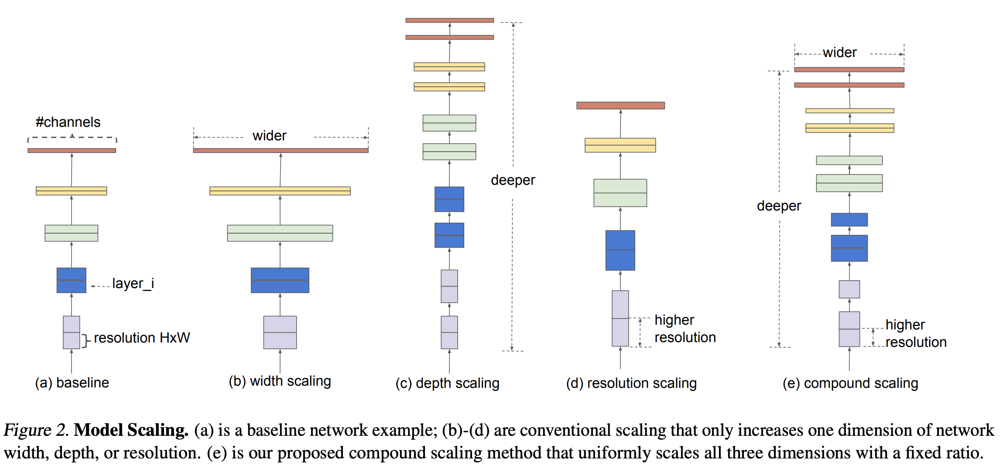

2. **MBConv** (`Inverted Residuals` & `Squeeze-and-Excitation`)
- Uses `MobileNet-style depthwise separable convolutions` to reduce computations.
- `Squeeze-and-Excitation (SE) blocks` dynamically recalibrate channel-wise feature responses, improving accuracy with minimal overhead.

3. **AutoML & Neural Architecture Search (NAS)**
- EfficientNet models were not manually designed but discovered via AutoML (Neural Architecture Search).
- It starts with a small baseline model (EfficientNet-B0) and applies compound scaling to get B1 → B7 models.

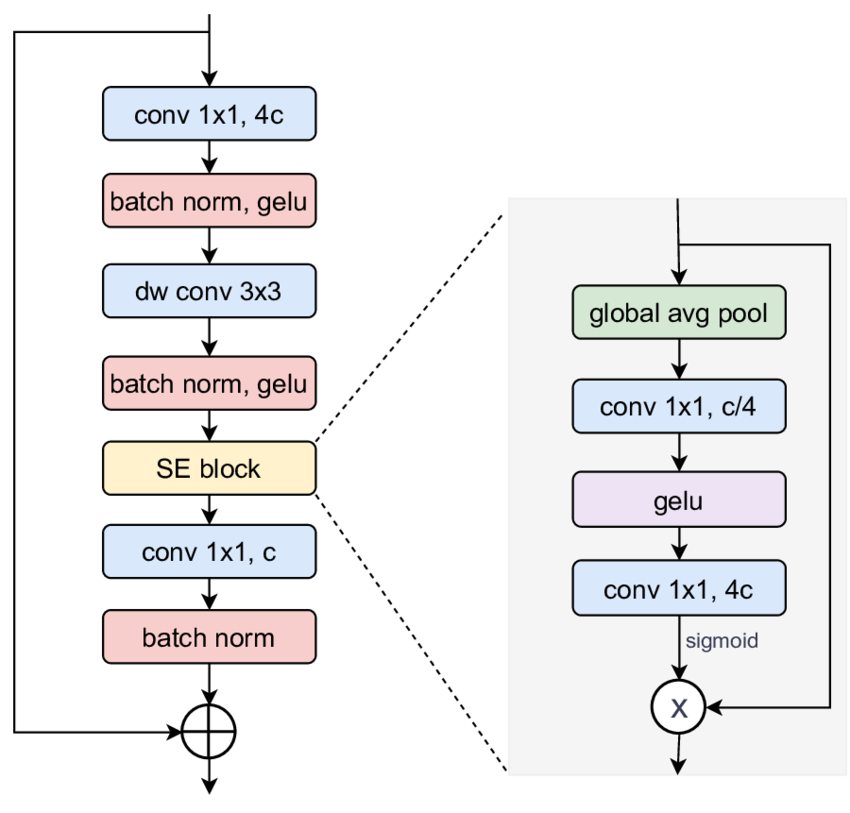

**EfficientNet Model Variants**

<table border="1">
    <tr>
        <th>Model</th>
        <th>Parameters (M)</th>
        <th>FLOPs (B)</th>
        <th>Top-1 Accuracy (%)</th>
    </tr>
    <tr>
        <td>EfficientNet-B0</td>
        <td>5.3M</td>
        <td>0.39</td>
        <td>77.1</td>
    </tr>
    <tr>
        <td>EfficientNet-B1</td>
        <td>7.8M</td>
        <td>0.70</td>
        <td>79.1</td>
    </tr>
    <tr>
        <td>EfficientNet-B2</td>
        <td>9.2M</td>
        <td>1.0</td>
        <td>80.1</td>
    </tr>
    <tr>
        <td>EfficientNet-B3</td>
        <td>12M</td>
        <td>1.8</td>
        <td>81.6</td>
    </tr>
    <tr>
        <td>EfficientNet-B4</td>
        <td>19M</td>
        <td>4.2</td>
        <td>83.0</td>
    </tr>
    <tr>
        <td>EfficientNet-B5</td>
        <td>30M</td>
        <td>9.9</td>
        <td>83.6</td>
    </tr>
    <tr>
        <td>EfficientNet-B6</td>
        <td>43M</td>
        <td>19.0</td>
        <td>84.0</td>
    </tr>
    <tr>
        <td>EfficientNet-B7</td>
        <td>66M</td>
        <td>37.0</td>
        <td>84.4</td>
    </tr>
</table>


EfficientNet uses the following scaling coefficients:

<table border="1">
    <tr>
        <th>Model</th>
        <th>Depth</th>
        <th>Width</th>
        <th>Resolution</th>
    </tr>
    <tr>
        <td>EfficientNet-B0</td>
        <td>1.0</td>
        <td>1.0</td>
        <td>224×224</td>
    </tr>
    <tr>
        <td>EfficientNet-B1</td>
        <td>1.1</td>
        <td>1.2</td>
        <td>240×240</td>
    </tr>
    <tr>
        <td>EfficientNet-B2</td>
        <td>1.2</td>
        <td>1.4</td>
        <td>260×260</td>
    </tr>
    <tr>
        <td>EfficientNet-B3</td>
        <td>1.4</td>
        <td>1.8</td>
        <td>300×300</td>
    </tr>
    <tr>
        <td>EfficientNet-B4</td>
        <td>1.8</td>
        <td>2.2</td>
        <td>380×380</td>
    </tr>
    <tr>
        <td>EfficientNet-B5</td>
        <td>2.2</td>
        <td>2.6</td>
        <td>456×456</td>
    </tr>
    <tr>
        <td>EfficientNet-B6</td>
        <td>2.6</td>
        <td>3.1</td>
        <td>528×528</td>
    </tr>
    <tr>
        <td>EfficientNet-B7</td>
        <td>3.1</td>
        <td>3.6</td>
        <td>600×600</td>
    </tr>
</table>


<img alt="Architecture of EfficientNet-B0" height="703" src="https://ucarecdn.com/1b5c081c-231a-484e-881c-cb4d51eb8e37/" width="1474">

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SqueezeExcite(nn.Module):
    def __init__(self, in_channels, se_ratio=0.25):
        super(SqueezeExcite, self).__init__()
        squeezed_channels = max(1, int(in_channels * se_ratio))
        self.fc1 = nn.Conv2d(in_channels, squeezed_channels, kernel_size=1)
        self.fc2 = nn.Conv2d(squeezed_channels, in_channels, kernel_size=1)

    def forward(self, x):
        se = x.mean((2, 3), keepdim=True)  # Global Average Pooling
        se = F.relu(self.fc1(se))
        se = torch.sigmoid(self.fc2(se))
        return x * se

class MBConv(nn.Module):
    def __init__(self, in_channels, out_channels, expansion, stride, se_ratio=0.25):
        super(MBConv, self).__init__()
        hidden_dim = in_channels * expansion
        self.stride = stride
        self.use_residual = stride == 1 and in_channels == out_channels

        self.expand = nn.Conv2d(in_channels, hidden_dim, kernel_size=1, bias=False) if expansion != 1 else None
        self.bn1 = nn.BatchNorm2d(hidden_dim) if expansion != 1 else None

        self.depthwise = nn.Conv2d(hidden_dim, hidden_dim, kernel_size=3, stride=stride, padding=1, groups=hidden_dim, bias=False)
        self.bn2 = nn.BatchNorm2d(hidden_dim)
        self.se = SqueezeExcite(hidden_dim, se_ratio)

        self.project = nn.Conv2d(hidden_dim, out_channels, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        identity = x
        if self.expand:
            x = F.relu6(self.bn1(self.expand(x)))

        x = F.relu6(self.bn2(self.depthwise(x)))
        x = self.se(x)
        x = self.bn3(self.project(x))

        if self.use_residual:
            return x + identity
        else:
            return x

class EfficientNet(nn.Module):
    def __init__(self, model_variant="B0", num_classes=1000):
        super(EfficientNet, self).__init__()

        # EfficientNet Scaling Parameters
        scaling_params = {
            "B0": (1.0, 1.0, 224),
            "B1": (1.1, 1.2, 240),
            "B2": (1.2, 1.4, 260),
            "B3": (1.4, 1.8, 300),
            "B4": (1.8, 2.2, 380),
            "B5": (2.2, 2.6, 456),
            "B6": (2.6, 3.1, 528),
            "B7": (3.1, 3.6, 600)
        }

        depth, width, resolution = scaling_params[model_variant]

        base_channels = int(32 * width)
        self.conv1 = nn.Conv2d(3, base_channels, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(base_channels)

        self.blocks = nn.Sequential(
            MBConv(base_channels, int(16 * width), expansion=1, stride=1),  # Stage 1
            MBConv(int(16 * width), int(24 * width), expansion=6, stride=2),  # Stage 2
            MBConv(int(24 * width), int(40 * width), expansion=6, stride=2),  # Stage 3
            MBConv(int(40 * width), int(80 * width), expansion=6, stride=2),  # Stage 4
            MBConv(int(80 * width), int(112 * width), expansion=6, stride=1), # Stage 5
            MBConv(int(112 * width), int(192 * width), expansion=6, stride=2),# Stage 6
            MBConv(int(192 * width), int(320 * width), expansion=6, stride=1) # Stage 7
        )

        final_channels = int(1280 * width)
        self.conv2 = nn.Conv2d(int(320 * width), final_channels, kernel_size=1, bias=False)
        self.bn2 = nn.BatchNorm2d(final_channels)
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(final_channels, num_classes)

    def forward(self, x):
        x = F.relu6(self.bn1(self.conv1(x)))  # Stem
        x = self.blocks(x)                    # MBConv Blocks
        x = F.relu6(self.bn2(self.conv2(x)))   # Head
        x = self.avgpool(x).flatten(1)        # Global Pooling
        return self.fc(x)                     # Fully Connected Layer

# Example usage
model_variant = "B4"  # Change to B0, B1, ..., B7
model = EfficientNet(model_variant=model_variant, num_classes=10)
print(model)

#### GhostNet (2020)

    GhostNet: More Features from Cheap Operations
    Authors: Kai Han, Yunhe Wang, Qi Tian, Jianyuan Guo, Chunjing Xu, Chang Xu
    Conference: CVPR 2020
    https://arxiv.org/abs/1911.11907

- GhostNet is a lightweight deep learning architecture designed for mobile and edge AI applications.
- It achieves high accuracy with significantly fewer parameters and FLOPs (floating point operations per second).
- GhostNet follows a MobileNet-like structure but replaces regular convolutions with Ghost Modules.

Key Idea: **Ghost Module:**

Traditional CNNs have redundant feature maps—many of them contain similar or nearly identical information. Instead of computing all feature maps using expensive convolutions, GhostNet generates some of them cheaply from others.

**How does it work?**

- Regular Convolution: A small number of feature maps are computed using standard convolutions.
- ***Ghost Feature Maps:*** Extra feature maps are generated using simple linear transformations (cheap operations like depthwise convolutions).
- Merging the Features: The original and ghost feature maps are concatenated to form the final output.

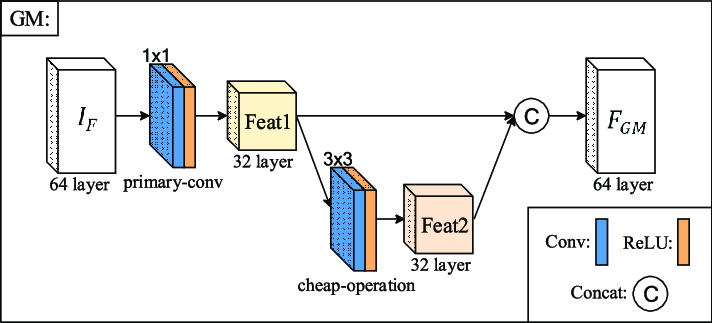

In [ ]:
import torch
import torch.nn as nn

class GhostModule(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=1, stride=1, ratio=2):
        super(GhostModule, self).__init__()
        hidden_channels = out_channels // ratio
        self.primary_conv = nn.Conv2d(in_channels, hidden_channels, kernel_size, stride, padding=kernel_size//2, bias=False)
        self.cheap_operation = nn.Conv2d(hidden_channels, hidden_channels, 3, 1, 1, groups=hidden_channels, bias=False)

    def forward(self, x):
        primary_features = self.primary_conv(x)
        ghost_features = self.cheap_operation(primary_features)
        return torch.cat([primary_features, ghost_features], dim=1)

GhostNet achieves accuracy similar to MobileNetV3 but with 36% fewer FLOPs!

<table border="1">
    <tr>
        <th>Model</th>
        <th>Top-1 Accuracy (ImageNet)</th>
        <th>Params (Million)</th>
        <th>FLOPs (M)</th>
    </tr>
    <tr>
        <td>ResNet-50</td>
        <td>76.2%</td>
        <td>25.6M</td>
        <td>4100M</td>
    </tr>
    <tr>
        <td>MobileNetV3</td>
        <td>75.2%</td>
        <td>5.4M</td>
        <td>220M</td>
    </tr>
    <tr>
        <td>GhostNet</td>
        <td>75.7%</td>
        <td>5.2M</td>
        <td>141M</td>
    </tr>
</table>


### Advanced CNN Architectures

#### Wide ResNet (2016)

    agoruyko, S., & Komodakis, N. (2016).
    "Wide residual networks".

    🔗 Paper Link: https://arxiv.org/abs/1605.07146

- Instead of making ResNets deeper (like ResNet-152), WRN increases width (more channels per layer) while keeping fewer layers.
- Results in better accuracy and efficiency with fewer parameters.

**WRN Basic Block:**

    Input → 3x3 Conv → BN → ReLU
          → 3x3 Conv → BN → ReLU → Skip Connection → Output

Instead of 1x1 bottleneck layers, WRN increases the number of channels directly.

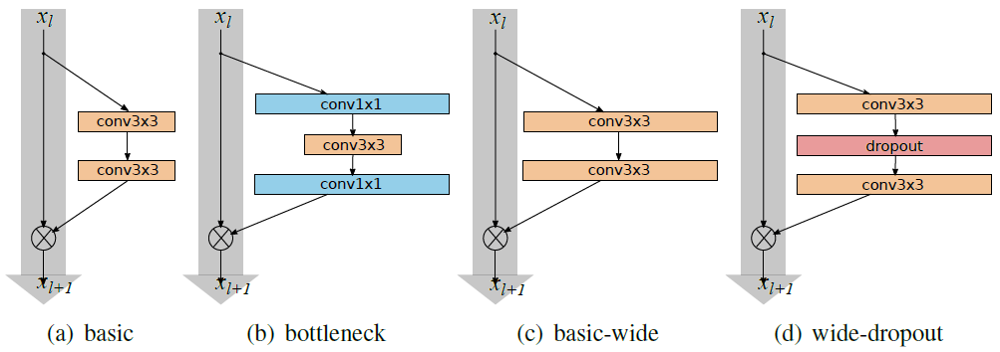

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class WRNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, widen_factor=2):
        super(WRNBlock, self).__init__()
        width = out_channels * widen_factor  # Increase width instead of depth
        self.conv1 = nn.Conv2d(in_channels, width, kernel_size=3, padding=1, stride=stride, bias=False)
        self.bn1 = nn.BatchNorm2d(width)

        self.conv2 = nn.Conv2d(width, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)  # Skip connection
        return torch.relu(out)

**WRN Architecture**

In [ ]:
class WideResNet(nn.Module):
    def __init__(self, depth=28, widen_factor=10, num_classes=10):
        super(WideResNet, self).__init__()
        assert (depth - 4) % 6 == 0  # WRN structure check
        n = (depth - 4) // 6  # Number of WRN blocks per stage

        filters = [16, 16*widen_factor, 32*widen_factor, 64*widen_factor]

        self.conv1 = nn.Conv2d(3, filters[0], kernel_size=3, padding=1, bias=False)

        self.stage1 = self._make_layer(WRNBlock, filters[0], filters[1], n, stride=1)
        self.stage2 = self._make_layer(WRNBlock, filters[1], filters[2], n, stride=2)
        self.stage3 = self._make_layer(WRNBlock, filters[2], filters[3], n, stride=2)

        self.bn = nn.BatchNorm2d(filters[3])
        self.fc = nn.Linear(filters[3], num_classes)

    def _make_layer(self, block, in_channels, out_channels, num_blocks, stride):
        layers = []
        for i in range(num_blocks):
            layers.append(block(in_channels if i == 0 else out_channels, out_channels, stride if i == 0 else 1))
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.stage1(out)
        out = self.stage2(out)
        out = self.stage3(out)
        out = F.relu(self.bn(out))
        out = F.adaptive_avg_pool2d(out, 1)
        out = torch.flatten(out, 1)
        out = self.fc(out)
        return out

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = WideResNet(depth=28, widen_factor=10, num_classes=10).to(device)
print(model)

#### ResNeXt (2017)

    Xie, S., Girshick, R. B., Dollár, P., Tu, Z., & He, K. (2017).
    Aggregated Residual Transformations for Deep Neural Networks.
    arXiv preprint arXiv:1611.05431.

Instead of just increasing depth (ResNet) or width (Wide ResNet), ResNeXt introduces the concept of "cardinality" (grouped convolutions) for better efficiency and performance.

**What is Cardinality?**

- Cardinality (C) represents the `number of parallel convolutional paths` inside a residual block.
- Each path uses `grouped convolutions`, which means they process different subsets of input channels independently.

**ResNeXt Block Architecture**

    Input → 1x1 Conv
          → Grouped 3x3 Conv (C branches)
          → 1x1 Conv → Add(Input) → ReLU → Output

<img alt="../_images/resnext-block.svg" src="https://d2l.ai/_images/resnext-block.svg">

In [ ]:
import torch
import torch.nn as nn

class ResNeXtBlock(nn.Module):
    def __init__(self, in_channels, out_channels, cardinality=32, stride=1):
        super(ResNeXtBlock, self).__init__()
        D = out_channels // 2  # Bottleneck dimension

        # 1x1 Convolution (Reduce dimensions)
        self.conv1 = nn.Conv2d(in_channels, D, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(D)

        # 3x3 Grouped Convolution (Main Feature Extraction)
        self.conv2 = nn.Conv2d(D, D, kernel_size=3, stride=stride, padding=1, groups=cardinality, bias=False)
        self.bn2 = nn.BatchNorm2d(D)

        # 1x1 Convolution (Expand dimensions)
        self.conv3 = nn.Conv2d(D, out_channels, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels)

        # Shortcut Connection
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = torch.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)  # Skip connection
        return torch.relu(out)

# Example Usage:
x = torch.randn(1, 64, 32, 32)  # Example Input
block = ResNeXtBlock(64, 128, cardinality=32)
output = block(x)
print(output.shape)  # Expected Output: (1, 128, 32, 32)

Better Accuracy: Outperforms ResNet and WRN on ImageNet and CIFAR datasets.

In [ ]:
class ResNeXt(nn.Module):
    def __init__(self, num_blocks, num_classes=10, cardinality=32):
        super(ResNeXt, self).__init__()
        self.in_channels = 64

        # Initial Conv Layer
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)

        # ResNeXt Layers
        self.layer1 = self._make_layer(128, num_blocks[0], stride=1, cardinality=cardinality)
        self.layer2 = self._make_layer(256, num_blocks[1], stride=2, cardinality=cardinality)
        self.layer3 = self._make_layer(512, num_blocks[2], stride=2, cardinality=cardinality)
        self.layer4 = self._make_layer(1024, num_blocks[3], stride=2, cardinality=cardinality)

        # Fully Connected Layer
        self.fc = nn.Linear(1024, num_classes)

    def _make_layer(self, out_channels, num_blocks, stride, cardinality):
        layers = []
        layers.append(ResNeXtBlock(self.in_channels, out_channels, cardinality, stride))
        self.in_channels = out_channels
        for _ in range(1, num_blocks):
            layers.append(ResNeXtBlock(self.in_channels, out_channels, cardinality, 1))
        return nn.Sequential(*layers)

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = nn.functional.adaptive_avg_pool2d(out, 1)
        out = torch.flatten(out, 1)
        out = self.fc(out)
        return out

# Instantiate ResNeXt-50 Model
resnext50 = ResNeXt([3, 4, 6, 3], num_classes=10)

# Print Model Summary
print(resnext50)

#### Neural Architecture Search (NAS) - 2017

(AutoML, EfficientNet, NASNet)

Hyperparameter Tuning with Optuna

* Neural Architecture Search (NAS) is an automated approach to designing artificial neural networks (ANNs), a key component of deep learning.

* Instead of relying on human intuition or trial-and-error to craft network architectures, NAS uses algorithms to search for optimal configurations tailored to specific tasks, like image classification or natural language processing.

    Zoph, B., Vasudevan, V., Shlens, J., & Le, Q. V. (2018).
    "Learning Transferable Architectures for Scalable Image Recognition".
    IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2018.
    https://arxiv.org/abs/1707.07012

- NASNet (Neural Architecture Search Network), introduced by Google Brain in 2017, is an automatically designed CNN using Neural Architecture Search (NAS).
- Instead of manually designing architectures, NASNet learns the best structure using reinforcement learning.

**The process typically involves three main parts:**

1. ***Search Space:*** Defines all possible architectures that can be explored.
  * This could include variations in layers, connections, activation functions, or even novel building blocks.
  * The challenge is balancing flexibility (to allow innovation) with constraints (to keep the search feasible).

2. ***Search Strategy:*** The method used to navigate the search space.
  * Common approaches include reinforcement learning (e.g., training a controller to pick architectures), evolutionary algorithms (e.g., mutating and selecting the best performers), or gradient-based methods (e.g., optimizing a continuous representation of the architecture).

3. ***Performance Estimation:*** Evaluating how good a candidate architecture is.
  * This often involves training the network on a small proxy task or dataset and measuring metrics like accuracy or loss.
  * To speed things up, techniques like weight sharing or low-fidelity estimates (e.g., fewer epochs) are used.

####ResNet-D (2019)

    He, T., Zhang, Z., Zhang, H., Zhang, Z., Xie, J., & Li, M. (2019).
    Bag of tricks for image classification with convolutional neural networks.
    Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition (CVPR), 558-567.
    link - https://arxiv.org/pdf/1812.01187

ResNet-D `improves downsampling` and `shortcut connections` to preserve more spatial information, leading to better feature extraction in deep models.

Key Improvements in ResNet-D

* Better Downsampling: Moves stride=2 from 1×1 convolution (original ResNet) to the 3×3 convolution, preserving information.
* Improved Skip Connection: Adds `average pooling` before the shortcut connection to improve gradient flow.
* Higher Accuracy: ResNet-D performs better on ImageNet and object detection tasks compared to standard ResNet.

<img alt="" class="bh lb ow c" width="376" height="244" loading="lazy" role="presentation" src="https://miro.medium.com/v2/resize:fit:752/1*mCvRqE44waglJXxQBBuPcA.png">

**ResNet-D Block**

**Differences Between ResNet-50 and ResNet-D**

<table border="1">
    <tr>
        <th>Feature</th>
        <th>ResNet-50</th>
        <th>ResNet-D</th>
    </tr>
    <tr>
        <td>Downsampling</td>
        <td>1×1 Conv (stride=2)</td>
        <td>3×3 Conv (stride=2)</td>
    </tr>
    <tr>
        <td>Shortcut Connection</td>
        <td>No AvgPool</td>
        <td>AvgPool before shortcut</td>
    </tr>
    <tr>
        <td>Performance</td>
        <td>Lower</td>
        <td>Higher Accuracy</td>
    </tr>
</table>


In [ ]:
import torch
import torch.nn as nn

class ResNetDBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResNetDBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        # Move stride to the 3x3 convolution instead of the 1x1 convolution
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.conv3 = nn.Conv2d(out_channels, out_channels, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels)

        # ResNet-D: Use AvgPool before shortcut when downsampling
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.AvgPool2d(kernel_size=2, stride=stride),  # AvgPool before shortcut
                nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = torch.relu(self.bn1(self.conv1(x)))
        out = torch.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)  # Skip connection
        return torch.relu(out)


**ResNet-50-D Architecture**

In [ ]:
class ResNetD(nn.Module):
    def __init__(self, num_classes=1000):
        super(ResNetD, self).__init__()
        self.in_channels = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(ResNetDBlock, 64, 3, stride=1)
        self.layer2 = self._make_layer(ResNetDBlock, 128, 4, stride=2)
        self.layer3 = self._make_layer(ResNetDBlock, 256, 6, stride=2)
        self.layer4 = self._make_layer(ResNetDBlock, 512, 3, stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, num_classes)

    def _make_layer(self, block, out_channels, blocks, stride):
        layers = [block(self.in_channels, out_channels, stride)]
        self.in_channels = out_channels
        for _ in range(1, blocks):
            layers.append(block(out_channels, out_channels))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

### Object Detection & Segmentation

Object Detection & Segmentation

✔ Faster R-CNN & Mask R-CNN (Region-Based CNNs for Detection)

✔ YOLO (You Only Look Once) – Real-Time Object Detection

✔ SSD (Single Shot Multibox Detector) – Lightweight Detection

✔ UNet & DeepLabV3 (Image Segmentation & Medical Imaging)

#### Object detection Basics

Object detection is a computer vision task that identifies and classifies objects in an image while drawing bounding boxes around them. It combines:

- Image Classification (What object is in the image?)
- Object Localization (Where is the object located?)

<table border="1">
    <tr>
        <th>Task</th>
        <th>Description</th>
        <th>Output</th>
    </tr>
    <tr>
        <td>Image Classification</td>
        <td>Predicts the category of an image.</td>
        <td>🚗 "Car"</td>
    </tr>
    <tr>
        <td>Object Detection</td>
        <td>Detects multiple objects and their locations.</td>
        <td>🏷️ (Car, x, y, w, h)</td>
    </tr>
    <tr>
        <td>Semantic Segmentation</td>
        <td>Assigns a label to each pixel.</td>
        <td>🟩 Pixel Mask</td>
    </tr>
    <tr>
        <td>Instance Segmentation</td>
        <td>Detects object instances and masks.</td>
        <td>🎭 Object Mask</td>
    </tr>
    <tr>
        <td>Panoptic Segmentation</td>
        <td>Combines segmentation and instance detection.</td>
        <td>🎭 + 🟩 Hybrid</td>
    </tr>
</table>


---
**Object Detection Pipeline**

- Step 1: Preprocessing – Resize, Normalize, Augment images
- Step 2: Feature Extraction – CNNs detect patterns (edges, textures)
- Step 3: Region Proposal – Identify possible object locations
- Step 4: Bounding Box Prediction – Predict object locations & sizes
- Step 5: Classification – Identify object categories
- Step 6: Post-processing – Apply Non-Maximum Suppression (NMS)

---

**Datasets for Object Detection**

1. COCO (Common Objects in Context) – 80 classes, 330K images
2. Pascal VOC – 20 classes, simpler dataset
3. OpenImages – Large-scale dataset with more object categories
4. KITTI – Used for autonomous driving

📌 Format: Annotations are typically in JSON (COCO), XML (VOC), or TXT (YOLO)

---

**Bounding Box Representation**

A bounding box is typically represented as:

- (xmin, ymin, xmax, ymax) → Top-left and bottom-right corners
- (x, y, w, h) → Center coordinates + width & height
- Normalized format → Values between 0 and 1 (for YOLO)

💡 Example:
A car detected at (50, 60, 200, 180) means:

- Top-left corner: (50, 60)
- Bottom-right corner: (200, 180)

---

**Performance Metrics**

1. Intersection over Union (IoU) – Measures overlap between predicted & actual boxes
2. Mean Average Precision (mAP) – Overall accuracy across multiple classes
3. Precision-Recall Curve – Evaluates detection performance
4. FPS (Frames Per Second) – Measures real-time detection speed

📌 IoU Formula:

    IoU = Area of Overlap / Area of Union
💡 Example: If IoU = 0.85, detection is good. If IoU < 0.5, it’s a poor prediction.

---

**Post-Processing Techniques**

- Non-Maximum Suppression (NMS) – Removes duplicate detections
- Soft-NMS – Assigns a lower confidence score instead of removing boxes
- Thresholding – Filters detections below a confidence score (e.g., p > 0.5)

💡 Example: If YOLO detects two overlapping dogs, NMS keeps only the best prediction.

---

**Object Detection Models**

- **Traditional Methods (Before Deep Learning)**
  - HOG + SVM → Uses hand-crafted features for detection
  - Viola-Jones Algorithm → Early face detection method
  - Selective Search → Region proposal technique

- **Deep Learning-Based Models**
  1. One-Stage Detectors (Fast but Less Accurate)
    - YOLO (You Only Look Once) – YOLOv3, YOLOv5, YOLOv8
    - SSD (Single Shot Detector) – Faster than R-CNN
    - RetinaNet – Uses Focal Loss for class imbalance

  2. Two-Stage Detectors (More Accurate but Slower)

    - Faster R-CNN – Improves R-CNN by adding a Region Proposal Network (RPN)
    - Mask R-CNN – Adds segmentation masks on top of Faster R-CNN
    - Cascade R-CNN – Multi-stage object detection

  3. Transformer-Based Detectors

    - DETR (DEtection TRansformer) – End-to-end detection using attention
    - DINO – Self-supervised object detection
    - OWL-ViT – Zero-shot detection using CLIP


---
---

#### HOG + SVM

Histogram of Oriented Gradients (HOG) + Support Vector Machine (SVM) is a traditional computer vision method for object detection.

**How It Works**
1. HOG (Feature Extraction)
  - Converts an image into gradient-based descriptors.
  - Focuses on edge directions instead of pixel values.
  - Works well for shape-based object detection (e.g., humans, vehicles).

2. SVM (Classification)
  - Trained on HOG features to classify images as object (positive) or background (negative).
  - Can be used for binary classification (e.g., pedestrian vs. non-pedestrian).

**Pedestrian Detection Example**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Load dataset - INRIA Pedestrian Dataset or Custom
# (positive = pedestrians, negative = non-pedestrians)
def load_images(folder):
    images = []
    for img_path in folder.glob("*.png"):  # Adjust based on dataset format
        img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (64, 128))  # Standard HOG input size
        images.append(img)
    return images

from pathlib import Path

positive_images = load_images(Path("dataset/positive/"))  # Pedestrians
negative_images = load_images(Path("dataset/negative/"))  # Background

print(f"Loaded {len(positive_images)} positive and {len(negative_images)} negative samples")


# Extract HOG Features
def extract_hog_features(images):
    hog_features = []
    for img in images:
        features, _ = hog(img, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)
        hog_features.append(features)
    return np.array(hog_features)

X_pos = extract_hog_features(positive_images)
X_neg = extract_hog_features(negative_images)

X = np.vstack([X_pos, X_neg])
y = np.hstack([np.ones(len(X_pos)), np.zeros(len(X_neg))])  # 1 for pedestrians, 0 for background


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

svm = SVC(kernel="linear", probability=True)  # Linear SVM for classification
svm.fit(X_train, y_train)

y_pred = svm.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))

In [ ]:
def detect_pedestrian(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (64, 128))

    features, _ = hog(img, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)

    prediction = svm.predict([features])
    return "Pedestrian Detected" if prediction[0] == 1 else "No Pedestrian"

print(detect_pedestrian("test_image.png"))

Optimizations & Next Steps
- HOG + CNN Hybrid – Use HOG features with deep learning for better results.

#### Single Shot MultiBox Detector (SSD)

- SSD (Single Shot MultiBox Detector) is a real-time object detection model that balances speed and accuracy 🚀.
- It detects objects in a `single forward pass`, making it faster than Faster R-CNN but slightly less accurate.

**How SSD Works?**

- Uses `feature maps` at multiple scales for detection
- Applies default `anchor boxes` at each grid location
- `Predicts bounding boxes + class probabilities` directly

**SSD Architecture**

- Base Network (VGG-16, ResNet, MobileNet) for feature extraction
  - Extra Feature Layers for detecting objects at different scales
- MultiBox Predictors

  - Regression (Bounding Box Offsets)
  - Classification (Object Class Scores)
    - Anchor Boxes (Default Boxes)
  - SSD applies multiple predefined anchor boxes per grid cell
  - Different aspect ratios for detecting different object shapes

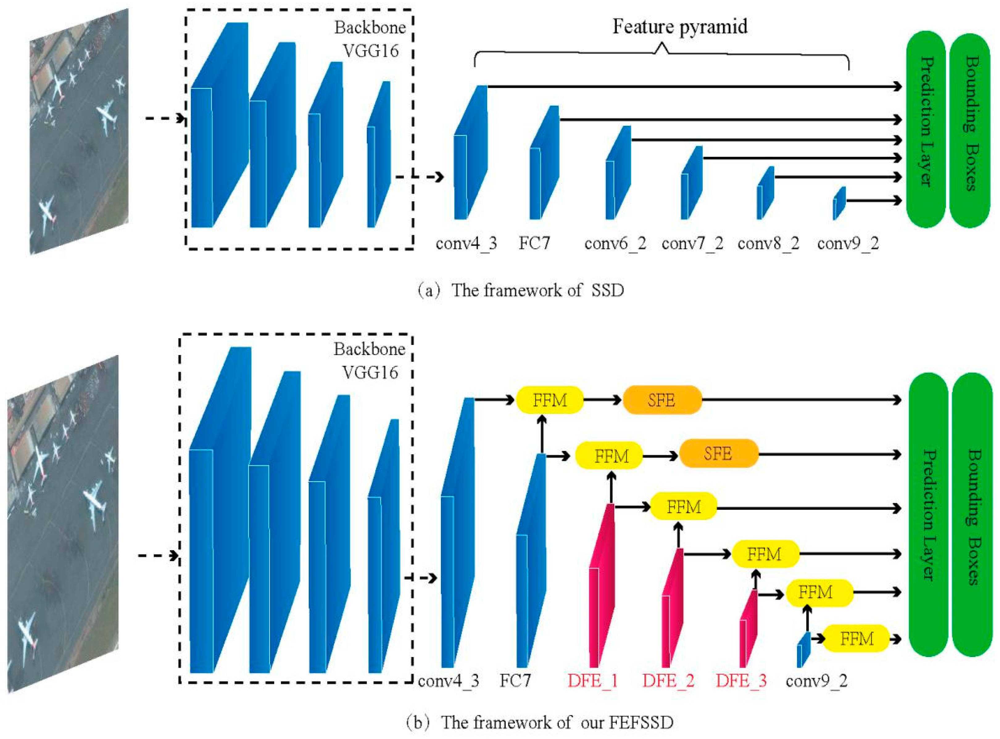

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from torchvision.models import VGG16_Weights

class SSD(nn.Module):
    def __init__(self, num_classes):
        super(SSD, self).__init__()
        self.num_classes = num_classes

        # Load the pre-trained VGG16 model
        vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1).features
        self.features = nn.ModuleList(vgg[:30])  # Use up to the conv5_3 layer

        # Additional layers for SSD
        self.extras = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(512, 1024, kernel_size=3, padding=1, dilation=1),
                nn.ReLU(inplace=True)
            ),
            nn.Sequential(
                nn.Conv2d(1024, 256, kernel_size=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
                nn.ReLU(inplace=True)
            ),
            nn.Sequential(
                nn.Conv2d(512, 128, kernel_size=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
                nn.ReLU(inplace=True)
            ),
            nn.Sequential(
                nn.Conv2d(256, 128, kernel_size=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(128, 256, kernel_size=3),
                nn.ReLU(inplace=True)
            ),
            nn.Sequential(
                nn.Conv2d(256, 128, kernel_size=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(128, 256, kernel_size=3),
                nn.ReLU(inplace=True)
            )
        ])

        # Localization and class prediction layers
        self.loc = nn.ModuleList([
            nn.Conv2d(512, 4 * 4, kernel_size=3, padding=1),  # 4 default boxes
            nn.Conv2d(1024, 6 * 4, kernel_size=3, padding=1),  # 6 default boxes
            nn.Conv2d(512, 6 * 4, kernel_size=3, padding=1),  # 6 default boxes
            nn.Conv2d(256, 6 * 4, kernel_size=3, padding=1),  # 6 default boxes
            nn.Conv2d(256, 4 * 4, kernel_size=3, padding=1),  # 4 default boxes
            nn.Conv2d(256, 4 * 4, kernel_size=3, padding=1)   # 4 default boxes
        ])

        self.conf = nn.ModuleList([
            nn.Conv2d(512, 4 * num_classes, kernel_size=3, padding=1),
            nn.Conv2d(1024, 6 * num_classes, kernel_size=3, padding=1),
            nn.Conv2d(512, 6 * num_classes, kernel_size=3, padding=1),
            nn.Conv2d(256, 6 * num_classes, kernel_size=3, padding=1),
            nn.Conv2d(256, 4 * num_classes, kernel_size=3, padding=1),
            nn.Conv2d(256, 4 * num_classes, kernel_size=3, padding=1)
        ])

    def forward(self, x):
        locs = []
        confs = []

        # Apply base network
        for k in range(len(self.features)):
            x = self.features[k](x)

        # Apply localization and confidence layers on conv4_3 and conv7
        locs.append(self.loc[0](x).permute(0, 2, 3, 1).contiguous())
        confs.append(self.conf[0](x).permute(0, 2, 3, 1).contiguous())

        for (i, layer) in enumerate(self.extras):
            x = layer(x)
            locs.append(self.loc[i+1](x).permute(0, 2, 3, 1).contiguous())
            confs.append(self.conf[i+1](x).permute(0, 2, 3, 1).contiguous())

        # Reshape and concatenate predictions
        locs = torch.cat([o.view(o.size(0), -1) for o in locs], 1)
        confs = torch.cat([o.view(o.size(0), -1) for o in confs], 1)

        locs = locs.view(locs.size(0), -1, 4)
        confs = confs.view(confs.size(0), -1, self.num_classes)

        return locs, confs

# Example usage
if __name__ == "__main__":
    num_classes = 21  # 20 classes + background
    ssd = SSD(num_classes)
    x = torch.randn(1, 3, 300, 300)
    locs, confs = ssd(x)
    print("Localization predictions:", locs.size())
    print("Confidence predictions:", confs.size())


Standard SSD models expect 300x300 or 512x512 input resolution. Ensure input resizing is handled correctly in the data pipeline.

**SSD Variants & Improvements**

- SSD300 vs SSD512 (Larger input improves accuracy)
- MobileNet-SSD (Lightweight version for Edge AI)
- SSD + FPN (Feature Pyramid Networks)
- EfficientDet (Inspired by SSD but better performance)

**MultiBox Loss function**

SSD uses a custom loss function combining:
1. Smooth L1 Loss for localization (bounding box regression)
2. Cross-Entropy Loss for classification (object detection)
3. Hard Negative Mining to balance positive vs. negative samples

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MultiBoxLoss(nn.Module):
    def __init__(self, num_classes, neg_pos_ratio=3):
        super(MultiBoxLoss, self).__init__()
        self.num_classes = num_classes
        self.neg_pos_ratio = neg_pos_ratio
        self.smooth_l1 = nn.SmoothL1Loss(reduction="none")
        self.cross_entropy = nn.CrossEntropyLoss(reduction="none")

    def forward(self, loc_preds, conf_preds, loc_targets, conf_targets):
        """
        loc_preds: (batch_size, num_boxes, 4) -> Predicted bounding boxes
        conf_preds: (batch_size, num_boxes, num_classes) -> Predicted class scores
        loc_targets: (batch_size, num_boxes, 4) -> Ground truth bounding boxes
        conf_targets: (batch_size, num_boxes) -> Ground truth class labels
        """

        # Localization loss: Smooth L1 Loss (only for positive samples)
        pos_mask = conf_targets > 0  # Mask for positive examples
        loc_loss = self.smooth_l1(loc_preds[pos_mask], loc_targets[pos_mask]).sum()

        # Classification loss: Cross-Entropy Loss
        conf_loss = self.cross_entropy(conf_preds.view(-1, self.num_classes), conf_targets.view(-1))

        # Hard Negative Mining
        num_pos = pos_mask.sum(dim=1, keepdim=True)  # Count positives per batch
        num_neg = self.neg_pos_ratio * num_pos  # Limit negatives to 3x positives

        # Sort all confidence losses and pick the top negatives
        conf_loss[pos_mask] = 0  # Ignore positive losses
        conf_loss, loss_idx = conf_loss.sort(dim=1, descending=True)
        rank = torch.arange(conf_loss.size(1), device=conf_loss.device).expand_as(conf_loss)
        neg_mask = rank < num_neg.expand_as(rank)

        # Final classification loss
        conf_loss = conf_loss[neg_mask].sum()

        # Normalize by the number of positive samples (avoid division by zero)
        total_loss = (loc_loss + conf_loss) / num_pos.sum().float()
        return total_loss

**Training SSD on the COCO dataset**

In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader

# Define Transformations
transform = transforms.Compose([
    transforms.Resize((300, 300)),  # Resize for SSD300
    transforms.ToTensor()
])

# Load COCO Dataset
coco_train = CocoDetection(
    root="path_to_coco/train2017",
    annFile="path_to_coco/annotations/instances_train2017.json",
    transform=transform
)

coco_val = CocoDetection(
    root="path_to_coco/val2017",
    annFile="path_to_coco/annotations/instances_val2017.json",
    transform=transform
)

# Define DataLoader
train_loader = DataLoader(coco_train, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(coco_val, batch_size=8, shuffle=False, num_workers=4)



### CNNs for Video Analysis

✔ 3D Convolutions (Conv3D) for Action Recognition

✔ Optical Flow CNNs for Motion Detection

✔ Two-Stream Networks (Spatial + Temporal Processing)

### CNNs in Generative AI


✔ GANs (DCGAN, WGAN, StyleGAN for Image Generation)

✔ Diffusion Models (Stable Diffusion, Denoising CNNs)

autoencoders

✔ Neural Style Transfer with CNNs

### Vision Language Models

### blogs on CNNs

1. What is Translation Invariance? - https://celik-muhammed.medium.com/what-is-translation-invariance-3ec5fc4f3cd4